### Convolutional Neural Network:
#### Color Fundus Photograph Region of Interest --> 58-point VF sensitivity prediction

In [3]:
# import modules
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import matplotlib.image as mpimg
from PIL import Image, ImageOps

This Notebook documents efforts to develop, optimize and evaluate a CNN trained on color fundus photograph regions of interest (ROIs) for multi-regression prediction of 58 visual field (VF) sensitivity values.

**Approach**:<br>
structure-->function mapping

**Rationale**:<br>
this may support glaucoma progression monitoring or risk assessment without routine VF testing at every eye exam visit, especially valuable in settings where access to VF optimetry resources are limited or unavailable.

#### Exploratory Analysis of Available Images

In [4]:
# change working directory to data directory containing ROI images
os.chdir("ROI images")

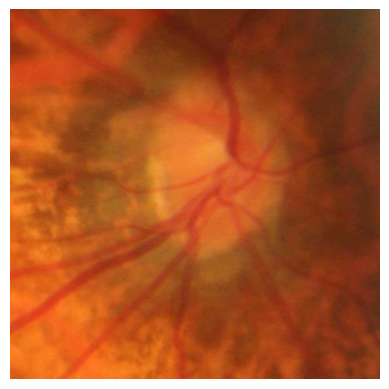

(453, 453, 3)


In [5]:
# sample images

img_path = "1_OD_1.jpg"  # subject 1, visit 1, right eye (OD)

img = mpimg.imread(img_path)

plt.imshow(img.astype(np.uint8))
plt.axis("off")
plt.show()

print(img.shape)

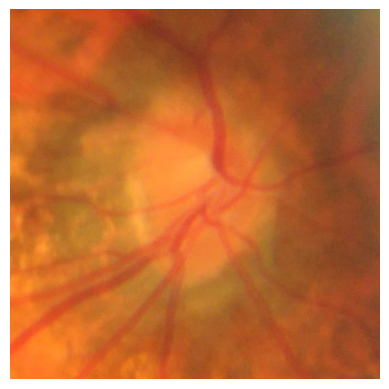

(565, 565, 3)


In [6]:
import matplotlib.image as mpimg

img_path = "1_OD_2.jpg"  # subject 1, visit 2, right eye (OD)

img = mpimg.imread(img_path)

plt.imshow(img.astype(np.uint8))
plt.axis("off")
plt.show()
print(img.shape)

In [8]:
# an alternative approach could use the entire color fundus photograph (CFP) for training input
os.chdir("../CFPs")

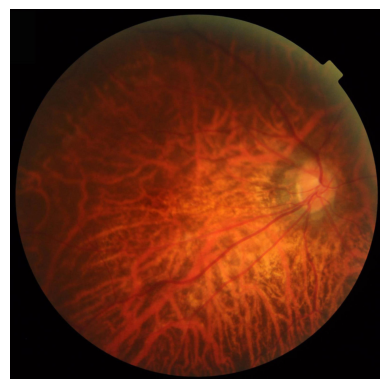

(1556, 1556, 3)


In [9]:
img_path = "1_OD_1.jpg"

img = mpimg.imread(img_path)

plt.imshow(img.astype(np.uint8))
plt.axis("off")
plt.show()

print(img.shape)

In [105]:
# Using the full CFP would require cropping to the circular region and removing black padding
# one approach: consider cropping based on an adaptive radius from the image center
# (adapative here means responsive to image dimensions)

import cv2

def crop_cfp(image):

    img = cv2.imread(image)
    
    center_x = img.shape[1] // 2 
    center_y = img.shape[0] // 2
    radius = int(center_y * 0.94) # adaptive radius
        
    mask = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
    cv2.circle(mask, (center_x, center_y), radius, 255, -1)  # white filled circle
    
    # use alpha channel for transparency
    circular_crop = cv2.cvtColor(img, cv2.COLOR_BGR2BGRA)
    circular_crop[:, :, 3] = mask  # alpha channel = mask
    
    x1 = max(center_x - radius, 0)
    y1 = max(center_y - radius, 0)
    x2 = min(center_x + radius, img.shape[1])
    y2 = min(center_y + radius, img.shape[0])
    cropped = circular_crop[y1:y2, x1:x2]

    cropped_rgb = cv2.cvtColor(cropped, cv2.COLOR_BGRA2RGB)
    image_output = Image.fromarray(cropped_rgb)
    
    return image_output

In [ ]:
# we will focus on the ROIs
os.chdir("ROI images")

#### Visual Field and Associated Clinical Data Import

In [10]:
# get associated data for each subject
# initial visit data
GRAPE_df = pd.read_excel("../GRAPE_Glaucoma_Dataset/VF and clinical information.xlsx", header=0)
# initial visit data with all follow-ups, focus on VF data
GRAPE_followup_df = pd.read_csv("../UW_and_GRAPE_data/GRAPE_FollowUps.csv", header=0)

In [12]:
GRAPE_df.head()

,Subject Number,Laterality,Age,Gender,IOP,CCT,Total Visits,PLR2,PLR3,MD,...,51,52,53,54,55,56,57,58,59,60
0,1,OD,46,F,14.7,535,3,0,0,0,...,20,22,21,23,26,14,13,19,20,21
1,1,OS,46,F,15.3,525,4,0,0,0,...,21,22,21,21,21,23,25,22,25,22
2,2,OS,57,M,15.5,545,3,0,0,0,...,17,20,24,13,-1,-1,-1,-1,-1,23
3,3,OD,41,M,17.0,557,7,1,0,1,...,27,25,16,21,22,23,23,22,26,30
4,4,OS,58,M,14.7,487,4,0,0,0,...,21,22,22,16,24,23,22,12,14,27


In [20]:
GRAPE_followup_df.columns

Index(['Subject Number', 'Laterality', 'Visit Number', 'Interval Years', 'IOP',
       'Corresponding CFP', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21',
       '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33',
       '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45',
       '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57',
       '58', '59'],
      dtype='object')

In [15]:
# some followup visit data are not associated with CFP/ROI images
# drop these from the dataframe
GRAPE_followup_df_images = GRAPE_followup_df[GRAPE_followup_df["Corresponding CFP"] != "/"].reset_index(drop=True)

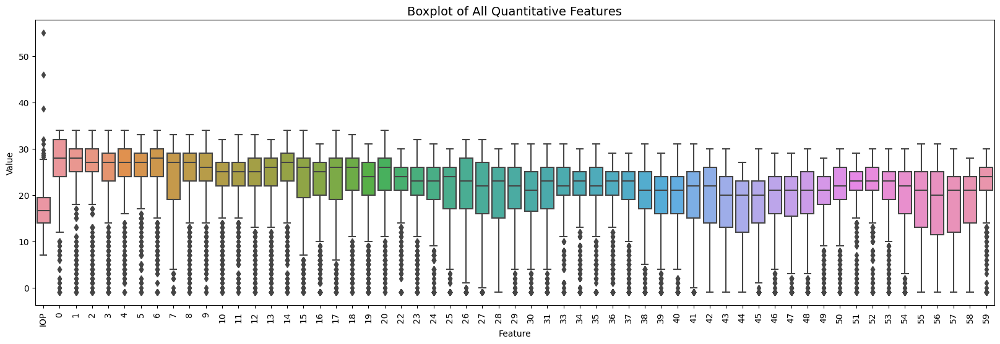

In [21]:
# Look at distribution of values across IOP (intraocular pressure) and all VF values
# NOTE: VF indices 21 and 32 correspond to blindspots; drop in all subjects
cols = ['IOP','0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20', 
        '22','23','24','25','26','27','28','29','30','31','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

df_subset = GRAPE_followup_df_images[cols]

df_melted = df_subset.melt(var_name='Feature', value_name='Value')
plt.figure(figsize=(20,6))  # wide figure for 60 features
sns.boxplot(x='Feature', y='Value', data=df_melted)
plt.xticks(rotation=90)  # rotate x labels for readability
plt.title("Boxplot of All Quantitative Features", fontsize=14)
plt.show()


#### Functions for Image Processing, VF Interpolation & Visualization

In [22]:
from scipy.interpolate import Rbf

'''
GRAPE Follow Up VFs
'''

#grape_fu = pd.read_csv("data/GRAPE_FollowUps.csv")
#cropped_df = grape_fu.drop(columns = ['Interval Years', 'IOP', 'Corresponding CFP'])
cropped_df = GRAPE_followup_df_images.drop(columns = ['Interval Years', 'IOP','Corresponding CFP'])

cropped_np = np.array(cropped_df)

# coordinates by index (Octopus perimetry)
all_coords = np.array([
    (0,0), (1,-1), (-1,-1), (-1,1), (1,1), (2,-2), (-2,-2), (-2,2),
    (2,2), (4,-1), (4,-4), (1,-4), (-1,-4), (-4,-4), (-4,-1), (-4,1), (-4,4),
    (-1,4), (1,4), (4,4), (4,1), (6,0), (6,-6), (2,-6), (-2,-6), (-6,-6),
    (-6,-1), (-6,1), (-6,6), (-2,6), (2,6), (6,6), (8,-1), (8,-6), (8,-8), (6,-8), (2,-8), 
    (-2,-8), (-6,-8), (-8,-8), (-8,-6), (-8,-1), (-8,1), (-8,6), (-8,8), (-6,8), (-2,8), (2,8), (6,8),
    (8,8), (8,6), (8,1), (10,-3), (3,-10), (-3,-10), (-10, -2), (-10,2), (-3,10), (3,10), (10,3)
])

radius = 12

grid_x, grid_y = np.mgrid[-12:12:200j, -12:12:200j]
mask = (np.sqrt(grid_x**2 + grid_y**2) <= radius)
mask_float = mask.astype(np.float32)

"""
For each point in cropped_np, create a visual field map:

1. Take the point’s values (pt[3:]).
2. Interpolate over a grid using RBF with fixed VF coordinates.
3. Apply a circular mask of radius 12.
4. Replace values outside the mask with 0.
5. Save the result (values + mask) as a .npy file named "{pt[0]}_{pt[1]}.npy".

Final grid is (200, 200, 2)
    - [:,:,0]  interpolated visual field values
    - [:,:,1] mask indicating the visual field area (1.0 inside, 0.0 outside)
"""
for pt in cropped_np:
    pt_vf = np.array(pt[3:], dtype=int)

    rbf = Rbf(all_coords[:,0], all_coords[:,1], pt_vf, function='thin_plate')
    grid_z = rbf(grid_x, grid_y)
    masked_grid = np.where(mask, grid_z, np.nan)
    
    values = np.nan_to_num(masked_grid, nan=0.0)
    x = np.stack([values.T, mask_float], axis=-1)
    np.save(f"{pt[0]}_{pt[1]}_{pt[2]}.npy", x)

KeyboardInterrupt: 

In [63]:
## Visual Field Interpolation
def interpolate_VF(row):
    
    VF_cols = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
   '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21',
   '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33',
   '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45',
   '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57',
   '58', '59']
    
    VF_df = row[VF_cols]

    VF_np = np.array(VF_df)
    
    all_coords = np.array([
    (0,0), (1,-1), (-1,-1), (-1,1), (1,1), (2,-2), (-2,-2), (-2,2),
    (2,2), (4,-1), (4,-4), (1,-4), (-1,-4), (-4,-4), (-4,-1), (-4,1), (-4,4),
    (-1,4), (1,4), (4,4), (4,1), (6,0), (6,-6), (2,-6), (-2,-6), (-6,-6),
    (-6,-1), (-6,1), (-6,6), (-2,6), (2,6), (6,6), (8,-1), (8,-6), (8,-8), (6,-8), (2,-8), 
    (-2,-8), (-6,-8), (-8,-8), (-8,-6), (-8,-1), (-8,1), (-8,6), (-8,8), (-6,8), (-2,8), (2,8), (6,8),
    (8,8), (8,6), (8,1), (10,-3), (3,-10), (-3,-10), (-10, -2), (-10,2), (-3,10), (3,10), (10,3)])

    radius = 12

    grid_x, grid_y = np.mgrid[-12:12:200j, -12:12:200j]
    mask = (np.sqrt(grid_x**2 + grid_y**2) <= radius)
    mask_float = mask.astype(np.float32)
    
    """
    For each point in cropped_np, create a visual field map:
    
    1. Take the point’s values (pt[3:]).
    2. Interpolate over a grid using RBF with fixed VF coordinates.
    3. Apply a circular mask of radius 12.
    4. Replace values outside the mask with 0.
    5. Save the result (values + mask) as a .npy file named "{pt[0]}_{pt[1]}.npy".
    
    Final grid is (200, 200, 2)
        - [:,:,0]  interpolated visual field values
        - [:,:,1] mask indicating the visual field area (1.0 inside, 0.0 outside)
    """

    pt_vf = np.array(VF_np, dtype=float)

    rbf = Rbf(all_coords[:,0], all_coords[:,1], pt_vf, function='thin_plate')
    grid_z = rbf(grid_x, grid_y)
    masked_grid = np.where(mask, grid_z, np.nan)
    
    values = np.nan_to_num(masked_grid, nan=0.0)
    x = np.stack([values.T, mask_float], axis=-1)

    return x



In [23]:
# Plot interpolated VF, from array
def plot_VF(arr, mask_invalid=True, cmap='viridis'):
    """
    Plot visual field map from Octopus arr containing sensitivity and mask.
    """
    
    sens = arr[:,:,0]
    mask = arr[:,:,1]
    
    # Apply mask
    if mask_invalid:
        sens_masked = np.where((mask==0), np.nan, sens)
    else:
        sens_masked = sens

    plt.figure(figsize=(8,8))
    plt.imshow(sens_masked, cmap=cmap, origin='lower')
    plt.colorbar(label='Sensitivity (dB)')
    plt.title("Visual Field")
    plt.axis('off')
    plt.show()

In [ ]:
# Plot interpolated VF, from .npy file
def plot_vf_from_npy(file_path, mask_invalid=True, cmap='viridis'):
    """
    Plot visual field map from Octopus .npy file containing sensitivity and mask.
    
    Parameters:
        file_path: path to the .npy file
        mask_channel: mask channel in last dimension (1)
        sens_channel: sensitivities channel in last dimension (0)
        mask_invalid: if True, invalid points (mask==0 or sensitivity<0) set to NaN
        cmap: colormap for plotting
    """
    arr = np.load(file_path)
    
    sens = arr[:,:,0]
    mask = arr[:,:,1]
    
    # Apply mask
    if mask_invalid:
        sens_masked = np.where((mask==0), np.nan, sens)
    else:
        sens_masked = sens

    plt.figure(figsize=(8,8))
    plt.imshow(sens_masked, cmap=cmap, origin='lower')
    plt.colorbar(label='Sensitivity (dB)')
    plt.title("Visual Field")
    plt.axis('off')
    plt.show()

plot_vf_from_npy("4_OS_3.npy")


In [24]:
# assess unique subject count
GRAPE_followup_df_images["Subject Number"].unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144])

In [ ]:
import matplotlib.pyplot as plt

def plot_vf_cfp_grid(vf_left, vf_right, cfp_left, cfp_right, cmap='viridis', figsize=(3,3), subject=1, visit=1):
    """
    vf_left, vf_right: (H, W, 2) interpolated VF arrays from interpolate_VF()
    cfp_left, cfp_right: (H_img, W_img, 3) fundus images as numpy arrays
    """
    fig, axs = plt.subplots(2, 2, figsize=figsize)

    # First row: VF maps
    axs[0,0].imshow(vf_left[:,:,0], cmap=cmap)
    axs[0,0].set_title('VF (Left Eye)', fontsize=10)
    axs[0,0].axis('off')

    axs[0,1].imshow(vf_right[:,:,0], cmap=cmap)
    axs[0,1].set_title('VF (Right Eye)', fontsize=10)
    axs[0,1].axis('off')

    # Second row: CFP images
    #cfp_left = np.array(Image.open(cfp_left)).astype(np.float32)
    axs[1,0].imshow(cfp_left)
    axs[1,0].set_title('CFP (Left Eye)', fontsize=10)
    axs[1,0].axis('off')

    #cfp_right = np.array(Image.open(cfp_right)).astype(np.float32)
    axs[1,1].imshow(cfp_right)
    axs[1,1].set_title('CFP (Right Eye)', fontsize=10)
    axs[1,1].axis('off')

    fig.suptitle(f"Subject {subject}, Visit {visit}", fontsize=12)

    plt.tight_layout()
    plt.show()


In [ ]:
import matplotlib.pyplot as plt

def plot_vf_cfp_grid_right( vf_right, cfp_right, cmap='viridis', figsize=(3,3), subject=1, visit=1):
    """
    vf_left, vf_right: (H, W, 2) interpolated VF arrays from interpolate_VF()
    cfp_left, cfp_right: (H_img, W_img, 3) fundus images as numpy arrays
    """
    fig, axs = plt.subplots(2, 2, figsize=figsize)

    # First row: VF maps
    axs[0,1].imshow(vf_right[:,:,0], cmap=cmap)
    axs[0,1].set_title('VF (Right Eye)', fontsize=10)
    axs[0,1].axis('off')

    # Second row: CFP images

    axs[1,1].imshow(cfp_right)
    axs[1,1].set_title('CFP (Right Eye)', fontsize=10)
    axs[1,1].axis('off')

    fig.suptitle(f"Subject {subject}, Visit {visit}", fontsize=12)

    plt.tight_layout()
    plt.show()


In [ ]:
import matplotlib.pyplot as plt

def plot_vf_cfp_grid_left(vf_left, cfp_left, cmap='viridis', figsize=(3,3), subject=1, visit=1):
    """
    vf_left, vf_right: (H, W, 2) interpolated VF arrays from interpolate_VF()
    cfp_left, cfp_right: (H_img, W_img, 3) fundus images as numpy arrays
    """
    fig, axs = plt.subplots(2, 2, figsize=figsize)

    # First row: VF maps
    axs[0,0].imshow(vf_left[:,:,0], cmap=cmap)
    axs[0,0].set_title('VF (Left Eye)', fontsize=10)
    axs[0,0].axis('off')

    # Second row: CFP images
    #cfp_left = np.array(Image.open(cfp_left)).astype(np.float32)
    axs[1,0].imshow(cfp_left)
    axs[1,0].set_title('CFP (Left Eye)', fontsize=10)
    axs[1,0].axis('off')

    fig.suptitle(f"Subject {subject}, Visit {visit}", fontsize=12)

    plt.tight_layout()
    plt.show()


In [25]:
# Look at example eye sets
# for subject in GRAPE_followup_df_images["Subject Number"].unique():
for subject in [1,7]:
    subject_df = GRAPE_followup_df_images[GRAPE_followup_df_images["Subject Number"] == subject]
    visits = sorted(list(subject_df["Visit Number"].unique()))
    eyes = list(subject_df["Laterality"].unique())
    visit = 1
    left_eye = subject_df[(subject_df["Laterality"] == "OS") & (subject_df["Visit Number"] == visit)]
    right_eye = subject_df[(subject_df["Laterality"] == "OD") & (subject_df["Visit Number"] == visit)]

    vf_left = interpolate_VF(left_eye.iloc[0])
    vf_right = interpolate_VF(right_eye.iloc[0])

    cfp_left = subject_df[(subject_df["Laterality"] == "OS") & (subject_df["Visit Number"] == visit)]["Corresponding CFP"].iloc[0]
    cfp_right = subject_df[(subject_df["Laterality"] == "OD") & (subject_df["Visit Number"] == visit)]["Corresponding CFP"].iloc[0]
    
    #size = (200, 200)
    cfp_left_img = np.array(Image.open(cfp_left).resize(size)).astype(np.uint8)
    cfp_right_img = np.array(Image.open(cfp_right).resize(size)).astype(np.uint8)
    
    plot_vf_cfp_grid(vf_left, vf_right, cfp_left_img, cfp_right_img, subject=subject, visit=visit)
    #for index, row in subject_df.iterrows():
    ##    for eye in eyes:
     #       plt.figure
     #       arr = interpolate_VF(row)
     #       plot_VF(arr, mask_invalid=True, cmap='viridis')


NameError: name 'interpolate_VF' is not defined

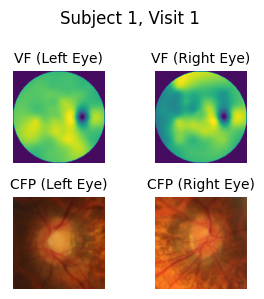

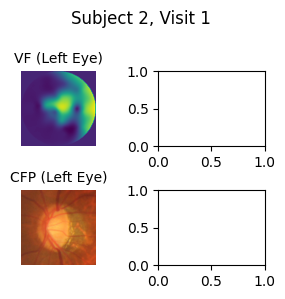

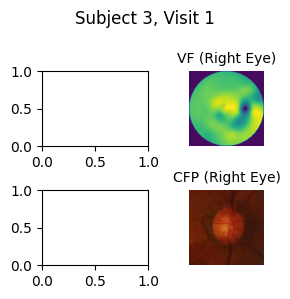

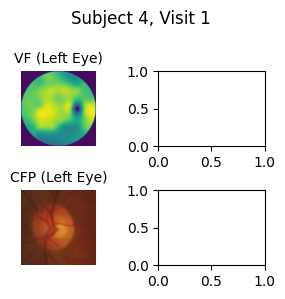

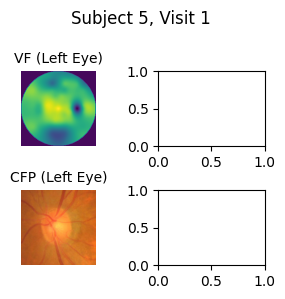

...

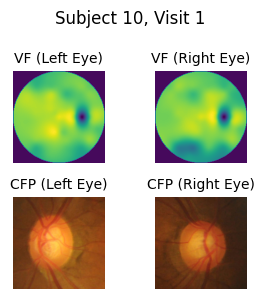

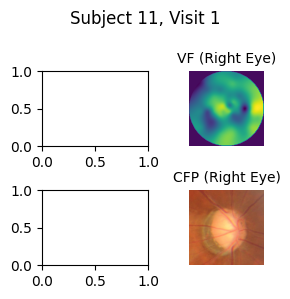

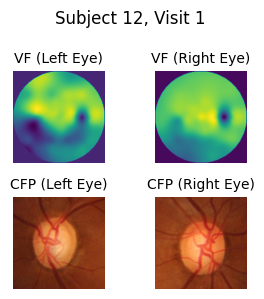

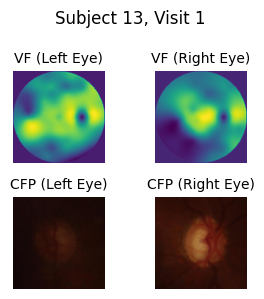

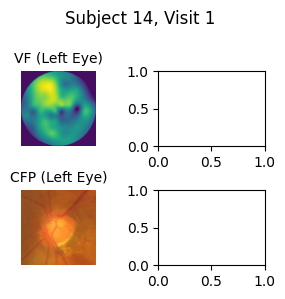

KeyboardInterrupt: 

In [191]:
# Look at example eye sets
for subject in GRAPE_followup_df_images["Subject Number"].unique():
    subject_df = GRAPE_followup_df_images[GRAPE_followup_df_images["Subject Number"] == subject]
    visits = sorted(list(subject_df["Visit Number"].unique()))
    eyes = list(subject_df["Laterality"].unique())
    visit = 1
    if len(eyes) > 1:
        left_eye = subject_df[(subject_df["Laterality"] == "OS") & (subject_df["Visit Number"] == visit)]
        right_eye = subject_df[(subject_df["Laterality"] == "OD") & (subject_df["Visit Number"] == visit)]
    
        vf_left = interpolate_VF(left_eye.iloc[0])
        vf_right = interpolate_VF(right_eye.iloc[0])
    
        cfp_left = subject_df[(subject_df["Laterality"] == "OS") & (subject_df["Visit Number"] == visit)]["Corresponding CFP"].iloc[0]
        cfp_right = subject_df[(subject_df["Laterality"] == "OD") & (subject_df["Visit Number"] == visit)]["Corresponding CFP"].iloc[0]
        
        #size = (200, 200)
        cfp_left_img = np.array(Image.open(cfp_left).resize(size)).astype(np.uint8)
        cfp_right_img = np.array(Image.open(cfp_right).resize(size)).astype(np.uint8)
        
        plot_vf_cfp_grid(vf_left, vf_right, cfp_left_img, cfp_right_img, subject=subject, visit=visit)

    elif "OS" in eyes:
        left_eye = subject_df[(subject_df["Laterality"] == "OS") & (subject_df["Visit Number"] == visit)]
    
        vf_left = interpolate_VF(left_eye.iloc[0])
    
        cfp_left = subject_df[(subject_df["Laterality"] == "OS") & (subject_df["Visit Number"] == visit)]["Corresponding CFP"].iloc[0]
        
        #size = (200, 200)
        cfp_left_img = np.array(Image.open(cfp_left).resize(size)).astype(np.uint8)
        
        plot_vf_cfp_grid_left(vf_left, cfp_left_img, subject=subject, visit=visit)

    elif "OD" in eyes:
        right_eye = subject_df[(subject_df["Laterality"] == "OD") & (subject_df["Visit Number"] == visit)]
    
        vf_right = interpolate_VF(right_eye.iloc[0])
    
        cfp_right = subject_df[(subject_df["Laterality"] == "OD") & (subject_df["Visit Number"] == visit)]["Corresponding CFP"].iloc[0]
        
        #size = (200, 200)
        cfp_right_img = np.array(Image.open(cfp_right).resize(size)).astype(np.uint8)
        
        plot_vf_cfp_grid_right(vf_right, cfp_right_img, subject=subject, visit=visit)



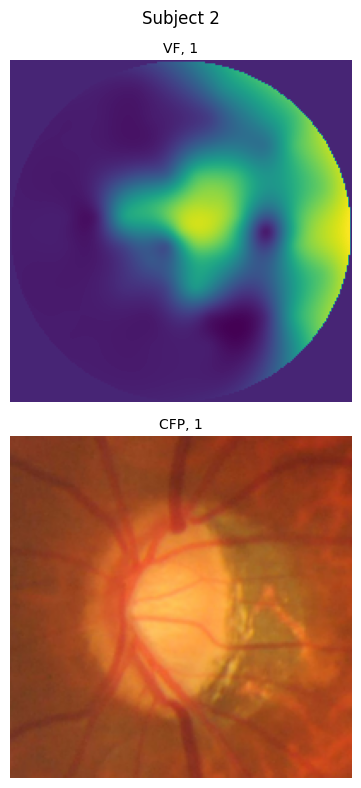

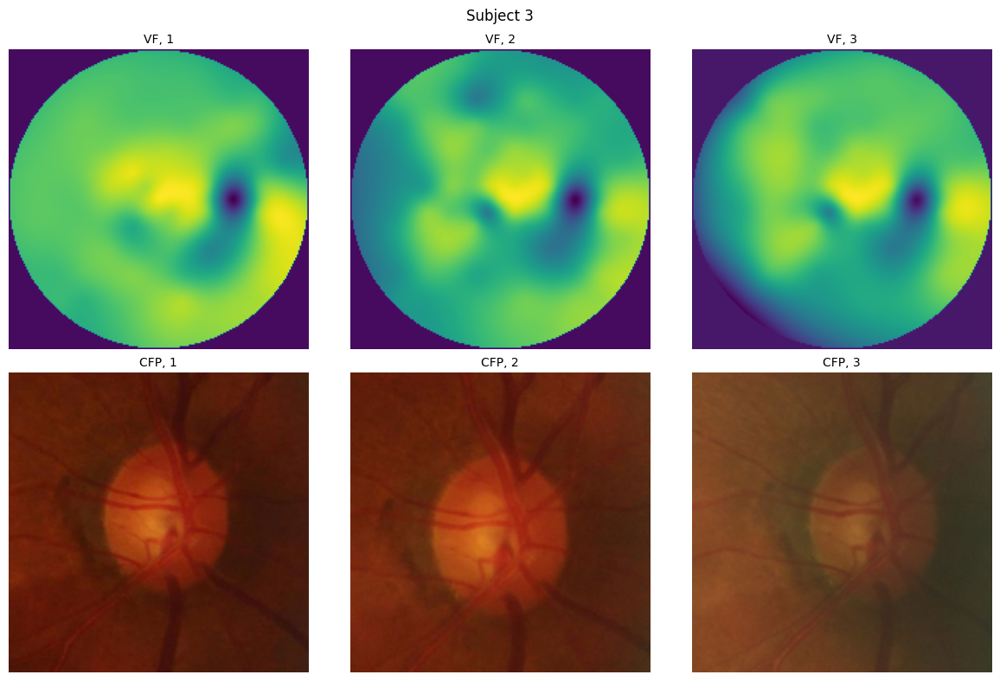

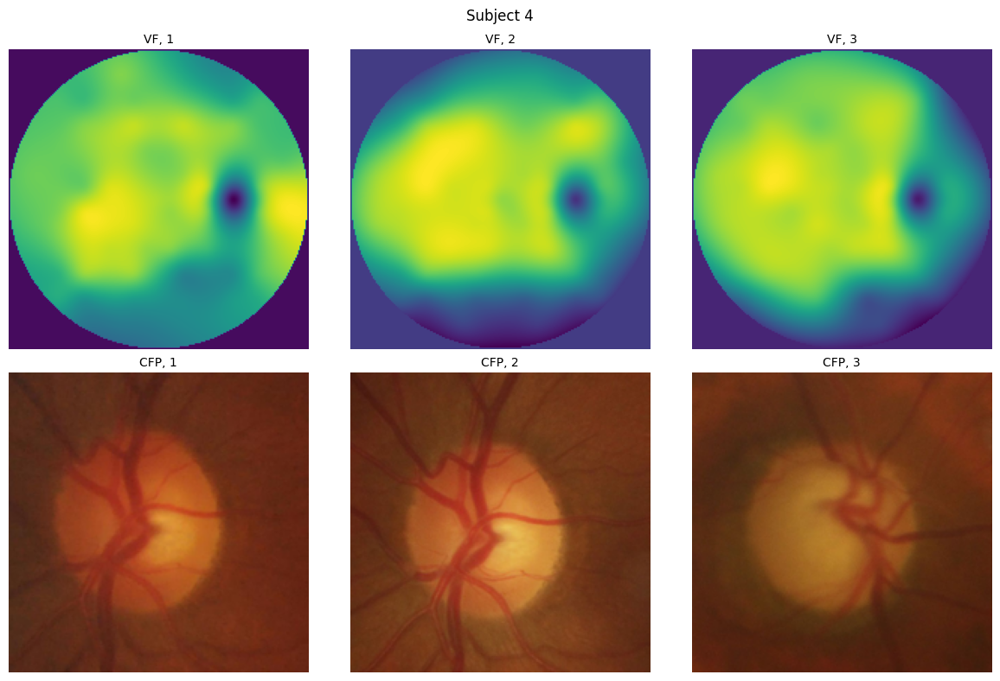

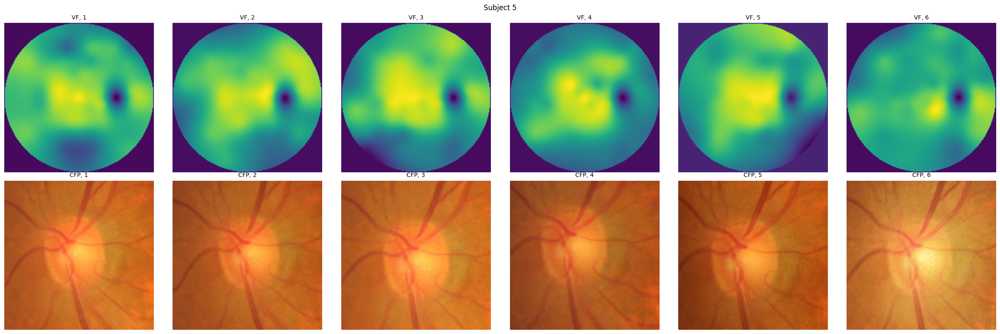

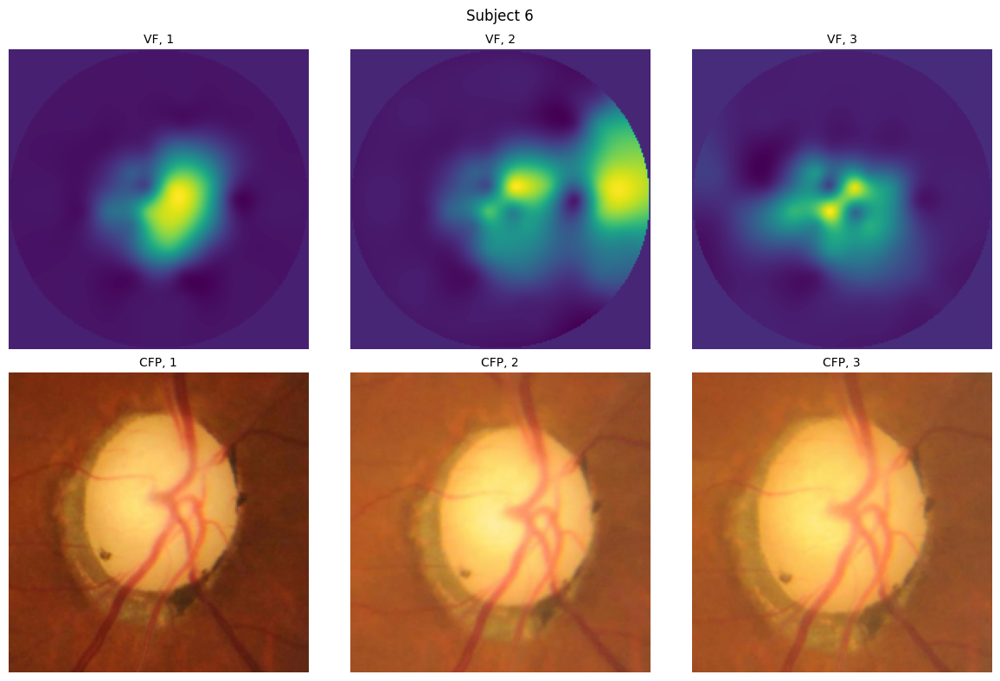

...

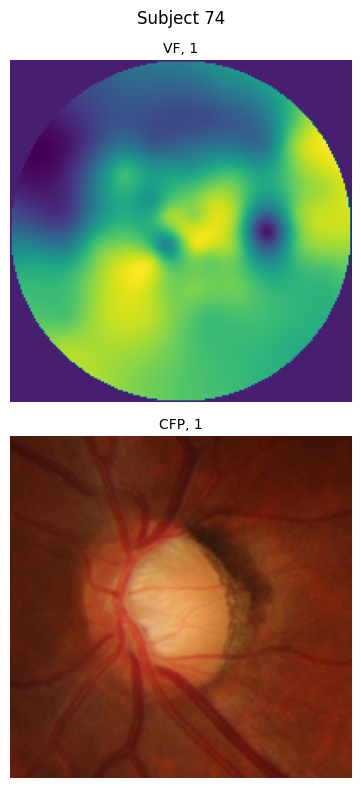

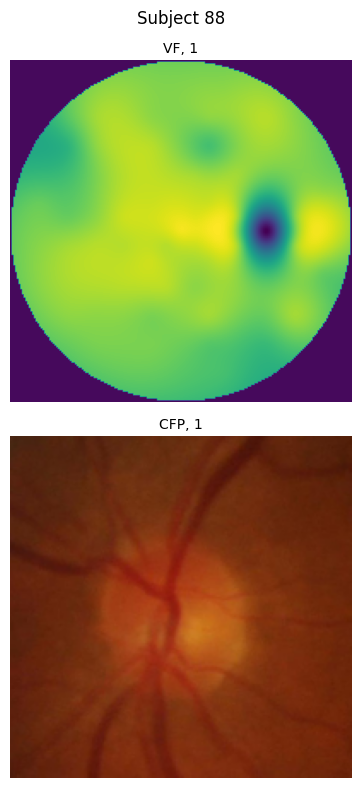

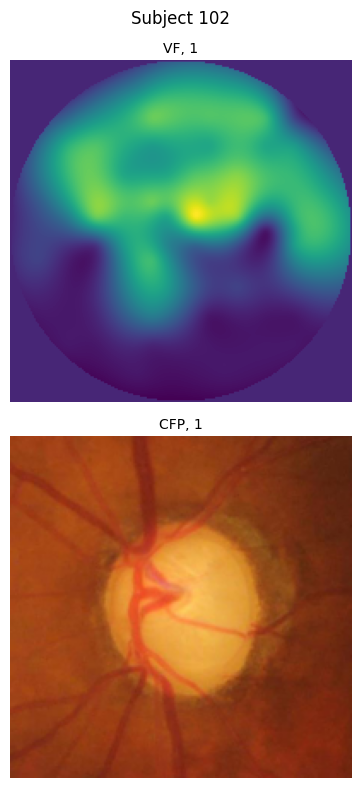

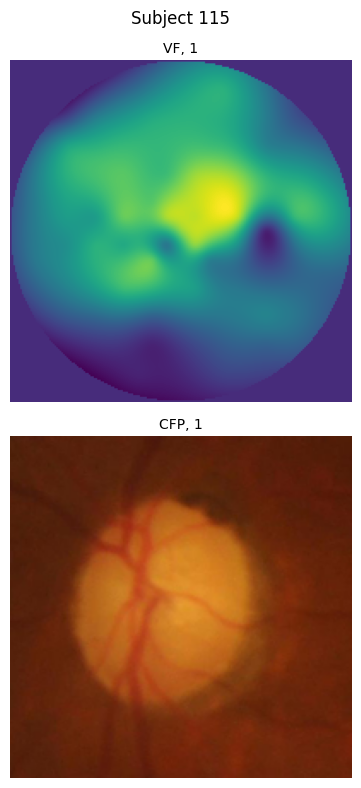

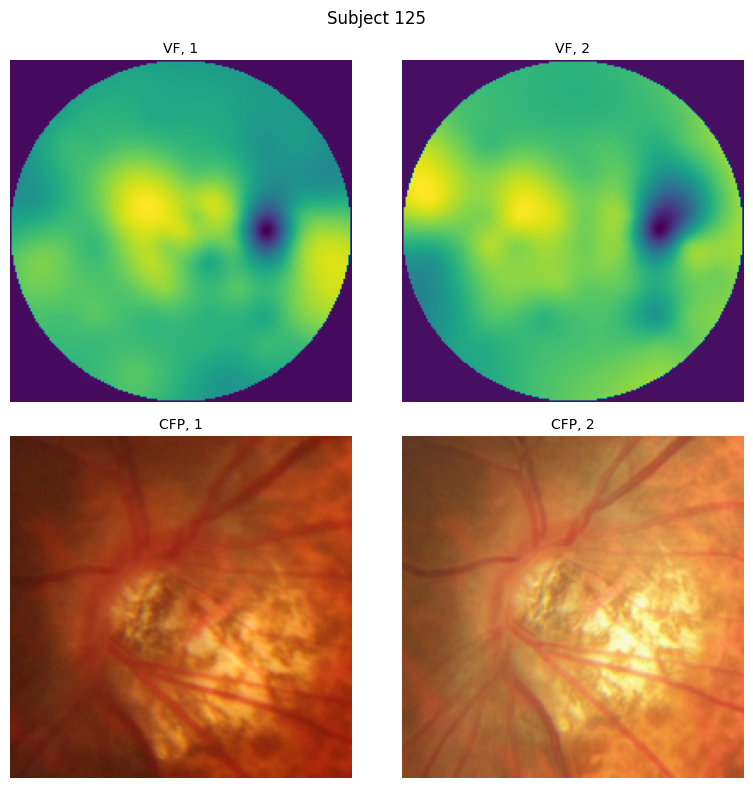

In [205]:
# Look at example eye sets, plot visit images side-by-side
for subject in GRAPE_followup_df_images["Subject Number"].unique():
    subject_df = GRAPE_followup_df_images[GRAPE_followup_df_images["Subject Number"] == subject]
    visits = sorted(list(subject_df["Visit Number"].unique()))
    eyes = list(subject_df["Laterality"].unique())
    
    vfs = []
    cfps = []
    
    if len(eyes) > 1:
        continue
        # for visit in visits:
        #     left_eye = subject_df[(subject_df["Laterality"] == "OS") & (subject_df["Visit Number"] == visit)]
        #     right_eye = subject_df[(subject_df["Laterality"] == "OD") & (subject_df["Visit Number"] == visit)]
        
        #     vf_left = interpolate_VF(left_eye.iloc[0])
        #     vf_right = interpolate_VF(right_eye.iloc[0])
        
        #     cfp_left = subject_df[(subject_df["Laterality"] == "OS") & (subject_df["Visit Number"] == visit)]["Corresponding CFP"].iloc[0]
        #     cfp_right = subject_df[(subject_df["Laterality"] == "OD") & (subject_df["Visit Number"] == visit)]["Corresponding CFP"].iloc[0]
            
        #     #size = (200, 200)
        #     cfp_left_img = np.array(Image.open(cfp_left).resize(size)).astype(np.uint8)
        #     cfp_right_img = np.array(Image.open(cfp_right).resize(size)).astype(np.uint8)

        #     vfs.append((vf_left, vf_right))
        #     cfps.append((cfp_left, cfp_right))
            
        #     plot_vf_cfp_grid_visits(vf_left, vf_right, cfp_left_img, cfp_right_img, subject=subject, visits=visits)

    elif "OS" in eyes:
        for visit in visits:
            left_eye = subject_df[(subject_df["Laterality"] == "OS") & (subject_df["Visit Number"] == visit)]
    
            vf_left = interpolate_VF(left_eye.iloc[0])
        
            cfp_left = subject_df[(subject_df["Laterality"] == "OS") & (subject_df["Visit Number"] == visit)]["Corresponding CFP"].iloc[0]
            
            #size = (200, 200)
            cfp_left_img = np.array(Image.open(cfp_left).resize(size)).astype(np.uint8)

            vfs.append(vf_left)
            cfps.append(cfp_left_img)
                       
        plot_vf_cfp_grid_visits(vfs, cfps, subject=subject, visits=visits)

    elif "OD" in eyes:
        for visit in visits:
            right_eye = subject_df[(subject_df["Laterality"] == "OD") & (subject_df["Visit Number"] == visit)]
    
            vf_right = interpolate_VF(right_eye.iloc[0])
        
            cfp_right = subject_df[(subject_df["Laterality"] == "OD") & (subject_df["Visit Number"] == visit)]["Corresponding CFP"].iloc[0]
            
            #size = (200, 200)
            cfp_right_img = np.array(Image.open(cfp_right).resize(size)).astype(np.uint8)

            vfs.append(vf_right)
            cfps.append(cfp_right_img)
            
        plot_vf_cfp_grid_visits(vfs, cfps, subject=subject, visits=visits)



In [ ]:


def plot_vf_cfp_grid_visits(vfs, cfps, cmap='viridis', figsize=(4*len(visits), 8), subject=1, visits=[1]):
    """
    vf_left, vf_right: (H, W, 2) interpolated VF arrays from interpolate_VF()
    cfp_left, cfp_right: (H_img, W_img, 3) fundus images as numpy arrays
    """
    fig, axs = plt.subplots(2, len(visits), figsize=(4*len(visits), 8))
    if len(visits) == 1:
        axs = axs.reshape(2,1)
        
    # First row: VF maps
    for index, vf in enumerate(vfs):
        axs[0,index].imshow(vf[:,:,0], cmap=cmap)
        axs[0,index].set_title(f'VF, {index+1}', fontsize=10)
        axs[0,index].axis('off')

    # Second row: CFP images
    for index, cfp in enumerate(cfps):
        axs[1,index].imshow(cfp)
        axs[1,index].set_title(f'CFP, {index+1}', fontsize=10)
        axs[1,index].axis('off')

    fig.suptitle(f"Subject {subject}", fontsize=12)

    plt.tight_layout()
    plt.show()


#### EDA: Image count assessments

In [28]:
# First visit CFPs
from collections import Counter
Counter(GRAPE_df.groupby('Subject Number')['Corresponding CFP'].count())

Counter({2: 119, 1: 25})

In [29]:
# 119 subjects have both eye data; 25 have 1 eye data -> 144 total subjects
Counter(GRAPE_df['Total Visits'])

Counter({3: 100, 4: 75, 7: 13, 6: 32, 5: 38, 8: 3, 9: 2})

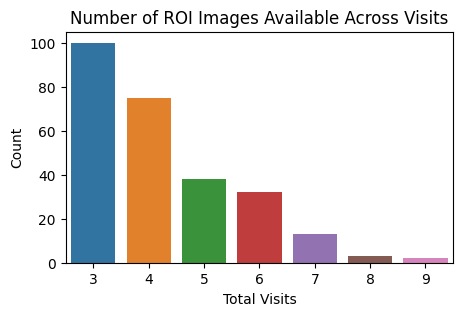

In [31]:
# Evaluate number of images available for each visit, across entire visit distribution
counts = Counter(GRAPE_df['Total Visits'])

df_counts = pd.DataFrame({
    'Total Visits': list(counts.keys()),
    'Count': list(counts.values())})

plt.figure(figsize=(5,3))
sns.barplot(data=df_counts, x='Total Visits', y='Count')
plt.title("Number of ROI Images Available Across Visits")
plt.show()

There are 144 Subjects


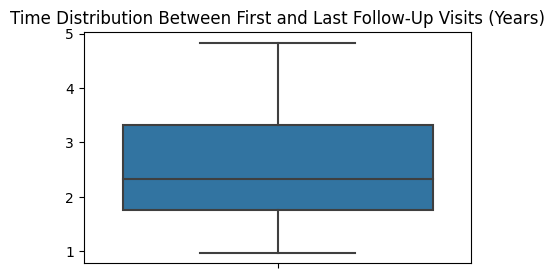

In [34]:
# Evaluate distribution of times between first and last follow-up visits
times = []
subject_counter = 0
number_visits = []
for subject in GRAPE_followup_df["Subject Number"].unique():
    subject_df = GRAPE_followup_df[GRAPE_followup_df["Subject Number"] == subject]
    visits = sorted(list(subject_df["Visit Number"].unique()))
    time = subject_df[subject_df["Visit Number"] == visits[-1]]["Interval Years"].iloc[0]
    times.append(time)
    subject_counter += 1
    number_visits.append(len(visits))
print(f"There are {subject_counter} Subjects")
plt.figure(figsize=(5,3))
plt.title("Time Distribution Between First and Last Follow-Up Visits (Years)")
sns.boxplot(y=times);


There are 106 Subjects


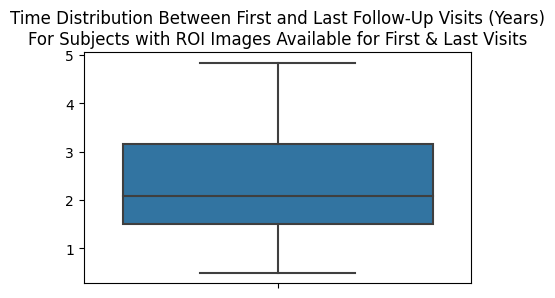

In [36]:
# Now check for those with images that also correspond across the time frame

times_images = []
subject_counter = 0
number_visits = []

for subject in GRAPE_followup_df_images["Subject Number"].unique():
    subject_df = GRAPE_followup_df_images[GRAPE_followup_df_images["Subject Number"] == subject]
    visits = sorted(list(subject_df["Visit Number"].unique()))
    if len(visits) > 1:
        time = subject_df[subject_df["Visit Number"] == visits[-1]]["Interval Years"].iloc[0]
        times_images.append(time)
        subject_counter += 1
        number_visits.append(len(visits))
        
print(f"There are {subject_counter} Subjects")
plt.figure(figsize=(5,3))
plt.title("Time Distribution Between First and Last Follow-Up Visits (Years)\nFor Subjects with ROI Images Available for First & Last Visits")
sns.boxplot(y=times_images);


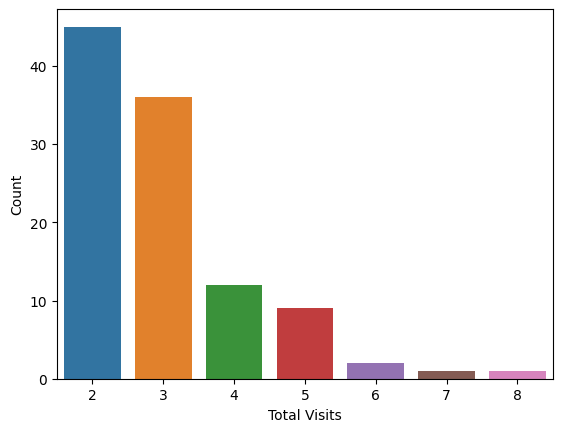

In [83]:
# Evaluate number of images available for each visit, across entire visit distribution
counts = Counter(number_visits)

df_counts = pd.DataFrame({
    'Total Visits': list(counts.keys()),
    'Count': list(counts.values())
})

sns.barplot(data=df_counts, x='Total Visits', y='Count')
plt.show()

In [ ]:
# 12-01-2025
# CNN EFFORT 1
# Look at all initial visit data
# Use CNN to extract feature information from full CFP and cropped ROI (optic nerve head)
# Use multi-target prediction for all 60 VF data points (linear vector)
# --> render interpolated VF image
# --> compare to actual VF image

# compare to multi-target prediction 

In [90]:
GRAPE_followup_df_images[GRAPE_followup_df_images["Visit Number"] == 1].replace(-1, np.nan)

,Subject Number,Laterality,Visit Number,Interval Years,IOP,Corresponding CFP,0,1,2,3,...,50,51,52,53,54,55,56,57,58,59
0,1,OD,1,0.0,14.7,1_OD_1.jpg,21.0,22.0,20.0,23.0,...,20.0,22.0,21.0,23.0,26.0,14.0,13.0,19.0,20.0,21.0
3,1,OS,1,0.0,15.3,1_OS_1.jpg,24.0,26.0,23.0,26.0,...,21.0,22.0,21.0,21.0,21.0,23.0,25.0,22.0,25.0,22.0
6,2,OS,1,0.0,15.5,2_OS_1.jpg,25.0,29.0,23.0,6.0,...,17.0,20.0,24.0,13.0,NaN,NaN,NaN,NaN,NaN,23.0
7,3,OD,1,0.0,17.0,3_OD_1.jpg,31.0,31.0,27.0,26.0,...,27.0,25.0,16.0,21.0,22.0,23.0,23.0,22.0,26.0,30.0
10,4,OS,1,0.0,14.7,4_OS_1.jpg,26.0,25.0,26.0,27.0,...,21.0,22.0,22.0,16.0,24.0,23.0,22.0,12.0,14.0,27.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
621,142,OS,1,0.0,20.7,142_OS_1.jpg,12.0,22.0,8.0,6.0,...,27.0,24.0,23.0,3.0,3.0,NaN,14.0,28.0,27.0,25.0
623,143,OD,1,0.0,9.0,143_OD_1.jpg,25.0,29.0,28.0,28.0,...,27.0,27.0,27.0,28.0,27.0,28.0,27.0,26.0,26.0,26.0
625,143,OS,1,0.0,8.0,143_OS_1.jpg,24.0,28.0,27.0,25.0,...,21.0,24.0,28.0,28.0,27.0,26.0,24.0,25.0,25.0,22.0
627,144,OD,1,0.0,20.0,144_OD_1.jpg,31.0,31.0,30.0,31.0,...,29.0,26.0,24.0,24.0,27.0,26.0,24.0,16.0,23.0,27.0


In [ ]:
# Need to mask NaN

vf = torch.tensor(vf_array, dtype=torch.float32)
mask = ~torch.isnan(vf)  # True where valid

pred = model(img)

loss = (criterion(pred[mask], vf[mask]))

In [20]:
from PIL import Image, ImageOps

In [97]:
GRAPE_followup_df_images

,Subject Number,Laterality,Visit Number,Interval Years,IOP,Corresponding CFP,0,1,2,3,...,50,51,52,53,54,55,56,57,58,59
0,1,OD,1,0.000000,14.7,1_OD_1.jpg,21,22,20,23,...,20,22,21,23,26,14,13,19,20,21
1,1,OD,2,0.838356,17.0,1_OD_2.jpg,31,28,28,29,...,20,22,17,22,16,12,14,21,21,18
2,1,OD,3,2.134247,16.5,1_OD_3.jpg,26,25,26,27,...,20,19,12,20,12,5,20,22,25,22
3,1,OS,1,0.000000,15.3,1_OS_1.jpg,24,26,23,26,...,21,22,21,21,21,23,25,22,25,22
4,1,OS,2,0.756164,16.5,1_OS_2.jpg,30,27,27,27,...,27,23,20,22,22,21,20,21,24,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
626,143,OS,3,1.098630,8.0,143_OS_3.jpg,31,29,31,29,...,26,24,21,23,26,24,25,25,25,23
627,144,OD,1,0.000000,20.0,144_OD_1.jpg,31,31,30,31,...,29,26,24,24,27,26,24,16,23,27
628,144,OD,2,0.991781,14.5,144_OD_2.jpg,32,31,30,32,...,27,26,23,24,28,28,28,26,22,26
629,144,OS,1,0.000000,18.0,144_OS_1.jpg,32,32,29,30,...,22,24,23,23,26,27,26,23,24,23


In [119]:
# Overall CNN with CFP as input
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
import numpy as np

# 1. Define CNN
class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 256, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(256, 512, kernel_size=3)  # increase out_channels to 512 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(512, 512, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(512*4*4, 1024)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=0.3)  # set random 50% of neurons to 0 in each training iterations

        self.fc2 = nn.Linear(1024, 1024)
        self.drop2 = nn.Dropout(p=0.3)

        # Output layer: map learned features to 60 predictions
        self.out = nn.Linear(1024, 60)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)
        
        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        x = self.out(x)
        
        return x

# 2. Image transformation function (with augmentation across training epochs)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform(img)

# 3. Prepare dataset
scaler_y = StandardScaler()

cols = ['0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20', '21',
        '22','23','24','25','26','27','28','29','30','31','32','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

GRAPE_followup_df_images_masked = GRAPE_followup_df_images[GRAPE_followup_df_images["Visit Number"] == 1].replace(-1, np.nan).reset_index(drop=True)

targets_masked = GRAPE_followup_df_images_masked[cols].copy()

# save NaN positions
nan_mask = targets_masked.isna()

# fill NaN temporarily (fill with 0 for scaling)
targets_filled = targets_masked.fillna(0)

# scale
targets_scaled = scaler_y.fit_transform(targets_filled)

# restore NaNs in scaled array
targets_scaled[nan_mask.values] = np.nan

# prepare dataset: list of (img_tensor, feature_tensor) tuples
dataset = []
for index, row in GRAPE_followup_df_images_masked.iterrows():
    image_path = row["Corresponding CFP"]

    img = crop_cfp(image_path)  # PIL image now

    if row["Laterality"] == "OS":
        img = ImageOps.mirror(img)

    img_tensor = transform(img)
    target_tensor = torch.from_numpy(targets_scaled[index]).float()
    dataset.append((img_tensor, target_tensor))

images = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split

batch_size = 8
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)  # shuffle=True -> random image order during each training epoch
valloader = DataLoader(valset, batch_size=batch_size)

# 4. Training setup
net = NeuralNet()
# criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=5e-4)
# reduce learning rate across epochs if loss stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)  

# 5. Training / validation functions
def train_one_epoch():
    net.train()
    running_loss = 0.0

    for inputs, labels in trainloader:
        labels = labels.float()
        optimizer.zero_grad()  # clear out gradients stored from previous batch iterations

        outputs = net(inputs)
        #mask = ~torch.isnan(labels)
        #loss = ((outputs - labels)**2)[mask].mean()
        # loss = criterion(outputs[mask], labels[mask])
        #loss = criterion(outputs, labels)
        mask = ~torch.isnan(labels)
        loss = ((outputs - labels)[mask] ** 2).mean()
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)  # weight by batch size (inputs.size(0))

    avg_loss = running_loss / len(trainloader.dataset)
    print(f"Train loss: {avg_loss}")
    return avg_loss

def validate_one_epoch():
    net.eval()
    running_loss = 0.0

    with torch.no_grad():  # validation doesn't need weight updates; inactivate gradient tracking and updating
        for inputs, labels in valloader:
            labels = labels.float()
            outputs = net(inputs)
            #loss = criterion(outputs, labels)
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)**2)[mask].mean()
            #loss = criterion(outputs[mask], labels[mask])
            mask = ~torch.isnan(labels)
            loss = ((outputs - labels)[mask] ** 2).mean()
            
            running_loss += loss.item() * inputs.size(0)

    avg_loss = running_loss / len(valloader.dataset)
    print(f"Validation loss: {avg_loss:.4f}")
    return avg_loss

# 6. Training loop with early stopping (this is from gpt)
num_epochs = 20
best_val_loss = float('inf')
patience = 5
patience_counter = 0

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    train_loss = train_one_epoch()
    val_loss = validate_one_epoch()

    scheduler.step(val_loss)  # adjust LR if plateau

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(net.state_dict(), "best_model.pt")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered")
            break



Epoch 1/20
Train loss: 0.7971547637666975
Validation loss: 0.8148

Epoch 2/20
Train loss: 0.7912108949252538
Validation loss: 0.8170

Epoch 3/20
Train loss: 0.7842762123970758
Validation loss: 0.8210

Epoch 4/20
Train loss: 0.7826525506519136
Validation loss: 0.8201

Epoch 5/20
Train loss: 0.7874537206831432
Validation loss: 0.8189

Epoch 6/20
Train loss: 0.78309282433419
Validation loss: 0.8162
Early stopping triggered


In [ ]:
# Overall CNN with CFP as input...ShallowNet effort
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
import numpy as np

# 1. Define CNN
class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 256, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(256, 512, kernel_size=3)  # increase out_channels to 512 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(512, 512, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(512*4*4, 1024)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=0.3)  # set random 50% of neurons to 0 in each training iterations

        self.fc2 = nn.Linear(1024, 1024)
        self.drop2 = nn.Dropout(p=0.3)

        # Output layer: map learned features to 60 predictions
        self.out = nn.Linear(1024, 60)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)


        
        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        x = self.out(x)
        
        return x

# 2. Image transformation function (with augmentation across training epochs)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform(img)

# 3. Prepare dataset
scaler_y = StandardScaler()

cols = ['0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20', '21',
        '22','23','24','25','26','27','28','29','30','31','32','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

GRAPE_followup_df_images_masked = GRAPE_followup_df_images[GRAPE_followup_df_images["Visit Number"] == 1].replace(-1, np.nan).reset_index(drop=True)

targets_masked = GRAPE_followup_df_images_masked[cols].copy()

# Save NaN positions
nan_mask = targets_masked.isna()

# Fill NaN temporarily (fill with 0 for scaling, won't matter)
targets_filled = targets_masked.fillna(0)

# Scale
targets_scaled = scaler_y.fit_transform(targets_filled)

# Restore NaNs in scaled array
targets_scaled[nan_mask.values] = np.nan

# prepare dataset: list of (img_tensor, feature_tensor) tuples
dataset = []
for index, row in GRAPE_followup_df_images_masked.iterrows():
    image_path = row["Corresponding CFP"]

    img = crop_cfp(image_path)  # PIL image now

    if row["Laterality"] == "OS":
        img = ImageOps.mirror(img)

    img_tensor = transform(img)
    target_tensor = torch.from_numpy(targets_scaled[index]).float()
    dataset.append((img_tensor, target_tensor))

images = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split

batch_size = 8
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)  # shuffle=True -> random image order during each training epoch
valloader = DataLoader(valset, batch_size=batch_size)

# 4. Training setup
net = ShallowNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=5e-4)
# reduce learning rate across epochs if loss stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)  

# 5. Training / validation functions
def train_one_epoch():
    net.train()
    running_loss = 0.0

    for inputs, labels in trainloader:
        labels = labels.float()
        optimizer.zero_grad()  # clear out gradients stored from previous batch iterations

        outputs = net(inputs)
        mask = ~torch.isnan(labels)
        #loss = ((outputs - labels)**2)[mask].mean()
        loss = criterion(outputs[mask], labels[mask])
        #loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)  # weight by batch size (inputs.size(0))

    avg_loss = running_loss / len(trainloader.dataset)
    print(f"Train loss: {avg_loss}")
    return avg_loss

def validate_one_epoch():
    net.eval()
    running_loss = 0.0

    with torch.no_grad():  # validation doesn't need weight updates; inactivate gradient tracking and updating
        for inputs, labels in valloader:
            labels = labels.float()
            outputs = net(inputs)
            #loss = criterion(outputs, labels)
            mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)**2)[mask].mean()
            
            loss = criterion(outputs[mask], labels[mask])
            
            running_loss += loss.item() * inputs.size(0)

    avg_loss = running_loss / len(valloader.dataset)
    print(f"Validation loss: {avg_loss:.4f}")
    return avg_loss

# 6. Training loop with early stopping (this is from gpt)
num_epochs = 20
best_val_loss = float('inf')
patience = 5
patience_counter = 0

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    train_loss = train_one_epoch()
    val_loss = validate_one_epoch()

    scheduler.step(val_loss)  # adjust LR if plateau

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(net.state_dict(), "best_model.pt")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered")
            break


In [122]:
# Overall CNN with ROI as input
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
import numpy as np

# 1. Define CNN
class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 256, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(256, 512, kernel_size=3)  # increase out_channels to 512 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(512, 512, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(512*4*4, 1024)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=0.5)  # set random 50% of neurons to 0 in each training iterations

        self.fc2 = nn.Linear(1024, 1024)
        self.drop2 = nn.Dropout(p=0.5)

        # Output layer: map learned features to 60 predictions
        self.out = nn.Linear(1024, 60)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        x = self.out(x)
        
        return x

# 2. Image transformation function (with augmentation across training epochs)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform(img)

# 3. Prepare dataset
scaler_y = StandardScaler()

cols = ['0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20', '21',
        '22','23','24','25','26','27','28','29','30','31','32','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

GRAPE_followup_df_images_masked = GRAPE_followup_df_images[GRAPE_followup_df_images["Visit Number"] == 1].replace(-1, np.nan).reset_index(drop=True)

targets_masked = GRAPE_followup_df_images_masked[cols].copy()

# Save NaN positions
nan_mask = targets_masked.isna()

# Fill NaN temporarily (fill with 0 for scaling, won't matter)
targets_filled = targets_masked.fillna(0)

# Scale
targets_scaled = scaler_y.fit_transform(targets_filled)

# Restore NaNs in scaled array
targets_scaled[nan_mask.values] = np.nan

# prepare dataset: list of (img_tensor, feature_tensor) tuples
dataset = []
for index, row in GRAPE_followup_df_images_masked.iterrows():
    image_path = row["Corresponding CFP"]

    # img = crop_cfp(image_path)  # PIL image now
    img = Image.open(image_path).convert("RGB")

    if row["Laterality"] == "OS":
        img = ImageOps.mirror(img)

    img_tensor = transform(img)
    target_tensor = torch.from_numpy(targets_scaled[index]).float()
    dataset.append((img_tensor, target_tensor))

images = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split

batch_size = 8
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)  # shuffle=True -> random image order during each training epoch
valloader = DataLoader(valset, batch_size=batch_size)

# 4. Training setup
net = NeuralNet()
#criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=1e-4)
# reduce learning rate across epochs if loss stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)  

# 5. Training / validation functions
def train_one_epoch():
    net.train()
    running_loss = 0.0

    for inputs, labels in trainloader:
        labels = labels.float()
        optimizer.zero_grad()  # clear out gradients stored from previous batch iterations

        outputs = net(inputs)
        mask = ~torch.isnan(labels)
        loss = ((outputs - labels)[mask] ** 2).mean()
        #loss = ((outputs - labels)**2)[mask].mean()
        #loss = criterion(outputs[mask], labels[mask])
        #loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)  # weight by batch size (inputs.size(0))

    avg_loss = running_loss / len(trainloader.dataset)
    print(f"Train loss: {avg_loss}")
    return avg_loss

def validate_one_epoch():
    net.eval()
    running_loss = 0.0

    with torch.no_grad():  # validation doesn't need weight updates; inactivate gradient tracking and updating
        for inputs, labels in valloader:
            labels = labels.float()
            outputs = net(inputs)
            #loss = criterion(outputs, labels)
            mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)**2)[mask].mean()
            #loss = criterion(outputs[mask], labels[mask])
            mask = ~torch.isnan(labels)
            loss = ((outputs - labels)[mask] ** 2).mean()
            running_loss += loss.item() * inputs.size(0)

    avg_loss = running_loss / len(valloader.dataset)
    print(f"Validation loss: {avg_loss:.4f}")
    return avg_loss

# 6. Training loop with early stopping (this is from gpt)
num_epochs = 20
best_val_loss = float('inf')
patience = 5
patience_counter = 0

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    train_loss = train_one_epoch()
    val_loss = validate_one_epoch()

    scheduler.step(val_loss)  # adjust LR if plateau

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(net.state_dict(), "best_model.pt")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered")
            break



Epoch 1/20
Train loss: 0.793916308312189
Validation loss: 0.8235

Epoch 2/20
Train loss: 0.7934835604258946
Validation loss: 0.8201

Epoch 3/20
Train loss: 0.7919129019691831
Validation loss: 0.8225

Epoch 4/20
Train loss: 0.7857068209421068
Validation loss: 0.8244

Epoch 5/20
Train loss: 0.7844604753312611
Validation loss: 0.8271

Epoch 6/20
Train loss: 0.7852565631979987
Validation loss: 0.8209

Epoch 7/20
Train loss: 0.7807667868477958
Validation loss: 0.8194

Epoch 8/20
Train loss: 0.7805213800498417
Validation loss: 0.8209

Epoch 9/20
Train loss: 0.7713820383662269
Validation loss: 0.8200

Epoch 10/20
Train loss: 0.776941762651716
Validation loss: 0.8187

Epoch 11/20
Train loss: 0.7671251955486479
Validation loss: 0.8208

Epoch 12/20
Train loss: 0.7644356304690951
Validation loss: 0.8149

Epoch 13/20
Train loss: 0.767938741048177
Validation loss: 0.8143

Epoch 14/20
Train loss: 0.7651518500986554
Validation loss: 0.8091

Epoch 15/20
Train loss: 0.751288374265035
Validation loss: 

In [130]:
# predictions on validation set
net.eval()
all_preds = []
all_trues = []

with torch.no_grad():
    for x, y in valloader:
        pred = net(x).cpu().numpy()
        all_preds.append(pred)
        all_trues.append(y.numpy())

all_preds = np.vstack(all_preds)
all_trues = np.vstack(all_trues)


In [127]:
all_preds_unscaled = scaler_y.inverse_transform(all_preds)
all_trues_unscaled = scaler_y.inverse_transform(all_trues)

In [128]:
all_preds_unscaled

array([[27.691153, 27.06504 , 26.481592, ..., 19.277704, 19.256006,
        22.722195],
       [30.451721, 29.32399 , 29.540167, ..., 23.106667, 22.921059,
        23.54202 ],
       [27.695074, 27.379093, 27.033375, ..., 19.36377 , 19.472076,
        23.07717 ],
       ...,
       [26.888367, 26.182123, 25.556145, ..., 18.129427, 18.182137,
        22.16808 ],
       [27.742977, 27.289398, 27.001863, ..., 19.746904, 19.627693,
        23.044172],
       [28.916588, 27.56507 , 27.582708, ..., 20.579147, 20.758078,
        22.667465]], dtype=float32)

In [129]:
all_trues_unscaled

array([[26.       , 27.       , 29.       , ...,  8.       , 15.       ,
        19.       ],
       [26.       , 31.       , 34.       , ...,  4.0000005, 11.       ,
        23.       ],
       [33.       , 31.       , 27.       , ..., 20.       , 21.       ,
        23.       ],
       ...,
       [29.       , 28.       , 27.       , ..., 25.       , 21.       ,
        20.       ],
       [23.       , 24.       , 24.       , ..., 16.       , 21.       ,
        22.       ],
       [31.       , 33.       , 27.       , ..., 12.       , 25.       ,
        27.       ]], dtype=float32)

In [136]:
# Now...visualization of outcomes
# There are 60 features.  Should we look at correlation matrix to begin with?

mse = np.nanmean((all_preds_unscaled - all_trues_unscaled)**2)
rmse = np.sqrt(mse)
mae = np.nanmean(np.abs(all_preds_unscaled - all_trues_unscaled))

print(f"MSE: {mse:.3f}, RMSE: {rmse:.3f}, MAE: {mae:.3f}")

MSE: 44.119, RMSE: 6.642, MAE: 4.885


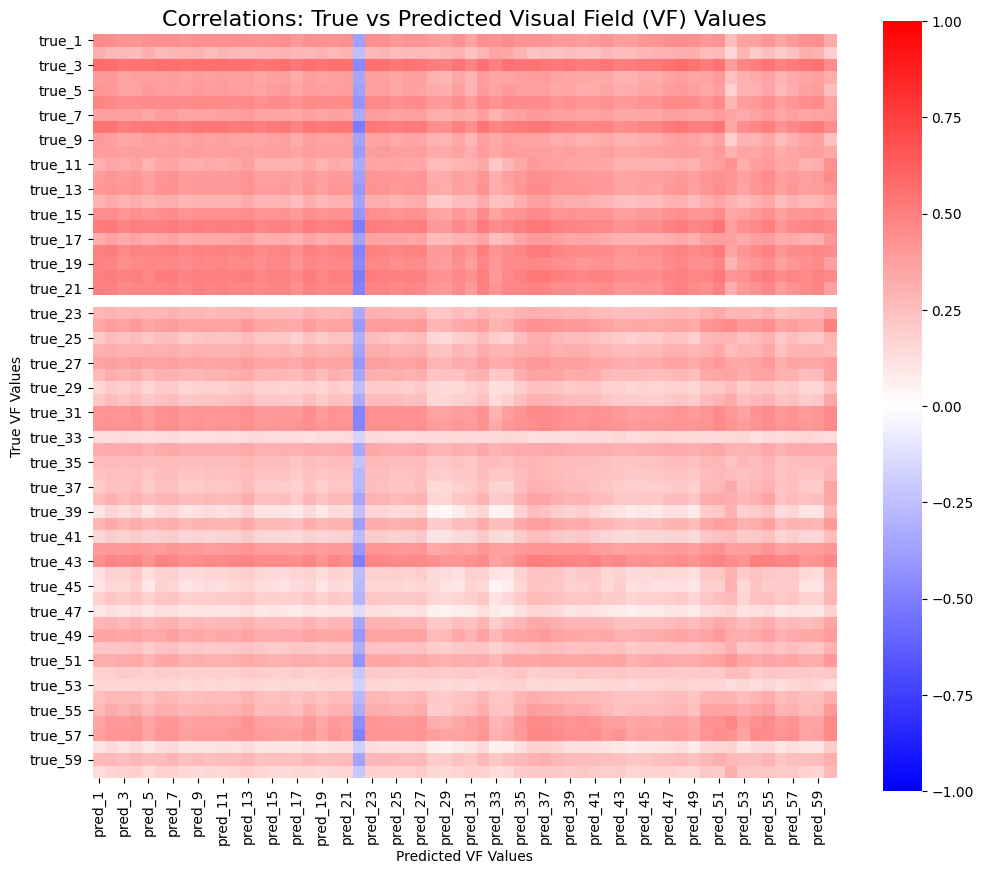

In [141]:
df_true = pd.DataFrame(all_trues, columns=[f"true_{i+1}" for i in range(60)])
df_pred = pd.DataFrame(all_preds, columns=[f"pred_{i+1}" for i in range(60)])

df_combined = pd.concat([df_true, df_pred], axis=1)

# correlation matrix
corr_matrix = df_combined.corr().iloc[0:60, 60:]

plt.figure(figsize=(12,10))
sns.heatmap(
    corr_matrix,
    cmap="bwr",
    center=0,
    vmin=-1,
    vmax=1,
    square=True
)
plt.title("Correlations: True vs Predicted Visual Field (VF) Values", fontsize=16)
plt.xlabel("Predicted VF Values")
plt.ylabel("True VF Values")
plt.show()

In [ ]:
# 12-04-2025 Try with ROI and no masking of -1 values5
# CNN EFFORT 2
# Look at all ROI images
# Use CNN to extract feature information from cropped ROI (optic nerve head)
# Use multi-target prediction for all 60 VF data points (linear vector)
# --> render interpolated VF image
# --> compare to actual VF image

# compare to multi-target prediction 

In [22]:
GRAPE_followup_df_images

,Subject Number,Laterality,Visit Number,Interval Years,IOP,Corresponding CFP,0,1,2,3,...,50,51,52,53,54,55,56,57,58,59
0,1,OD,1,0.000000,14.7,1_OD_1.jpg,21,22,20,23,...,20,22,21,23,26,14,13,19,20,21
1,1,OD,2,0.838356,17.0,1_OD_2.jpg,31,28,28,29,...,20,22,17,22,16,12,14,21,21,18
2,1,OD,3,2.134247,16.5,1_OD_3.jpg,26,25,26,27,...,20,19,12,20,12,5,20,22,25,22
3,1,OS,1,0.000000,15.3,1_OS_1.jpg,24,26,23,26,...,21,22,21,21,21,23,25,22,25,22
4,1,OS,2,0.756164,16.5,1_OS_2.jpg,30,27,27,27,...,27,23,20,22,22,21,20,21,24,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
626,143,OS,3,1.098630,8.0,143_OS_3.jpg,31,29,31,29,...,26,24,21,23,26,24,25,25,25,23
627,144,OD,1,0.000000,20.0,144_OD_1.jpg,31,31,30,31,...,29,26,24,24,27,26,24,16,23,27
628,144,OD,2,0.991781,14.5,144_OD_2.jpg,32,31,30,32,...,27,26,23,24,28,28,28,26,22,26
629,144,OS,1,0.000000,18.0,144_OS_1.jpg,32,32,29,30,...,22,24,23,23,26,27,26,23,24,23


In [28]:
# Overall CNN with ROI as input
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
import numpy as np

# 1. Define CNN
class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 256, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(256, 512, kernel_size=3)  # increase out_channels to 512 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(512, 512, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(512*4*4, 1024)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=0.3)  # set random 30% of neurons to 0 in each training iterations

        self.fc2 = nn.Linear(1024, 1024)
        self.drop2 = nn.Dropout(p=0.3)

        # Output layer: map learned features to 59 predictions (leave out column 21, blind spot)
        self.out = nn.Linear(1024, 59)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        x = self.out(x)
        
        return x

# 2. Image transformation function (with augmentation across training epochs)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform(img)

# 3. Prepare dataset
scaler_y = StandardScaler()

# no masking of -1; convert -1 to 0.  Drop blind spot column (index 21)
cols = ['0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20',
        '22','23','24','25','26','27','28','29','30','31','32','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

GRAPE_followup_df_images_masked = GRAPE_followup_df_images.replace(-1, 0)

targets_masked = GRAPE_followup_df_images_masked[cols].copy()

# Scale
targets_scaled = scaler_y.fit_transform(targets_masked)

# prepare dataset: list of (img_tensor, feature_tensor) tuples
dataset = []
for index, row in GRAPE_followup_df_images_masked.iterrows():
    image_path = row["Corresponding CFP"]

    # img = crop_cfp(image_path)  # PIL image now
    img = Image.open(image_path).convert("RGB")

    if row["Laterality"] == "OS":
        img = ImageOps.mirror(img)

    img_tensor = transform(img)
    target_tensor = torch.from_numpy(targets_scaled[index]).float()
    dataset.append((img_tensor, target_tensor))

images = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split

batch_size = 8
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)  # shuffle=True -> random image order during each training epoch
valloader = DataLoader(valset, batch_size=batch_size)

# 4. Training setup
net = NeuralNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=3e-4)
# reduce learning rate across epochs if loss stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)  

# 5. Training / validation functions
def train_one_epoch():
    net.train()
    running_loss = 0.0

    for inputs, labels in trainloader:
        labels = labels.float()
        optimizer.zero_grad()  # clear out gradients stored from previous batch iterations

        outputs = net(inputs)
        #mask = ~torch.isnan(labels)
        #loss = ((outputs - labels)[mask] ** 2).mean()
        #loss = ((outputs - labels)**2)[mask].mean()
        #loss = criterion(outputs[mask], labels[mask])
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)  # weight by batch size (inputs.size(0))

    avg_loss = running_loss / len(trainloader.dataset)
    print(f"Train loss: {avg_loss}")
    return avg_loss

def validate_one_epoch():
    net.eval()
    running_loss = 0.0

    with torch.no_grad():  # validation doesn't need weight updates; inactivate gradient tracking and updating
        for inputs, labels in valloader:
            labels = labels.float()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)**2)[mask].mean()
            #loss = criterion(outputs[mask], labels[mask])
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)[mask] ** 2).mean()
            running_loss += loss.item() * inputs.size(0)

    avg_loss = running_loss / len(valloader.dataset)
    print(f"Validation loss: {avg_loss:.4f}")
    return avg_loss

# 6. Training loop with early stopping (this is from gpt)
num_epochs = 20
best_val_loss = float('inf')
patience = 5
patience_counter = 0

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    train_loss = train_one_epoch()
    val_loss = validate_one_epoch()

    scheduler.step(val_loss)  # adjust LR if plateau

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(net.state_dict(), "best_model.pt")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered")
            break


KeyboardInterrupt: 

In [29]:
# Overall CNN with ROI as input, smaller network size

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
import numpy as np

# 1. Define CNN
class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3)  # increase out_channels to 512 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(128, 256, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(256*4*4, 512)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=0.3)  # set random 30% of neurons to 0 in each training iterations

        self.fc2 = nn.Linear(512, 256)
        self.drop2 = nn.Dropout(p=0.3)

        # Output layer: map learned features to 58 predictions (leave out columns 21,32 blind spots)
        self.out = nn.Linear(256, 58)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        x = self.out(x)
        
        return x

# 2. Image transformation function (with augmentation across training epochs)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform(img)

# 3. Prepare dataset
scaler_y = StandardScaler()

# no masking of -1; convert -1 to 0.  Drop blind spot columns (index 21 and 32)
cols = ['0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20',
        '22','23','24','25','26','27','28','29','30','31','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

GRAPE_followup_df_images_masked = GRAPE_followup_df_images.replace(-1, 0)

targets_masked = GRAPE_followup_df_images_masked[cols].copy()

# Scale
targets_scaled = scaler_y.fit_transform(targets_masked)

# prepare dataset: list of (img_tensor, feature_tensor) tuples
dataset = []
for index, row in GRAPE_followup_df_images_masked.iterrows():
    image_path = row["Corresponding CFP"]

    # img = crop_cfp(image_path)  # PIL image now
    img = Image.open(image_path).convert("RGB")

    if row["Laterality"] == "OS":
        img = ImageOps.mirror(img)

    img_tensor = transform(img)
    target_tensor = torch.from_numpy(targets_scaled[index]).float()
    dataset.append((img_tensor, target_tensor))

images = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split

batch_size = 8
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)  # shuffle=True -> random image order during each training epoch
valloader = DataLoader(valset, batch_size=batch_size)

# 4. Training setup
net = NeuralNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=3e-4)
# reduce learning rate across epochs if loss stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)  

# 5. Training / validation functions
def train_one_epoch():
    net.train()
    running_loss = 0.0

    for inputs, labels in trainloader:
        labels = labels.float()
        optimizer.zero_grad()  # clear out gradients stored from previous batch iterations

        outputs = net(inputs)
        #mask = ~torch.isnan(labels)
        #loss = ((outputs - labels)[mask] ** 2).mean()
        #loss = ((outputs - labels)**2)[mask].mean()
        #loss = criterion(outputs[mask], labels[mask])
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)  # weight by batch size (inputs.size(0))

    avg_loss = running_loss / len(trainloader.dataset)
    print(f"Train loss: {avg_loss}")
    return avg_loss

def validate_one_epoch():
    net.eval()
    running_loss = 0.0

    with torch.no_grad():  # validation doesn't need weight updates; inactivate gradient tracking and updating
        for inputs, labels in valloader:
            labels = labels.float()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)**2)[mask].mean()
            #loss = criterion(outputs[mask], labels[mask])
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)[mask] ** 2).mean()
            running_loss += loss.item() * inputs.size(0)

    avg_loss = running_loss / len(valloader.dataset)
    print(f"Validation loss: {avg_loss:.4f}")
    return avg_loss

# 6. Training loop with early stopping (this is from gpt)
num_epochs = 20
best_val_loss = float('inf')
patience = 5
patience_counter = 0

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    train_loss = train_one_epoch()
    val_loss = validate_one_epoch()

    scheduler.step(val_loss)  # adjust LR if plateau

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(net.state_dict(), "best_model.pt")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered")
            break



Epoch 1/20
Train loss: 1.0430717804129161
Validation loss: 0.8409

Epoch 2/20
Train loss: 1.0411029486429124
Validation loss: 0.8360

Epoch 3/20
Train loss: 1.0409858255159288
Validation loss: 0.8328

Epoch 4/20
Train loss: 1.0088105925491877
Validation loss: 0.7489

Epoch 5/20
Train loss: 0.9042873611998936
Validation loss: 0.6711

Epoch 6/20
Train loss: 0.7774024572637346
Validation loss: 0.6294

Epoch 7/20
Train loss: 0.7409207745203896
Validation loss: 0.6433

Epoch 8/20
Train loss: 0.7664428178280119
Validation loss: 0.6366

Epoch 9/20
Train loss: 0.7362799852613419
Validation loss: 0.6388

Epoch 10/20
Train loss: 0.720230275676364
Validation loss: 0.6215

Epoch 11/20
Train loss: 0.7179745298529429
Validation loss: 0.6374

Epoch 12/20
Train loss: 0.7091489736996
Validation loss: 0.6742

Epoch 13/20
Train loss: 0.6972595997272976
Validation loss: 0.6293

Epoch 14/20
Train loss: 0.6733623714674086
Validation loss: 0.6003

Epoch 15/20
Train loss: 0.658907078797855
Validation loss: 0

In [30]:
# Overall CNN with ROI as input, smaller network size, try larger batch

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
import numpy as np

# 1. Define CNN
class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3)  # increase out_channels to 512 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(128, 256, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(256*4*4, 512)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=0.3)  # set random 30% of neurons to 0 in each training iterations

        self.fc2 = nn.Linear(512, 256)
        self.drop2 = nn.Dropout(p=0.3)

        # Output layer: map learned features to 58 predictions (leave out columns 21,32 blind spots)
        self.out = nn.Linear(256, 58)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        x = self.out(x)
        
        return x

# 2. Image transformation function (with augmentation across training epochs)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform(img)

# 3. Prepare dataset
scaler_y = StandardScaler()

# no masking of -1; convert -1 to 0.  Drop blind spot columns (index 21 and 32)
cols = ['0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20',
        '22','23','24','25','26','27','28','29','30','31','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

GRAPE_followup_df_images_masked = GRAPE_followup_df_images.replace(-1, 0)

targets_masked = GRAPE_followup_df_images_masked[cols].copy()

# Scale
targets_scaled = scaler_y.fit_transform(targets_masked)

# prepare dataset: list of (img_tensor, feature_tensor) tuples
dataset = []
for index, row in GRAPE_followup_df_images_masked.iterrows():
    image_path = row["Corresponding CFP"]

    # img = crop_cfp(image_path)  # PIL image now
    img = Image.open(image_path).convert("RGB")

    if row["Laterality"] == "OS":
        img = ImageOps.mirror(img)

    img_tensor = transform(img)
    target_tensor = torch.from_numpy(targets_scaled[index]).float()
    dataset.append((img_tensor, target_tensor))

images = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split

batch_size = 16
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)  # shuffle=True -> random image order during each training epoch
valloader = DataLoader(valset, batch_size=batch_size)

# 4. Training setup
net = NeuralNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=3e-4)
# reduce learning rate across epochs if loss stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)  

# 5. Training / validation functions
def train_one_epoch():
    net.train()
    running_loss = 0.0

    for inputs, labels in trainloader:
        labels = labels.float()
        optimizer.zero_grad()  # clear out gradients stored from previous batch iterations

        outputs = net(inputs)
        #mask = ~torch.isnan(labels)
        #loss = ((outputs - labels)[mask] ** 2).mean()
        #loss = ((outputs - labels)**2)[mask].mean()
        #loss = criterion(outputs[mask], labels[mask])
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)  # weight by batch size (inputs.size(0))

    avg_loss = running_loss / len(trainloader.dataset)
    print(f"Train loss: {avg_loss}")
    return avg_loss

def validate_one_epoch():
    net.eval()
    running_loss = 0.0

    with torch.no_grad():  # validation doesn't need weight updates; inactivate gradient tracking and updating
        for inputs, labels in valloader:
            labels = labels.float()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)**2)[mask].mean()
            #loss = criterion(outputs[mask], labels[mask])
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)[mask] ** 2).mean()
            running_loss += loss.item() * inputs.size(0)

    avg_loss = running_loss / len(valloader.dataset)
    print(f"Validation loss: {avg_loss:.4f}")
    return avg_loss

# 6. Training loop with early stopping (this is from gpt)
num_epochs = 20
best_val_loss = float('inf')
patience = 5
patience_counter = 0

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    train_loss = train_one_epoch()
    val_loss = validate_one_epoch()

    scheduler.step(val_loss)  # adjust LR if plateau

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(net.state_dict(), "best_model.pt")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered")
            break



Epoch 1/20
Train loss: 1.0011205739445157
Validation loss: 1.0060

Epoch 2/20
Train loss: 0.9988592219731164
Validation loss: 1.0048

Epoch 3/20
Train loss: 0.9862905797504243
Validation loss: 0.9786

Epoch 4/20
Train loss: 0.9351963930659823
Validation loss: 0.9214

Epoch 5/20
Train loss: 0.8266304315082611
Validation loss: 0.7659

Epoch 6/20
Train loss: 0.7969612308910915
Validation loss: 0.7681

Epoch 7/20
Train loss: 0.7268337522234235
Validation loss: 0.7671

Epoch 8/20
Train loss: 0.7087419231732687
Validation loss: 0.7824

Epoch 9/20
Train loss: 0.6780329715637934
Validation loss: 0.7301

Epoch 10/20
Train loss: 0.6643180733635312
Validation loss: 0.7018

Epoch 11/20
Train loss: 0.6893501773713127
Validation loss: 0.7046

Epoch 12/20
Train loss: 0.6531372850849515
Validation loss: 0.7170

Epoch 13/20
Train loss: 0.6596913089354833
Validation loss: 0.7315

Epoch 14/20
Train loss: 0.636048814607045
Validation loss: 0.7002

Epoch 15/20
Train loss: 0.6177785424959092
Validation los

In [32]:
# Overall CNN with ROI as input, smaller network size, try minmax scaler

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
import numpy as np

# 1. Define CNN
class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3)  # increase out_channels to 512 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(128, 256, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(256*4*4, 512)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=0.3)  # set random 30% of neurons to 0 in each training iterations

        self.fc2 = nn.Linear(512, 256)
        self.drop2 = nn.Dropout(p=0.3)

        # Output layer: map learned features to 58 predictions (leave out columns 21,32 blind spots)
        self.out = nn.Linear(256, 58)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        x = self.out(x)
        
        return x

# 2. Image transformation function (with augmentation across training epochs)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform(img)

# 3. Prepare dataset
# scaler_y = StandardScaler()

from sklearn.preprocessing import MinMaxScaler

scaler_y = MinMaxScaler(feature_range=(0, 1))
#y_scaled = scaler_y.fit_transform(y.reshape(-1, 1))

# no masking of -1; convert -1 to 0.  Drop blind spot columns (index 21 and 32)
cols = ['0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20',
        '22','23','24','25','26','27','28','29','30','31','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

GRAPE_followup_df_images_masked = GRAPE_followup_df_images.replace(-1, 0)

targets_masked = GRAPE_followup_df_images_masked[cols].copy()

# Scale
targets_scaled = scaler_y.fit_transform(targets_masked)

# prepare dataset: list of (img_tensor, feature_tensor) tuples
dataset = []
for index, row in GRAPE_followup_df_images_masked.iterrows():
    image_path = row["Corresponding CFP"]

    # img = crop_cfp(image_path)  # PIL image now
    img = Image.open(image_path).convert("RGB")

    if row["Laterality"] == "OS":
        img = ImageOps.mirror(img)

    img_tensor = transform(img)
    target_tensor = torch.from_numpy(targets_scaled[index]).float()
    dataset.append((img_tensor, target_tensor))

images = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split

batch_size = 16
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)  # shuffle=True -> random image order during each training epoch
valloader = DataLoader(valset, batch_size=batch_size)

# 4. Training setup
net = NeuralNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=3e-4)
# reduce learning rate across epochs if loss stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)  

# 5. Training / validation functions
def train_one_epoch():
    net.train()
    running_loss = 0.0

    for inputs, labels in trainloader:
        labels = labels.float()
        optimizer.zero_grad()  # clear out gradients stored from previous batch iterations

        outputs = net(inputs)
        #mask = ~torch.isnan(labels)
        #loss = ((outputs - labels)[mask] ** 2).mean()
        #loss = ((outputs - labels)**2)[mask].mean()
        #loss = criterion(outputs[mask], labels[mask])
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)  # weight by batch size (inputs.size(0))

    avg_loss = running_loss / len(trainloader.dataset)
    print(f"Train loss: {avg_loss}")
    return avg_loss

def validate_one_epoch():
    net.eval()
    running_loss = 0.0

    with torch.no_grad():  # validation doesn't need weight updates; inactivate gradient tracking and updating
        for inputs, labels in valloader:
            labels = labels.float()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)**2)[mask].mean()
            #loss = criterion(outputs[mask], labels[mask])
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)[mask] ** 2).mean()
            running_loss += loss.item() * inputs.size(0)

    avg_loss = running_loss / len(valloader.dataset)
    print(f"Validation loss: {avg_loss:.4f}")
    return avg_loss

# 6. Training loop with early stopping (this is from gpt)
num_epochs = 20
best_val_loss = float('inf')
patience = 5
patience_counter = 0

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    train_loss = train_one_epoch()
    val_loss = validate_one_epoch()

    scheduler.step(val_loss)  # adjust LR if plateau

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(net.state_dict(), "best_model.pt")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered")
            break



Epoch 1/20
Train loss: 0.20838693044488393
Validation loss: 0.0588

Epoch 2/20
Train loss: 0.09706673747490323
Validation loss: 0.0586

Epoch 3/20
Train loss: 0.0831372703588198
Validation loss: 0.0507

Epoch 4/20
Train loss: 0.07211586549168542
Validation loss: 0.0497

Epoch 5/20
Train loss: 0.0700760738007606
Validation loss: 0.0540

Epoch 6/20
Train loss: 0.06630142695373958
Validation loss: 0.0448

Epoch 7/20
Train loss: 0.0571813089033914
Validation loss: 0.0457

Epoch 8/20
Train loss: 0.06012272178417161
Validation loss: 0.0472

Epoch 9/20
Train loss: 0.05824247617570181
Validation loss: 0.0453

Epoch 10/20
Train loss: 0.05436019782745649
Validation loss: 0.0446

Epoch 11/20
Train loss: 0.05137906164403946
Validation loss: 0.0439

Epoch 12/20
Train loss: 0.05499459389183256
Validation loss: 0.0515

Epoch 13/20
Train loss: 0.05305260928377273
Validation loss: 0.0422

Epoch 14/20
Train loss: 0.05305845491469852
Validation loss: 0.0438

Epoch 15/20
Train loss: 0.04983846263753043
V

In [49]:
# Overall CNN with ROI as input, smaller network size, try minmax scaler with tanh

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
import numpy as np

# 1. Define CNN
class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3)  # increase out_channels to 512 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(128, 256, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(256*4*4, 512)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=0.3)  # set random 30% of neurons to 0 in each training iterations

        self.fc2 = nn.Linear(512, 256)
        self.drop2 = nn.Dropout(p=0.3)

        # Output layer: map learned features to 58 predictions (leave out columns 21,32 blind spots)
        self.out = nn.Linear(256, 58)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        x = torch.tanh(self.out(x))
        #x = self.out(x)
        
        return x

# 2. Image transformation function (with augmentation across training epochs)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform(img)

# 3. Prepare dataset
# scaler_y = StandardScaler()

from sklearn.preprocessing import MinMaxScaler

scaler_y = MinMaxScaler(feature_range=(0, 1))
#y_scaled = scaler_y.fit_transform(y.reshape(-1, 1))

# no masking of -1; convert -1 to 0.  Drop blind spot columns (index 21 and 32)
cols = ['0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20',
        '22','23','24','25','26','27','28','29','30','31','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

GRAPE_followup_df_images_masked = GRAPE_followup_df_images.replace(-1, 0)

targets_masked = GRAPE_followup_df_images_masked[cols].copy()

# Scale
targets_scaled = scaler_y.fit_transform(targets_masked)

# prepare dataset: list of (img_tensor, feature_tensor) tuples
dataset = []
for index, row in GRAPE_followup_df_images_masked.iterrows():
    image_path = row["Corresponding CFP"]

    # img = crop_cfp(image_path)  # PIL image now
    img = Image.open(image_path).convert("RGB")

    if row["Laterality"] == "OS":
        img = ImageOps.mirror(img)

    img_tensor = transform(img)
    target_tensor = torch.from_numpy(targets_scaled[index]).float()
    dataset.append((img_tensor, target_tensor))

images = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split

batch_size = 16
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)  # shuffle=True -> random image order during each training epoch
valloader = DataLoader(valset, batch_size=batch_size)

# 4. Training setup
net = NeuralNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=3e-4)
# reduce learning rate across epochs if loss stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)  

# 5. Training / validation functions
def train_one_epoch():
    net.train()
    running_loss = 0.0

    for inputs, labels in trainloader:
        labels = labels.float()
        optimizer.zero_grad()  # clear out gradients stored from previous batch iterations

        outputs = net(inputs)
        #mask = ~torch.isnan(labels)
        #loss = ((outputs - labels)[mask] ** 2).mean()
        #loss = ((outputs - labels)**2)[mask].mean()
        #loss = criterion(outputs[mask], labels[mask])
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)  # weight by batch size (inputs.size(0))

    avg_loss = running_loss / len(trainloader.dataset)
    print(f"Train loss: {avg_loss}")
    return avg_loss

def validate_one_epoch():
    net.eval()
    running_loss = 0.0

    with torch.no_grad():  # validation doesn't need weight updates; inactivate gradient tracking and updating
        for inputs, labels in valloader:
            labels = labels.float()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)**2)[mask].mean()
            #loss = criterion(outputs[mask], labels[mask])
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)[mask] ** 2).mean()
            running_loss += loss.item() * inputs.size(0)

    avg_loss = running_loss / len(valloader.dataset)
    print(f"Validation loss: {avg_loss:.4f}")
    return avg_loss

# 6. Training loop with early stopping (this is from gpt)
num_epochs = 20
best_val_loss = float('inf')
patience = 5
patience_counter = 0

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    train_loss = train_one_epoch()
    val_loss = validate_one_epoch()

    scheduler.step(val_loss)  # adjust LR if plateau

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(net.state_dict(), "best_model.pt")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered")
            break



Epoch 1/20
Train loss: 0.18540592704500472
Validation loss: 0.0736

Epoch 2/20
Train loss: 0.07551234026276876
Validation loss: 0.0696

Epoch 3/20
Train loss: 0.06775361831699099
Validation loss: 0.0651

Epoch 4/20
Train loss: 0.06366912003547426
Validation loss: 0.0587

Epoch 5/20
Train loss: 0.06020102460706045
Validation loss: 0.0607

Epoch 6/20
Train loss: 0.0527835458753601
Validation loss: 0.0582

Epoch 7/20
Train loss: 0.04939822284948258
Validation loss: 0.0461

Epoch 8/20
Train loss: 0.04784475994252023
Validation loss: 0.0500

Epoch 9/20
Train loss: 0.04938123789098528
Validation loss: 0.0486

Epoch 10/20
Train loss: 0.04762629602873136
Validation loss: 0.0476

Epoch 11/20
Train loss: 0.04378105794626569
Validation loss: 0.0416

Epoch 12/20
Train loss: 0.04423904058242601
Validation loss: 0.0418

Epoch 13/20
Train loss: 0.04255214256663171
Validation loss: 0.0420

Epoch 14/20
Train loss: 0.04218755130256925
Validation loss: 0.0412

Epoch 15/20
Train loss: 0.04166387701554903

In [50]:
# Overall CNN with ROI as input, smaller network size, try minmax scaler with tanh

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
import numpy as np

# 1. Define CNN
class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3)  # increase out_channels to 512 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(128, 256, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(256*4*4, 512)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=0.3)  # set random 30% of neurons to 0 in each training iterations

        self.fc2 = nn.Linear(512, 256)
        self.drop2 = nn.Dropout(p=0.3)

        # Output layer: map learned features to 58 predictions (leave out columns 21,32 blind spots)
        self.out = nn.Linear(256, 58)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        x = torch.tanh(self.out(x))
        #x = self.out(x)
        
        return x

# 2. Image transformation function (with augmentation across training epochs)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform(img)

# 3. Prepare dataset
# scaler_y = StandardScaler()

from sklearn.preprocessing import MinMaxScaler

scaler_y = MinMaxScaler(feature_range=(0, 1))
#y_scaled = scaler_y.fit_transform(y.reshape(-1, 1))

# no masking of -1; convert -1 to 0.  Drop blind spot columns (index 21 and 32)
cols = ['0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20',
        '22','23','24','25','26','27','28','29','30','31','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

GRAPE_followup_df_images_masked = GRAPE_followup_df_images.replace(-1, 0)

targets_masked = GRAPE_followup_df_images_masked[cols].copy()

# Scale
targets_scaled = scaler_y.fit_transform(targets_masked)

# prepare dataset: list of (img_tensor, feature_tensor) tuples
dataset = []
for index, row in GRAPE_followup_df_images_masked.iterrows():
    image_path = row["Corresponding CFP"]

    # img = crop_cfp(image_path)  # PIL image now
    img = Image.open(image_path).convert("RGB")

    if row["Laterality"] == "OS":
        img = ImageOps.mirror(img)

    img_tensor = transform(img)
    target_tensor = torch.from_numpy(targets_scaled[index]).float()
    dataset.append((img_tensor, target_tensor))

images = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split

batch_size = 8
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)  # shuffle=True -> random image order during each training epoch
valloader = DataLoader(valset, batch_size=batch_size)

# 4. Training setup
net = NeuralNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=3e-4)
# reduce learning rate across epochs if loss stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)  

# 5. Training / validation functions
def train_one_epoch():
    net.train()
    running_loss = 0.0

    for inputs, labels in trainloader:
        labels = labels.float()
        optimizer.zero_grad()  # clear out gradients stored from previous batch iterations

        outputs = net(inputs)
        #mask = ~torch.isnan(labels)
        #loss = ((outputs - labels)[mask] ** 2).mean()
        #loss = ((outputs - labels)**2)[mask].mean()
        #loss = criterion(outputs[mask], labels[mask])
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)  # weight by batch size (inputs.size(0))

    avg_loss = running_loss / len(trainloader.dataset)
    print(f"Train loss: {avg_loss}")
    return avg_loss

def validate_one_epoch():
    net.eval()
    running_loss = 0.0

    with torch.no_grad():  # validation doesn't need weight updates; inactivate gradient tracking and updating
        for inputs, labels in valloader:
            labels = labels.float()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)**2)[mask].mean()
            #loss = criterion(outputs[mask], labels[mask])
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)[mask] ** 2).mean()
            running_loss += loss.item() * inputs.size(0)

    avg_loss = running_loss / len(valloader.dataset)
    print(f"Validation loss: {avg_loss:.4f}")
    return avg_loss

# training run
num_epochs = 20
for epoch in range(num_epochs):
    train_loss = train_one_epoch()
    val_loss = validate_one_epoch()
    scheduler.step(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs} — train: {train_loss:.4f}, val: {val_loss:.4f}")


Train loss: 0.1359890859041895
Validation loss: 0.0552
Epoch 1/20 — train: 0.1360, val: 0.0552
Train loss: 0.0747765251213596
Validation loss: 0.0517
Epoch 2/20 — train: 0.0748, val: 0.0517
Train loss: 0.06447185824314754
Validation loss: 0.0509
Epoch 3/20 — train: 0.0645, val: 0.0509
Train loss: 0.055744444714888694
Validation loss: 0.0414
Epoch 4/20 — train: 0.0557, val: 0.0414
Train loss: 0.04925069730314943
Validation loss: 0.0467
Epoch 5/20 — train: 0.0493, val: 0.0467
Train loss: 0.05255639585592444
Validation loss: 0.0429
Epoch 6/20 — train: 0.0526, val: 0.0429
Train loss: 0.04659385302118839
Validation loss: 0.0408
Epoch 7/20 — train: 0.0466, val: 0.0408
Train loss: 0.04438766194063993
Validation loss: 0.0388
Epoch 8/20 — train: 0.0444, val: 0.0388
Train loss: 0.044902239822679095
Validation loss: 0.0398
Epoch 9/20 — train: 0.0449, val: 0.0398
Train loss: 0.0431923143092602
Validation loss: 0.0447
Epoch 10/20 — train: 0.0432, val: 0.0447
Train loss: 0.045094630193142665
Validat

In [49]:
# 12-09-2025
# Overall CNN with ROI as input, smaller network size, try minmax scaler with tanh with optimal parameters

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
import numpy as np

# 1. Define CNN
class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3)  # increase out_channels to 512 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(128, 256, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(256*4*4, 512)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=0.1)  # set random 30% of neurons to 0 in each training iterations

        self.fc2 = nn.Linear(512, 256)
        self.drop2 = nn.Dropout(p=0.1)

        # Output layer: map learned features to 58 predictions (leave out columns 21,32 blind spots)
        self.out = nn.Linear(256, 58)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        x = torch.tanh(self.out(x))
        #x = self.out(x)
        
        return x

# 2. Image transformation function (with augmentation across training epochs)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform(img)

# 3. Prepare dataset
# scaler_y = StandardScaler()

from sklearn.preprocessing import MinMaxScaler

scaler_y = MinMaxScaler(feature_range=(0, 1))
#y_scaled = scaler_y.fit_transform(y.reshape(-1, 1))

# no masking of -1; convert -1 to 0.  Drop blind spot columns (index 21 and 32)
cols = ['0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20',
        '22','23','24','25','26','27','28','29','30','31','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

GRAPE_followup_df_images_masked = GRAPE_followup_df_images.replace(-1, 0)

targets_masked = GRAPE_followup_df_images_masked[cols].copy()

# Scale
targets_scaled = scaler_y.fit_transform(targets_masked)

# prepare dataset: list of (img_tensor, feature_tensor) tuples
dataset = []
for index, row in GRAPE_followup_df_images_masked.iterrows():
    image_path = row["Corresponding CFP"]

    # img = crop_cfp(image_path)  # PIL image now
    img = Image.open(image_path).convert("RGB")

    if row["Laterality"] == "OS":
        img = ImageOps.mirror(img)

    img_tensor = transform(img)
    target_tensor = torch.from_numpy(targets_scaled[index]).float()
    dataset.append((img_tensor, target_tensor))

images = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split

batch_size = 8
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)  # shuffle=True -> random image order during each training epoch
valloader = DataLoader(valset, batch_size=batch_size)

# 4. Training setup
net = NeuralNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=3e-4)
# reduce learning rate across epochs if loss stops improving
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)  

# 5. Training / validation functions
def train_one_epoch():
    net.train()
    running_loss = 0.0

    for inputs, labels in trainloader:
        labels = labels.float()
        optimizer.zero_grad()  # clear out gradients stored from previous batch iterations

        outputs = net(inputs)
        #mask = ~torch.isnan(labels)
        #loss = ((outputs - labels)[mask] ** 2).mean()
        #loss = ((outputs - labels)**2)[mask].mean()
        #loss = criterion(outputs[mask], labels[mask])
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)  # weight by batch size (inputs.size(0))

    avg_loss = running_loss / len(trainloader.dataset)
    print(f"Train loss: {avg_loss}")
    return avg_loss

def validate_one_epoch():
    net.eval()
    running_loss = 0.0

    with torch.no_grad():  # validation doesn't need weight updates; inactivate gradient tracking and updating
        for inputs, labels in valloader:
            labels = labels.float()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)**2)[mask].mean()
            #loss = criterion(outputs[mask], labels[mask])
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)[mask] ** 2).mean()
            running_loss += loss.item() * inputs.size(0)

    avg_loss = running_loss / len(valloader.dataset)
    print(f"Validation loss: {avg_loss:.4f}")
    return avg_loss

# training run
num_epochs = 20
for epoch in range(num_epochs):
    train_loss = train_one_epoch()
    val_loss = validate_one_epoch()
    # scheduler.step(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs} — train: {train_loss:.4f}, val: {val_loss:.4f}")


Train loss: 0.14640102671488883
Validation loss: 0.0601
Epoch 1/20 — train: 0.1464, val: 0.0601
Train loss: 0.06993080926911226
Validation loss: 0.0580
Epoch 2/20 — train: 0.0699, val: 0.0580
Train loss: 0.05994889923622684
Validation loss: 0.0472
Epoch 3/20 — train: 0.0599, val: 0.0472
Train loss: 0.05201093352858036
Validation loss: 0.0515
Epoch 4/20 — train: 0.0520, val: 0.0515
Train loss: 0.049136329102255995
Validation loss: 0.0460
Epoch 5/20 — train: 0.0491, val: 0.0460
Train loss: 0.04488442267572123
Validation loss: 0.0426
Epoch 6/20 — train: 0.0449, val: 0.0426
Train loss: 0.04857793751926649
Validation loss: 0.0429
Epoch 7/20 — train: 0.0486, val: 0.0429
Train loss: 0.04307832005655482
Validation loss: 0.0407
Epoch 8/20 — train: 0.0431, val: 0.0407
Train loss: 0.04424011285993315
Validation loss: 0.0433
Epoch 9/20 — train: 0.0442, val: 0.0433
Train loss: 0.04225611728098658
Validation loss: 0.0419
Epoch 10/20 — train: 0.0423, val: 0.0419
Train loss: 0.04256566749915244
Valida

In [50]:
# evaluate after training

net.eval()

all_preds = []
all_true = []

with torch.no_grad():
    for inputs, labels in valloader:
        outputs = net(inputs)   # <-- outputs is DEFINITELY defined here

        all_preds.append(outputs.cpu())
        all_true.append(labels.cpu())

# Stack all batches
pred_scaled = torch.cat(all_preds).numpy()
true_scaled = torch.cat(all_true).numpy()

# Inverse transform back to dB
pred_db = scaler_y.inverse_transform(pred_scaled)
true_db = scaler_y.inverse_transform(true_scaled)

# Compute RMSE in original dB units
rmse_db = np.sqrt(np.mean((pred_db - true_db)**2))

print(f"Validation RMSE (dB): {rmse_db:.2f}")


Validation RMSE (dB): 6.04


In [51]:
# visualization of aggregate true-predicted (MSE) across VF
(true_db - pred_db)**2

array([[1.3289338e+01, 1.1412553e+02, 2.5570656e+01, ..., 1.4912175e+01,
        2.6163574e+01, 3.6529827e+01],
       [2.0147717e-01, 1.5052810e-01, 2.0292368e+00, ..., 3.3973511e+01,
        8.2032517e-02, 1.3822974e+01],
       [1.4964154e+01, 1.0418202e+01, 7.4417475e-03, ..., 8.1316628e+01,
        7.4709061e+01, 8.5255402e+01],
       ...,
       [3.6691867e-02, 1.1613675e+02, 4.7177286e+00, ..., 1.3180646e+02,
        8.5693214e+01, 8.4546833e+00],
       [5.9458145e+01, 1.3319324e+02, 6.9848701e+01, ..., 1.0309967e+02,
        1.1055282e+01, 2.2958186e+00],
       [3.1798134e+00, 3.5202056e-01, 2.2848957e+00, ..., 5.7368493e+00,
        2.1870747e+00, 1.0696421e+00]], dtype=float32)

In [52]:
# squared error per VF point (shape: [num_samples, 58])
squared_errors = (true_db - pred_db) ** 2

# mean squared error across all samples for each VF point
mse_per_point = np.mean(squared_errors, axis=0)

In [61]:
mse_per_point

array([29.289465, 32.227627, 30.764776, 36.69642 , 38.77727 , 20.638878,
       34.812008, 42.747643, 36.9095  , 22.635365, 22.425581, 18.716333,
       21.58731 , 30.474598, 27.52083 , 38.948868, 68.62269 , 39.28773 ,
       31.963734, 42.404556, 31.95929 , 23.483519, 25.082521, 22.14518 ,
       24.245876, 34.708927, 72.87305 , 64.871185, 53.714157, 43.193497,
       35.68861 , 27.6618  , 27.271791, 24.50084 , 26.35231 , 27.029524,
       30.657572, 29.833393, 30.90467 , 40.26995 , 64.28833 , 59.11703 ,
       52.33558 , 48.90133 , 42.93936 , 45.603992, 39.21681 , 27.513731,
       30.036045, 25.5854  , 31.391798, 26.749043, 32.573727, 46.11142 ,
       56.2674  , 51.190254, 40.155937, 33.792213], dtype=float32)

In [77]:
rmse_per_point = np.sqrt(mse_per_point)

In [79]:
len(rmse_per_point)

58

In [83]:
rmse_per_point

array([5.4119744, 5.676938 , 5.5466003, 6.057757 , 6.22714  , 4.543003 ,
       5.9001703, 6.538168 , 6.075319 , 4.7576637, 4.7355657, 4.3262377,
       4.6462145, 5.52038  , 5.24603  , 6.240903 , 8.283881 , 6.2679925,
       5.653648 , 6.511878 , 5.653255 , 4.8459797, 5.0082455, 4.7058663,
       4.9240103, 5.8914285, 8.5365715, 8.054265 , 7.3289943, 6.572176 ,
       5.9739943, 5.2594485, 5.22224  , 4.9498324, 5.13345  , 5.1989927,
       5.536928 , 5.461995 , 5.559197 , 6.345861 , 8.018001 , 7.6887603,
       7.2343335, 6.9929485, 6.552813 , 6.7530727, 6.2623324, 5.245353 ,
       5.480515 , 5.0582013, 5.6028385, 5.1719475, 5.70734  , 6.790539 ,
       7.5011597, 7.1547365, 6.336871 , 5.813107 ], dtype=float32)

In [70]:
# rmse_per_point = np.insert(rmse_per_point, [21, 32], 0)

In [71]:
def interpolate_VF_array(arr):
    
    VF_cols = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
   '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21',
   '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33',
   '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45',
   '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57',
   '58', '59']
    
    all_coords = np.array([
    (0,0), (1,-1), (-1,-1), (-1,1), (1,1), (2,-2), (-2,-2), (-2,2),
    (2,2), (4,-1), (4,-4), (1,-4), (-1,-4), (-4,-4), (-4,-1), (-4,1), (-4,4),
    (-1,4), (1,4), (4,4), (4,1), (6,0), (6,-6), (2,-6), (-2,-6), (-6,-6),
    (-6,-1), (-6,1), (-6,6), (-2,6), (2,6), (6,6), (8,-1), (8,-6), (8,-8), (6,-8), (2,-8), 
    (-2,-8), (-6,-8), (-8,-8), (-8,-6), (-8,-1), (-8,1), (-8,6), (-8,8), (-6,8), (-2,8), (2,8), (6,8),
    (8,8), (8,6), (8,1), (10,-3), (3,-10), (-3,-10), (-10, -2), (-10,2), (-3,10), (3,10), (10,3)])

    radius = 12

    grid_x, grid_y = np.mgrid[-12:12:200j, -12:12:200j]
    mask = (np.sqrt(grid_x**2 + grid_y**2) <= radius)
    mask_float = mask.astype(np.float32)
    
    """
    For each point in cropped_np, create a visual field map:
    
    1. Take the point’s values (pt[3:]).
    2. Interpolate over a grid using RBF with fixed VF coordinates.
    3. Apply a circular mask of radius 12.
    4. Replace values outside the mask with 0.
    5. Save the result (values + mask) as a .npy file named "{pt[0]}_{pt[1]}.npy".
    
    Final grid is (200, 200, 2)
        - [:,:,0]  interpolated visual field values
        - [:,:,1] mask indicating the visual field area (1.0 inside, 0.0 outside)
    """

    pt_vf = np.array(arr, dtype=float)

    rbf = Rbf(all_coords[:,0], all_coords[:,1], pt_vf, function='thin_plate')
    grid_z = rbf(grid_x, grid_y)
    masked_grid = np.where(mask, grid_z, np.nan)
    
    values = np.nan_to_num(masked_grid, nan=0.0)
    x = np.stack([values.T, mask_float], axis=-1)

    return x



In [97]:
def interpolate_VF_array_no_blindspot(arr):

    blind_indices = [21, 32]   # blind spot coordinate indices

    # full 60-point coordinate layout
    all_coords = np.array([
    (0,0), (1,-1), (-1,-1), (-1,1), (1,1), (2,-2), (-2,-2), (-2,2),
    (2,2), (4,-1), (4,-4), (1,-4), (-1,-4), (-4,-4), (-4,-1), (-4,1), (-4,4),
    (-1,4), (1,4), (4,4), (4,1), (6,0), (6,-6), (2,-6), (-2,-6), (-6,-6),
    (-6,-1), (-6,1), (-6,6), (-2,6), (2,6), (6,6), (8,-1), (8,-6), (8,-8), (6,-8), (2,-8), 
    (-2,-8), (-6,-8), (-8,-8), (-8,-6), (-8,-1), (-8,1), (-8,6), (-8,8), (-6,8), (-2,8), (2,8), (6,8),
    (8,8), (8,6), (8,1), (10,-3), (3,-10), (-3,-10), (-10, -2), (-10,2), (-3,10), (3,10), (10,3)])

    # remove blind spot coordinates
    coords_58 = np.delete(all_coords, blind_indices, axis=0)

    # your 58 RMSE values
    pt_vf = np.array(arr, dtype=float)

    # interpolation grid and mask
    radius = 12
    grid_x, grid_y = np.mgrid[-12:12:200j, -12:12:200j]
    mask = (np.sqrt(grid_x**2 + grid_y**2) <= radius)
    mask_float = mask.astype(np.float32)

    # interpolate
    rbf = Rbf(coords_58[:,0], coords_58[:,1], pt_vf, function='thin_plate')
    grid_z = rbf(grid_x, grid_y)
    masked_grid = np.where(mask, grid_z, np.nan)

    values = np.nan_to_num(masked_grid, nan=0.0)
    x = np.stack([values.T, mask_float], axis=-1)

    return x


In [98]:
blind_indices = [21, 32] 
all_coords = np.array([
(0,0), (1,-1), (-1,-1), (-1,1), (1,1), (2,-2), (-2,-2), (-2,2),
(2,2), (4,-1), (4,-4), (1,-4), (-1,-4), (-4,-4), (-4,-1), (-4,1), (-4,4),
(-1,4), (1,4), (4,4), (4,1), (6,0), (6,-6), (2,-6), (-2,-6), (-6,-6),
(-6,-1), (-6,1), (-6,6), (-2,6), (2,6), (6,6), (8,-1), (8,-6), (8,-8), (6,-8), (2,-8), 
(-2,-8), (-6,-8), (-8,-8), (-8,-6), (-8,-1), (-8,1), (-8,6), (-8,8), (-6,8), (-2,8), (2,8), (6,8),
(8,8), (8,6), (8,1), (10,-3), (3,-10), (-3,-10), (-10, -2), (-10,2), (-3,10), (3,10), (10,3)])

    # remove blind spot coordinates
coords_58 = np.delete(all_coords, blind_indices, axis=0)
len(coords_58)

58

In [99]:
len(rmse_per_point)

58

In [107]:
def plot_VF_RMSE_original(arr, mask_invalid=True, cmap='viridis'):
    """
    Plot visual field map from Octopus .npy file containing sensitivity and mask.
    
    Parameters:
        file_path: path to the .npy file
        mask_channel: mask channel in last dimension (1)
        sens_channel: sensitivities channel in last dimension (0)
        mask_invalid: if True, invalid points (mask==0 or sensitivity<0) set to NaN
        cmap: colormap for plotting
    """
    
    sens = arr[:,:,0]
    mask = arr[:,:,1]
    
    # Apply mask
    if mask_invalid:
        sens_masked = np.where((mask==0), np.nan, sens)
    else:
        sens_masked = sens

    plt.figure(figsize=(8,8))
    plt.imshow(sens_masked, cmap=cmap, origin='lower')
    plt.colorbar(label='RMSE Sensitivity (dB)', shrink=0.7)
    plt.title("RMSE Across VF", fontsize=15)
    plt.axis('off')
    plt.show()


In [160]:
def plot_VF_diff(arr, mask_invalid=True, cmap='viridis'):
    """
    Plot visual field map from Octopus .npy file containing sensitivity and mask.
    
    Parameters:
        file_path: path to the .npy file
        mask_channel: mask channel in last dimension (1)
        sens_channel: sensitivities channel in last dimension (0)
        mask_invalid: if True, invalid points (mask==0 or sensitivity<0) set to NaN
        cmap: colormap for plotting
    """
    
    sens = arr[:,:,0]
    mask = arr[:,:,1]
    
    # Apply mask
    if mask_invalid:
        sens_masked = np.where((mask==0), np.nan, sens)
    else:
        sens_masked = sens

    plt.figure(figsize=(8,8))
    plt.imshow(sens_masked, cmap=cmap, origin='lower')
    plt.colorbar(label='Predicted-True Sensitivity (dB)', shrink=0.7)
    plt.title("Predicted-True Sensitivity Across VF", fontsize=15)
    plt.axis('off')
    plt.show()


In [153]:
def plot_VF_RMSE(arr, mask_invalid=True, cmap='viridis'):
    """
    Plot visual field map from Octopus .npy file containing sensitivity and mask.
    
    Parameters:
        file_path: path to the .npy file
        mask_channel: mask channel in last dimension (1)
        sens_channel: sensitivities channel in last dimension (0)
        mask_invalid: if True, invalid points (mask==0 or sensitivity<0) set to NaN
        cmap: colormap for plotting
    """
    
    sens = arr[:,:,0]
    mask = arr[:,:,1]
    
    # Apply mask
    if mask_invalid:
        sens_masked = np.where((mask==0), np.nan, sens)
    else:
        sens_masked = sens

    plt.figure(figsize=(8,8))

    im = plt.imshow(
        sens_masked,
        cmap=cmap,
        origin='lower',
        vmin=0,        
        vmax=30        
    )
    
    plt.imshow(sens_masked, cmap=cmap, origin='lower')
    plt.colorbar(im, label='RMSE Sensitivity (dB)', shrink=0.7)
    plt.title("RMSE Across VF", fontsize=15)
    plt.axis('off')
    plt.show()



In [154]:
interpolated_rmse_per_point = interpolate_VF_array_no_blindspot(rmse_per_point)

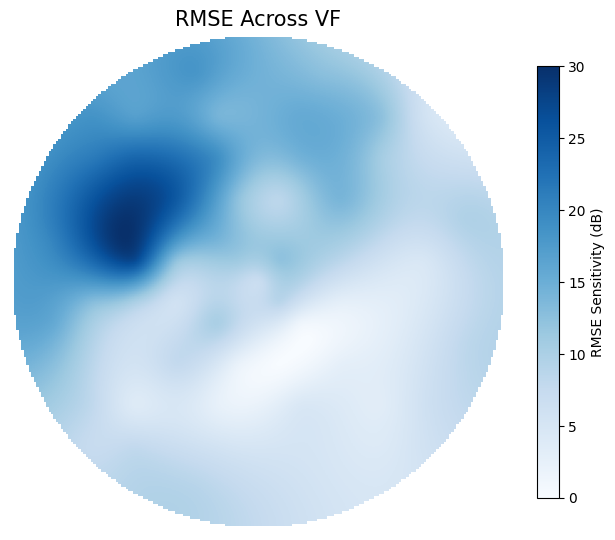

In [155]:
plot_VF_RMSE(interpolated_rmse_per_point, cmap='Blues')

In [156]:
# Examine predicted output for one patient/visit
subject1_visit1_diff = pred_db[0] - true_db[0]
subject1_visit1_true = true_db[0]
subject1_visit1_pred = pred_db[0]

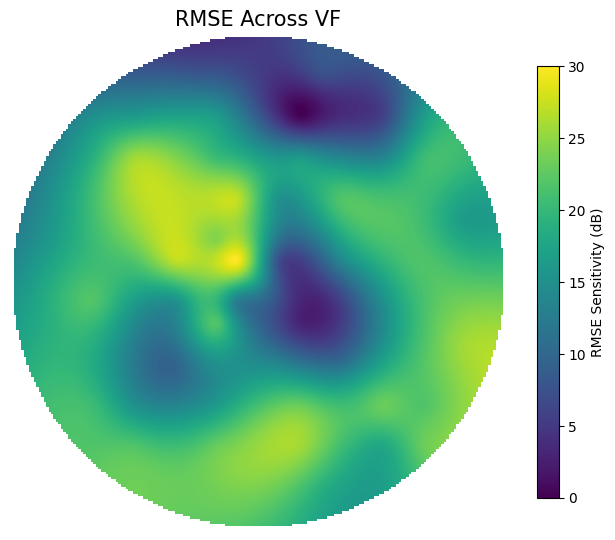

In [157]:
subject1_visit1_true_interp = interpolate_VF_array_no_blindspot(subject1_visit1_true)
plot_VF_RMSE(subject1_visit1_true_interp, cmap="viridis")

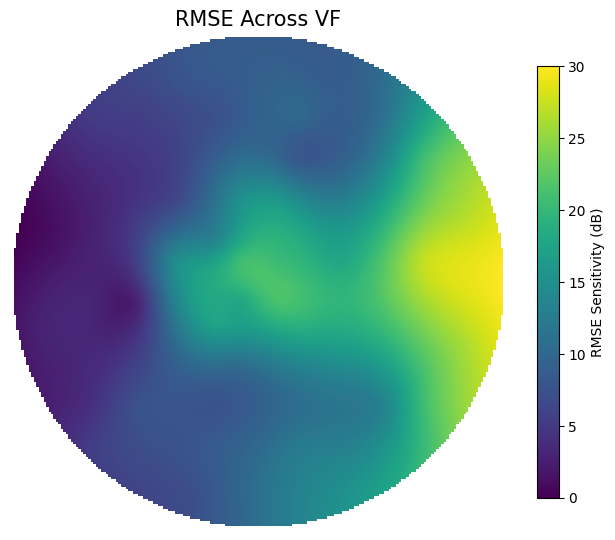

In [158]:
subject1_visit1_pred_interp = interpolate_VF_array_no_blindspot(subject1_visit1_pred)
plot_VF_RMSE(subject1_visit1_pred_interp, cmap="viridis")

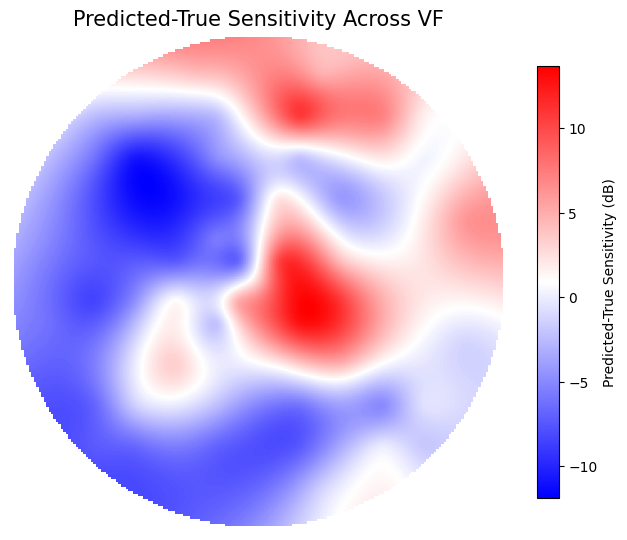

In [161]:
subject1_visit1_pred_minus_true_interp = interpolate_VF_array_no_blindspot(subject1_visit1_diff)
plot_VF_diff(subject1_visit1_pred_minus_true_interp, cmap="bwr")

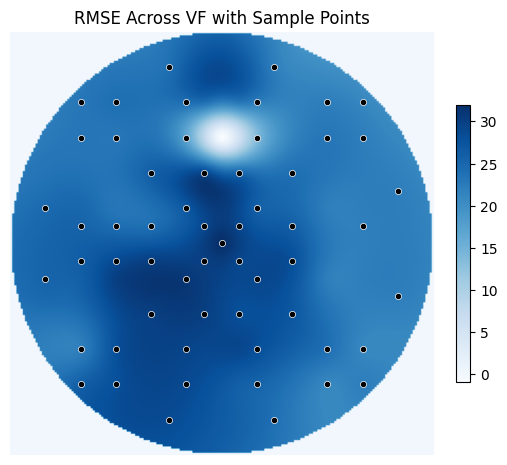

In [112]:
fig, ax = plt.subplots(figsize=(6,6))

# your interpolated map
im = ax.imshow(values, cmap="Blues",
               extent=[-12, 12, -12, 12],   # key: align coords with image
               origin='lower')

# plot the 58 sample points
ax.scatter(coords_58[:,0], coords_58[:,1],
           c='black', s=20, marker='o', edgecolors='white', linewidths=0.5)

# turn off axes
ax.set_xlim(-12, 12)
ax.set_ylim(-12, 12)
ax.set_aspect('equal')
ax.axis('off')

# title
ax.set_title("RMSE Across VF with Sample Points")

# colorbar
plt.colorbar(im, shrink=0.6, fraction=0.04)

plt.show()


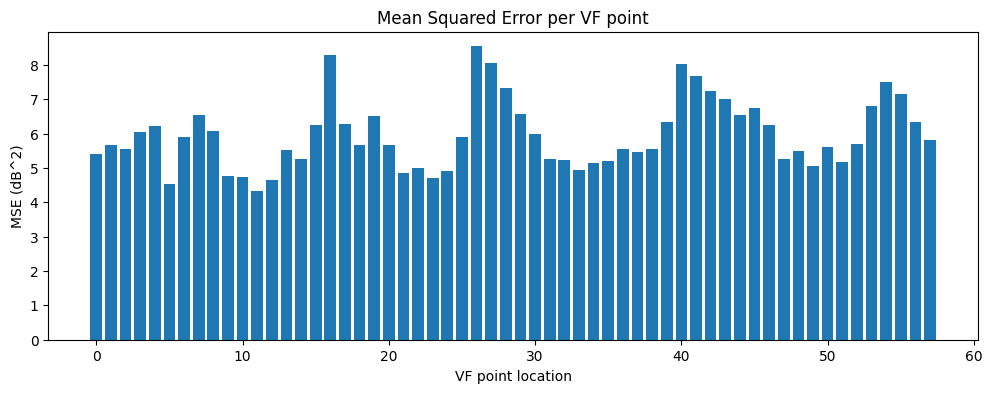

In [56]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,4))
plt.bar(range(len(rmse_per_point)), rmse_per_point)
plt.xlabel("VF point location")
plt.ylabel("MSE (dB^2)")
plt.title("Mean Squared Error per VF point")
plt.show()


In [57]:
global_rmse = np.sqrt(np.mean((true_db - pred_db)**2))
global_rmse

6.0424767

In [58]:
# Mean Deviation per sample
true_md = np.mean(true_db, axis=1)    # shape: [N]
pred_md = np.mean(pred_db, axis=1)    # shape: [N]

# MD error per sample
md_error = pred_md - true_md

# Summary statistics
md_mae  = np.mean(np.abs(md_error))
md_rmse = np.sqrt(np.mean(md_error**2))

print(f"MD MAE  (dB): {md_mae:.2f}")
print(f"MD RMSE (dB): {md_rmse:.2f}")


MD MAE  (dB): 2.89
MD RMSE (dB): 3.74


In [59]:
from scipy.stats import pearsonr

pattern_corrs = []

for i in range(true_db.shape[0]):
    r, _ = pearsonr(true_db[i], pred_db[i])
    pattern_corrs.append(r)

pattern_corrs = np.array(pattern_corrs)

mean_pattern_corr = np.mean(pattern_corrs)
median_pattern_corr = np.median(pattern_corrs)

print(f"Mean Pattern Correlation:   {mean_pattern_corr:.3f}")
print(f"Median Pattern Correlation: {median_pattern_corr:.3f}")


Mean Pattern Correlation:   0.540
Median Pattern Correlation: 0.614


### Parameter Sweep Effort

In [ ]:
## begin to finalize effort...
# hyperparameter sweep

learning_rate = [1e-4, 3e-4, 5e-4]
batch_size = [8, 16]
scalars_activations = []
activation_function = [('standard', 'relu'), ('minmax_m11', 'tanh')]

In [ ]:
# import modules
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
import numpy as np

In [ ]:
# Overall CNN with ROI as input
# 3 convolution layers, 2 dense layers

learning_rate = [1e-4, 3e-4, 5e-4]
batch_size = [8, 16]
dropout = [0.1, 0.3, 0.5]
activation_function = [('standard', 'relu'), ('minmax_m11', 'tanh')]


# Define CNN Class as an instance of torch.nn Module
class NeuralNet(nn.Module):  # instantiate neural net from torch.nn Module
    def __init__(self, dropout=0.3, activation='relu'):  # enable parameters to be passed to class instance
        super().__init__()

        self.activation_name = activation  # for output layer

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3)  # increase out_channels to 128 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(128, 256, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(256*4*4, 512)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=dropout)  # set random % of neurons to 0 in each training iteration

        self.fc2 = nn.Linear(512, 256)
        self.drop2 = nn.Dropout(p=dropout)

        # Output layer: map learned features to 58 predictions (leave out columns 21,32 blind spots)
        self.out = nn.Linear(256, 58)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        if self.activation_name == 'tanh':
            x = torch.tanh(self.out(x))
        else:
            x = self.out(x)
        
        return x


# Image transformation function (with augmentation across training epochs)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform(img)

# Prepare dataset
# scaler_y = StandardScaler()

scaler_y = MinMaxScaler(feature_range=(0, 1))
#y_scaled = scaler_y.fit_transform(y.reshape(-1, 1))

# no masking of -1; convert -1 to 0.  Drop blind spot columns (index 21 and 32)
cols = ['0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20',
        '22','23','24','25','26','27','28','29','30','31','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

GRAPE_followup_df_images_masked = GRAPE_followup_df_images.replace(-1, 0)

targets_masked = GRAPE_followup_df_images_masked[cols].copy()

# Scale
targets_scaled = scaler_y.fit_transform(targets_masked)

# prepare dataset: list of (img_tensor, feature_tensor) tuples
dataset = []
for index, row in GRAPE_followup_df_images_masked.iterrows():
    image_path = row["Corresponding CFP"]

    # img = crop_cfp(image_path)  # PIL image now
    img = Image.open(image_path).convert("RGB")

    if row["Laterality"] == "OS":
        img = ImageOps.mirror(img)

    img_tensor = transform(img)
    target_tensor = torch.from_numpy(targets_scaled[index]).float()
    dataset.append((img_tensor, target_tensor))

images = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split

batch_size = batch_size
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)  # shuffle=True -> random image order during each training epoch
valloader = DataLoader(valset, batch_size=batch_size)

# 4. Training setup
net = NeuralNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=learning_rate)
# reduce learning rate across epochs if loss stops improving
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)  

# 5. Training / validation functions
def train_one_epoch():
    net.train()
    running_loss = 0.0

    for inputs, labels in trainloader:
        labels = labels.float()
        optimizer.zero_grad()  # clear out gradients stored from previous batch iterations

        outputs = net(inputs)
        #mask = ~torch.isnan(labels)
        #loss = ((outputs - labels)[mask] ** 2).mean()
        #loss = ((outputs - labels)**2)[mask].mean()
        #loss = criterion(outputs[mask], labels[mask])
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)  # weight by batch size (inputs.size(0))

    avg_loss = running_loss / len(trainloader.dataset)
    print(f"Train loss: {avg_loss}")
    return avg_loss

def validate_one_epoch():
    net.eval()
    running_loss = 0.0

    with torch.no_grad():  # validation doesn't need weight updates; inactivate gradient tracking and updating
        for inputs, labels in valloader:
            labels = labels.float()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)**2)[mask].mean()
            #loss = criterion(outputs[mask], labels[mask])
            #mask = ~torch.isnan(labels)
            #loss = ((outputs - labels)[mask] ** 2).mean()
            running_loss += loss.item() * inputs.size(0)

    avg_loss = running_loss / len(valloader.dataset)
    print(f"Validation loss: {avg_loss:.4f}")
    return avg_loss


train_loss_log = []
val_loss_log = []

# # training run
# num_epochs = 20
# for epoch in range(num_epochs):
#     train_loss = train_one_epoch()
#     val_loss = validate_one_epoch()
#     scheduler.step(val_loss)
#     train_loss_log.append(train_loss)
#     val_loss_log.append(val_loss)
#     print(f"Epoch {epoch+1}/{num_epochs} — train: {train_loss:.4f}, val: {val_loss:.4f}")





# training run (loop for parameter sweep)
num_epochs = 20
sweep_dict = {}
learning_rate_list = [1e-4, 3e-4, 5e-4]
batch_size_list = [8, 16]
dropout_list = [0.1, 0.3, 0.5]
activation_function_list = [('standard', 'relu'), ('minmax_m01', 'tanh')]

for lr in learning_rate_list:
    for bs in batch_size_list:
        for do in dropout_list:
            for af in activation_function_list:
                activation_name = af[1]
                scaling = af[0]
                # Instantiate model and optimizer
                net = NeuralNet(dropout=do, activation=activation_name)
                optimizer = optim.Adam(net.parameters(), lr=lr)
                criterion = nn.MSELoss()
                
                if scaling == 'standard':
                    scaler_y = StandardScaler()
                elif scaling == 'minmax_m01':
                    scaler_y = MinMaxScaler(feature_range=(0, 1))
                    
                targets_scaled = scaler_y.fit_transform(targets_masked)
                
                # Recreate DataLoaders with current batch size
                trainloader = DataLoader(trainset, batch_size=bs, shuffle=True)
                valloader = DataLoader(valset, batch_size=bs)

                # prepare dataset: list of (img_tensor, feature_tensor) tuples
                dataset = []
                for index, row in GRAPE_followup_df_images_masked.iterrows():
                    image_path = row["Corresponding CFP"]
                
                    # img = crop_cfp(image_path)  # PIL image now [if using CFP]
                    img = Image.open(image_path).convert("RGB")
                
                    if row["Laterality"] == "OS":
                        img = ImageOps.mirror(img)
                
                    img_tensor = transform(img)
                    target_tensor = torch.from_numpy(targets_scaled[index]).float()
                    dataset.append((img_tensor, target_tensor))
                
                images = torch.stack([item[0] for item in dataset])
                targets = torch.stack([item[1] for item in dataset])
                
                full_dataset = TensorDataset(images, targets)
                
                train_size = int(0.8 * len(full_dataset))
                val_size = len(full_dataset) - train_size
                trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split
   
                train_loss_log = []
                val_loss_log = []
                combination = f"{learning_rate}_{batch_size}_{dropout}_{activation_function[1]}"
                print(f"\nlr = {learning_rate}, bs = {batch_size}, do = {dropout}, af = {activation_function}")
                for epoch in range(num_epochs):
                    train_loss = train_one_epoch()
                    val_loss = validate_one_epoch()
                    train_loss_log.append(train_loss)
                    val_loss_log.append(val_loss)
                    print(f"Epoch {epoch+1}/{num_epochs} — train: {train_loss:.4f}, val: {val_loss:.4f}")
                sweep_dict[combination] = (train_loss_log, val_loss_log)
    

In [1]:
sweep_dict

NameError: name 'sweep_dict' is not defined

In [52]:
# Define CNN Class as an instance of torch.nn Module
class NeuralNet(nn.Module):  # instantiate neural net from torch.nn Module
    def __init__(self, dropout=0.3, activation='relu'):  # enable parameters to be passed to class instance
        super().__init__()

        self.activation_name = activation  # for output layer

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3)  # increase out_channels to 128 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(128, 256, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(256*4*4, 512)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=dropout)  # set random % of neurons to 0 in each training iteration

        self.fc2 = nn.Linear(512, 256)
        self.drop2 = nn.Dropout(p=dropout)

        # Output layer: map learned features to 58 predictions (leave out columns 21,32 blind spots)
        self.out = nn.Linear(256, 58)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        if self.activation_name == 'tanh':
            x = torch.tanh(self.out(x))
        else:
            x = self.out(x)
        
        return x

In [53]:
### RUN THIS ONE

# Image transformation function
transform2 = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform2(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform2(img)

# Preload all images once (outside sweep loop)
preloaded_images = []
for index, row in GRAPE_followup_df_images_masked.iterrows():
    image_path = row["Corresponding CFP"]
    img = Image.open(image_path).convert("RGB")
    if row["Laterality"] == "OS":
        img = ImageOps.mirror(img)
    img_tensor = transform2(img)
    preloaded_images.append(img_tensor)
preloaded_images = torch.stack(preloaded_images)

# training run (loop for parameter sweep)
num_epochs = 20
sweep_dict = {}
learning_rate_list = [1e-4, 3e-4, 5e-4]
batch_size_list = [8, 16]
dropout_list = [0.1, 0.3, 0.5]
activation_function_list = [('standard', 'relu'), ('minmax_m01', 'tanh')]

for lr in learning_rate_list:
    for bs in batch_size_list:
        for do in dropout_list:
            for af in activation_function_list:
                activation_name = af[1]
                scaling = af[0]

                # Instantiate model and optimizer
                net = NeuralNet(dropout=do, activation=activation_name)
                optimizer = optim.Adam(net.parameters(), lr=lr)
                criterion = nn.MSELoss()
                scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)

                # Choose scaler
                if scaling == 'standard':
                    scaler_y = StandardScaler()
                elif scaling == 'minmax_m01':
                    scaler_y = MinMaxScaler(feature_range=(0, 1))

                # Scale targets
                targets_scaled = scaler_y.fit_transform(targets_masked)
                targets_tensor = torch.from_numpy(targets_scaled).float()

                # Create full dataset
                full_dataset = TensorDataset(preloaded_images, targets_tensor)

                train_size = int(0.8 * len(full_dataset))
                val_size = len(full_dataset) - train_size
                trainset, valset = random_split(full_dataset, [train_size, val_size])

                # Create DataLoaders
                trainloader = DataLoader(trainset, batch_size=bs, shuffle=True)
                valloader = DataLoader(valset, batch_size=bs)

                # Track losses
                train_loss_log = []
                val_loss_log = []

                combination = f"{lr}_{bs}_{do}_{activation_name}"
                print(f"\nlr = {lr}, bs = {bs}, do = {do}, af = {activation_name}")

                for epoch in range(num_epochs):
                    train_loss = train_one_epoch()
                    val_loss = validate_one_epoch()
                    scheduler.step(val_loss)
                    train_loss_log.append(train_loss)
                    val_loss_log.append(val_loss)
                    print(f"Epoch {epoch+1}/{num_epochs} — train: {train_loss:.4f}, val: {val_loss:.4f}")

                sweep_dict[combination] = (train_loss_log, val_loss_log)



lr = 0.0001, bs = 8, do = 0.1, af = relu
Train loss: 1.0021556625290522
Validation loss: 0.9973
Epoch 1/20 — train: 1.0022, val: 0.9973
Train loss: 0.9996035605195969
Validation loss: 0.9913
Epoch 2/20 — train: 0.9996, val: 0.9913
Train loss: 0.9924511554695311
Validation loss: 0.9719
Epoch 3/20 — train: 0.9925, val: 0.9719
Train loss: 0.9684026572439406
Validation loss: 0.8864
Epoch 4/20 — train: 0.9684, val: 0.8864
Train loss: 0.8893954011182936
Validation loss: 0.8106
Epoch 5/20 — train: 0.8894, val: 0.8106
Train loss: 0.7879392272896237
Validation loss: 0.7559
Epoch 6/20 — train: 0.7879, val: 0.7559
Train loss: 0.7433727438014651
Validation loss: 0.7178
Epoch 7/20 — train: 0.7434, val: 0.7178
Train loss: 0.7064062697546822
Validation loss: 0.6969
Epoch 8/20 — train: 0.7064, val: 0.6969
Train loss: 0.6726455425932294
Validation loss: 0.7408
Epoch 9/20 — train: 0.6726, val: 0.7408
Train loss: 0.6759492892121511
Validation loss: 0.7225
Epoch 10/20 — train: 0.6759, val: 0.7225
Train l

In [54]:
sweep_dict 

{'0.0001_8_0.1_relu': ([1.0021556625290522,
   0.9996035605195969,
   0.9924511554695311,
   0.9684026572439406,
   0.8893954011182936,
   0.7879392272896237,
   0.7433727438014651,
   0.7064062697546822,
   0.6726455425932294,
   0.6759492892121511,
   0.6511538780870891,
   0.6533978250291612,
   0.643375523506649,
   0.6252032565692115,
   0.6095960722083137,
   0.6144082283689862,
   0.6009710480769476,
   0.5951963149838977,
   0.5904262614628625,
   0.591387164261606],
  [0.9973212245881088,
   0.9913053315455519,
   0.9719079479457825,
   0.8863520678572767,
   0.8106067753213597,
   0.7559206692252572,
   0.7178382582551851,
   0.6968851896721547,
   0.740827564179428,
   0.7225317194705873,
   0.7038267616211898,
   0.7270402842619288,
   0.6880760446308166,
   0.6729962159329512,
   0.6710121518983616,
   0.669830258437029,
   0.6770307135394239,
   0.6658223182197631,
   0.7115614179551132,
   0.6839826163344496]),
 '0.0001_8_0.1_tanh': ([0.19496313098167617,
   0.0711065266

In [2]:
sweep_dict = {'0.0001_8_0.1_relu': ([1.0021556625290522,
   0.9996035605195969,
   0.9924511554695311,
   0.9684026572439406,
   0.8893954011182936,
   0.7879392272896237,
   0.7433727438014651,
   0.7064062697546822,
   0.6726455425932294,
   0.6759492892121511,
   0.6511538780870891,
   0.6533978250291612,
   0.643375523506649,
   0.6252032565692115,
   0.6095960722083137,
   0.6144082283689862,
   0.6009710480769476,
   0.5951963149838977,
   0.5904262614628625,
   0.591387164261606],
  [0.9973212245881088,
   0.9913053315455519,
   0.9719079479457825,
   0.8863520678572767,
   0.8106067753213597,
   0.7559206692252572,
   0.7178382582551851,
   0.6968851896721547,
   0.740827564179428,
   0.7225317194705873,
   0.7038267616211898,
   0.7270402842619288,
   0.6880760446308166,
   0.6729962159329512,
   0.6710121518983616,
   0.669830258437029,
   0.6770307135394239,
   0.6658223182197631,
   0.7115614179551132,
   0.6839826163344496]),
 '0.0001_8_0.1_tanh': ([0.19496313098167617,
   0.0711065266458761,
   0.06619033731874965,
   0.06295612708680214,
   0.05920062589621733,
   0.056136810324258275,
   0.05047123007003277,
   0.04548215058942636,
   0.044850477593995276,
   0.04685330479627564,
   0.042072987302191674,
   0.040979671632013624,
   0.04078334175227653,
   0.04153620543342734,
   0.039682329706256354,
   0.03900083092351755,
   0.038881889233986534,
   0.038261825603152076,
   0.03742303560295748,
   0.03898980004328584],
  [0.06866161402050905,
   0.06745342288430281,
   0.06866613740292121,
   0.06449778982269483,
   0.06207534113502878,
   0.07613995096345585,
   0.056550173660901586,
   0.05803319060896325,
   0.056205412035617304,
   0.0567153906963003,
   0.05323658041714683,
   0.05255790183863302,
   0.05435822329183263,
   0.05250718374186614,
   0.05048765500230113,
   0.05110704262308249,
   0.05226685133153998,
   0.051952012059256786,
   0.04998021015501398,
   0.04874118889762661]),
 '0.0001_8_0.3_relu': ([0.9839325726978363,
   0.9814408199181632,
   0.9726040670796047,
   0.9258864810542454,
   0.844298736916648,
   0.750791261120448,
   0.7117940485477448,
   0.6979618384724572,
   0.6972451477296768,
   0.6950055956840515,
   0.6725588114488692,
   0.6655977484252718,
   0.6561848705723172,
   0.6335960560374789,
   0.643996328588516,
   0.6268681481717124,
   0.6135020057360331,
   0.6271034181118011,
   0.6059419143767584,
   0.6078761778180561],
  [1.0695855176354956,
   1.0647526031404029,
   1.0477565226592416,
   0.9203153585824441,
   0.8674740941505733,
   0.7710244486651082,
   0.7856304363941583,
   0.7564825335825522,
   0.759427202029491,
   0.7950168087726502,
   0.8275865119273268,
   0.746129625425564,
   0.7561289794801727,
   0.7706961490976529,
   0.7578327392968606,
   0.7497309521427304,
   0.746506541732728,
   0.7421958089813473,
   0.7675508833306981,
   0.7225402077351968]),
 '0.0001_8_0.3_tanh': ([0.1943258604123479,
   0.08251213944620556,
   0.0744293016337213,
   0.07043367612456518,
   0.06428772027766894,
   0.05832441810459372,
   0.05451119640871646,
   0.05118638921588186,
   0.0497943770495199,
   0.046963298456772926,
   0.046855116647387306,
   0.048544349681053846,
   0.04566195143002366,
   0.04365644831624296,
   0.04323607567875158,
   0.04265538252712715,
   0.041615238915833214,
   0.04244330247479772,
   0.04322915887903599,
   0.04039039332715292],
  [0.06695819008127442,
   0.058687523418054804,
   0.0580277899353523,
   0.05397221221639885,
   0.05240991776149104,
   0.047010287011819564,
   0.0449065116241457,
   0.04316097902735387,
   0.04237416087407765,
   0.04268848385632507,
   0.04259224184678765,
   0.0452354137793066,
   0.042694579355242686,
   0.04212454053771308,
   0.04079390059071263,
   0.04064888458728321,
   0.04581202666355869,
   0.0414356773968522,
   0.04210239496287398,
   0.04023567934733207]),
 '0.0001_8_0.5_relu': ([0.9947620928287506,
   0.9938681390550401,
   0.9902772529730721,
   0.9812215001337112,
   0.9416841126623607,
   0.8803369213664343,
   0.8356476908638364,
   0.7804503081336854,
   0.7574129908803909,
   0.7330511127199445,
   0.7363767673571905,
   0.7209892178338672,
   0.7098325103048294,
   0.7039291272087703,
   0.675595351154842,
   0.6699941967214856,
   0.6964042106318096,
   0.6782564329249519,
   0.6773078422697764,
   0.6723207083959428],
  [1.0278336626338207,
   1.0264142310525488,
   1.0239713670700554,
   0.9976511639872874,
   0.8963537601035411,
   0.8165054152331014,
   0.7372050731200871,
   0.711504955930034,
   0.6603150353656979,
   0.6695769537152267,
   0.6882949462087136,
   0.7317036662514754,
   0.6507079939203938,
   0.6336235610518869,
   0.6332518951160702,
   0.6753236036601029,
   0.6321742088775936,
   0.6140522426507604,
   0.6299164215410789,
   0.6244992163237624]),
 '0.0001_8_0.5_tanh': ([0.24894675470533825,
   0.10706877306340233,
   0.08983038147054022,
   0.08268385102588033,
   0.07586691821260112,
   0.06928984726232196,
   0.06313089319756107,
   0.058870308840322114,
   0.05535403757341324,
   0.05409546104806756,
   0.0543166712399513,
   0.05232605314443982,
   0.05022414495784139,
   0.04892299770717583,
   0.04864987184012693,
   0.04903212890383743,
   0.04643873870372772,
   0.04677080173814108,
   0.04604817365133573,
   0.04500377938033096],
  [0.0671803891130789,
   0.06325320867220248,
   0.06325618828844837,
   0.06404134560757735,
   0.05291096616800376,
   0.0492606886963206,
   0.04922693915019824,
   0.04853665740705851,
   0.04325604450514936,
   0.04200724705936402,
   0.04358236339148574,
   0.05098816019108915,
   0.04410760095856321,
   0.040333917027148676,
   0.0408402166263325,
   0.041434367634649354,
   0.04113837220068053,
   0.04274347371707751,
   0.0392826948989564,
   0.039917585740643226]),
 '0.0001_16_0.1_relu': ([1.0373249101260351,
   1.0352414463247572,
   1.030483953536503,
   1.0161374116700792,
   0.9642345791771298,
   0.8752750981421697,
   0.7726025486749316,
   0.7459137917511047,
   0.7255559752857874,
   0.7254911557076469,
   0.6991359496873523,
   0.7307665660267785,
   0.6852619903428214,
   0.6737238234943814,
   0.6686910220554897,
   0.6770698872823564,
   0.6715718498305668,
   0.6708954638904996,
   0.6754619611634148,
   0.6444050461526901],
  [0.858293221691462,
   0.8555847537799144,
   0.845300157239118,
   0.8278726592777282,
   0.7410091743694516,
   0.6678337839644725,
   0.6600674221834798,
   0.6815237750218609,
   0.6939995950601232,
   0.6167645144650317,
   0.6773835866470036,
   0.6013747064147409,
   0.5958798799927779,
   0.6042812020759883,
   0.5898637827925794,
   0.606437325946928,
   0.5836073422995139,
   0.6155840158462524,
   0.6161298855083195,
   0.5747770479344946]),
 '0.0001_16_0.1_tanh': ([0.26322784333948107,
   0.08105642431312138,
   0.0711251317508637,
   0.06839189394598916,
   0.06592331477810466,
   0.0634341738999836,
   0.06342671214351578,
   0.060113695583173206,
   0.05623963575751063,
   0.05320863756868574,
   0.05274601718263021,
   0.05093422082681504,
   0.046382562508658756,
   0.0468351687822077,
   0.04423504038935616,
   0.04332023510147655,
   0.04309924443562826,
   0.041998962797815835,
   0.04125653698094307,
   0.04081198992946791],
  [0.11343243753346871,
   0.06466469872654892,
   0.06107053559596144,
   0.06313526354671463,
   0.0593572369241339,
   0.05776991272770514,
   0.055676669293031916,
   0.05733889306154777,
   0.05200933758902738,
   0.04725427913853503,
   0.045575996259535394,
   0.04514997558096263,
   0.04536598562959611,
   0.04520719844525255,
   0.045640583758748424,
   0.04514415878949203,
   0.043870332966169975,
   0.04556233465202211,
   0.04268242169435569,
   0.04338854513182415]),
 '0.0001_16_0.3_relu': ([1.028791452211047,
   1.0265131545445276,
   1.0257928220052568,
   1.0160380923558796,
   0.9887570057596479,
   0.9109769690604437,
   0.8566842050779433,
   0.8099696811229463,
   0.7560962325050717,
   0.7743503517574735,
   0.7243437142599196,
   0.7050047195146955,
   0.7118241323365105,
   0.6895870452835446,
   0.6873881372194441,
   0.6674000791140965,
   0.6809356269382295,
   0.6806095365494017,
   0.647206723690033,
   0.6497849188153706],
  [0.8908947053856737,
   0.8898484265710426,
   0.8904796031516368,
   0.8800936773067384,
   0.8448188746069359,
   0.8057144471979517,
   0.7849676444774537,
   0.709328522363047,
   0.6836169878328879,
   0.6797510789135309,
   0.6747106576529075,
   0.6590176323267418,
   0.6536178002207298,
   0.6516793783255449,
   0.6395224008973189,
   0.6542096199013117,
   0.7250051343534875,
   0.6208576208024513,
   0.611401702944688,
   0.6125815886212146]),
 '0.0001_16_0.3_tanh': ([0.3213172500568723,
   0.1030977371902693,
   0.0827313396665785,
   0.07830725273206121,
   0.07320181883516766,
   0.06995280264388948,
   0.06561950298528822,
   0.06034910040242331,
   0.057418895855782526,
   0.05313162168576604,
   0.05170190009096312,
   0.04926373720878646,
   0.048438474003757746,
   0.046546674555256254,
   0.04818051089606588,
   0.04754643834062985,
   0.04614754103951984,
   0.04448866649042992,
   0.04390249951254754,
   0.04365686581484855],
  [0.09731813490860106,
   0.06510739037253725,
   0.06143577217938393,
   0.058806240265294324,
   0.05616255805600347,
   0.05436444405730315,
   0.04956686725531976,
   0.045546613706965146,
   0.043574867154082916,
   0.04412993592188114,
   0.03974555893324491,
   0.03876544519026918,
   0.04129177075260737,
   0.04404535432030836,
   0.04058368352982472,
   0.039433457558666625,
   0.03775284257460767,
   0.04255319641917709,
   0.03789428095003282,
   0.03785390958307296]),
 '0.0001_16_0.5_relu': ([0.9612619451114109,
   0.9600121539736551,
   0.9585190538376097,
   0.955056851818448,
   0.944953463380299,
   0.9249442125123645,
   0.8659429616398282,
   0.8205751426636226,
   0.7841443173469059,
   0.7524675618088434,
   0.7405856440937708,
   0.712020873077332,
   0.7278560830487145,
   0.6999823337509519,
   0.6940329538451301,
   0.6877870427237617,
   0.6644191609488593,
   0.6822927925321791,
   0.6780341305429973,
   0.6803873190804134],
  [1.1647127059500988,
   1.1642445823339027,
   1.1623757533201082,
   1.1558494408299604,
   1.1299428170121562,
   1.0727949865221038,
   0.9493944935911284,
   0.9030379892334225,
   0.8216017081042913,
   0.7971678258865837,
   0.8206560133010383,
   0.7473349946690356,
   0.7564002763567947,
   0.7178697553206617,
   0.7081193895790521,
   0.7246796169618922,
   0.695512263324317,
   0.719412720578862,
   0.6954134162955397,
   0.6861553501895093]),
 '0.0001_16_0.5_tanh': ([0.330428553242532,
   0.13368500911054157,
   0.1040513553316631,
   0.0915100947022438,
   0.08494281875235694,
   0.07822502759240922,
   0.0730761851346682,
   0.06709386798597518,
   0.06525908315938617,
   0.0643824642258031,
   0.05875906726670644,
   0.05525265539449359,
   0.05451937889059385,
   0.05139302444599923,
   0.052217766819965275,
   0.04997807965865211,
   0.04999625404912328,
   0.051399535011677516,
   0.050663999917488246,
   0.048498515867524676],
  [0.07874539031053153,
   0.06347810993279059,
   0.06092983513601183,
   0.059040954263191524,
   0.057781443762497636,
   0.054439780339012,
   0.05232318523009931,
   0.04748410112627848,
   0.045920456928296355,
   0.045369432256447045,
   0.04511748400964136,
   0.04572362684476094,
   0.04369251705764785,
   0.04276929264814835,
   0.043865010347657316,
   0.040761482410543545,
   0.03995050132039964,
   0.04272013709066421,
   0.04288417957429811,
   0.041769541800022125]),
 '0.0003_8_0.1_relu': ([1.0087495630695706,
   0.968915235428583,
   0.8351736210641407,
   0.7601169130158802,
   0.7790042902269061,
   0.6787677986754311,
   0.6848480649410732,
   0.6971219789887232,
   0.674540208445655,
   0.6549816394136065,
   0.6316259013754981,
   0.6153079112843861,
   0.5833847533379283,
   0.5732750514196971,
   0.5818200873004066,
   0.5764823660017953,
   0.5611617503658174,
   0.5606367500528456,
   0.5510497036434355,
   0.5444255163745274],
  [0.9669363353196092,
   0.9012868859636503,
   0.802521007267509,
   0.7639271917305593,
   0.7895110446637071,
   0.7419045346928393,
   0.7415749238231989,
   0.7093214312876304,
   0.7661499845700002,
   0.7378686643022252,
   0.7871668000859539,
   0.7167619325983243,
   0.716166154136808,
   0.7076353876609501,
   0.7077835404028104,
   0.7011682813561807,
   0.6851139767902104,
   0.6897631447146259,
   0.6959725965665081,
   0.693871143296009]),
 '0.0003_8_0.1_tanh': ([0.13113416063170585,
   0.06832067999574873,
   0.06371215766384489,
   0.05440734714151375,
   0.05349549529926172,
   0.04986501278148757,
   0.04838893281680251,
   0.048631272086548424,
   0.04366363012897117,
   0.04294943277324949,
   0.042404892277859506,
   0.041771391524918496,
   0.04275129138240739,
   0.04016122866481069,
   0.04039213581690713,
   0.03923786002846937,
   0.03948168781778169,
   0.03804261949918573,
   0.03650336242502644,
   0.03709625977549761],
  [0.06091047166370031,
   0.06412079478577366,
   0.0514975724903148,
   0.04595534245329579,
   0.042299525562937805,
   0.040732776203493436,
   0.04795570759557363,
   0.03954248077522113,
   0.039045288337497264,
   0.03695190571776525,
   0.03693208424007799,
   0.038951213082929294,
   0.03599902917080977,
   0.036279947064288956,
   0.035504361863915375,
   0.03568225817417535,
   0.0360433488028256,
   0.035092911558357746,
   0.034426244694416915,
   0.03624582906642298]),
 '0.0003_8_0.3_relu': ([0.9833005614696987,
   0.9789870296205793,
   0.9429095089435577,
   0.8326914627400656,
   0.75955326571351,
   0.7272088972349016,
   0.6903090694594005,
   0.7055017153422037,
   0.6721016315240709,
   0.6645570293305412,
   0.6327288997551751,
   0.6256876126641319,
   0.6422439643314907,
   0.6148614280280613,
   0.6202394314228542,
   0.6063269260856841,
   0.5924377096077752,
   0.590075494987624,
   0.5827545696307742,
   0.5840600478270698],
  [1.0805136786671135,
   1.0729932864819924,
   0.9545855339117876,
   0.7520162453801613,
   0.7899325856073635,
   0.6943662940986514,
   0.7063179907836313,
   0.7113534188646031,
   0.717421012131248,
   0.6975642391077177,
   0.7102224657854695,
   0.6738779699708534,
   0.6632536438506419,
   0.6854316836267006,
   0.6931759790172727,
   0.6793168778494587,
   0.6823926089316841,
   0.6610943050835076,
   0.6726832253726449,
   0.6698384744914498]),
 '0.0003_8_0.3_tanh': ([0.12359839405805345,
   0.0743510883951944,
   0.06523090124958092,
   0.05685428237276418,
   0.055204429589803254,
   0.050451500489125174,
   0.04757818162796043,
   0.04687056586974197,
   0.045606669570718496,
   0.04497702085664348,
   0.0445448136223214,
   0.044604343643027636,
   0.042308238793223624,
   0.0413143289615474,
   0.04210555668742884,
   0.04027648154823553,
   0.03885360479000069,
   0.038813044420546956,
   0.0381997088561692,
   0.037898138712441166],
  [0.06054625223119428,
   0.0591710483816665,
   0.055614445827842696,
   0.047146843320976094,
   0.050366650152159485,
   0.042999612387475065,
   0.04234754247224237,
   0.04743717352705678,
   0.043319294507813265,
   0.04736027147943579,
   0.04003646960995329,
   0.04124386388603158,
   0.04275406231209049,
   0.041285491717143324,
   0.04122524890374011,
   0.039067016811821405,
   0.04112272134681386,
   0.03897927226278725,
   0.03985914717039724,
   0.04235891082624751]),
 '0.0003_8_0.5_relu': ([0.987274282981479,
   0.9859742233677516,
   0.9838369914463588,
   0.9356814017371525,
   0.8129088206896706,
   0.804158750034514,
   0.7683037909723464,
   0.7740929907276517,
   0.7239927166984195,
   0.7126907086561597,
   0.6696180942512694,
   0.6873962843701953,
   0.66975437364881,
   0.6714445816146003,
   0.67351019760919,
   0.6908646318174544,
   0.6425967471940177,
   0.653202810694301,
   0.6343856207908146,
   0.6047946581291774],
  [1.0614259233624916,
   1.0605319860413318,
   1.0494203454866184,
   0.8731396348457637,
   0.8791028768058837,
   0.7976488184741163,
   0.788127197055366,
   0.770546985423471,
   0.7420604350998645,
   0.6816401200031671,
   0.6865919574977845,
   0.6967144829081738,
   0.6915319989046712,
   0.6797429736204973,
   0.6974369353196752,
   0.6883675197916707,
   0.8174438176192637,
   0.6846766622047725,
   0.6841857330066952,
   0.7395982714149896]),
 '0.0003_8_0.5_tanh': ([0.1633710703324704,
   0.08347953743641338,
   0.0721975416536369,
   0.06344517896927539,
   0.055251560868724944,
   0.05207058887869593,
   0.051666036780391424,
   0.04834303508202235,
   0.046377526773583325,
   0.04514062638202357,
   0.04473198125404971,
   0.045810935072719106,
   0.04498143766134504,
   0.04371743389065304,
   0.042816512197965666,
   0.04108748126715895,
   0.040163513420829695,
   0.041230679578369574,
   0.04095242258220438,
   0.03959380737727597],
  [0.0831025555495202,
   0.06746943670464313,
   0.05428755826016111,
   0.04786999022045473,
   0.04881994584648628,
   0.052406182703305416,
   0.04574098300159447,
   0.04425904691571326,
   0.04326860345606729,
   0.04344934682677111,
   0.042754151132397764,
   0.04327888223599261,
   0.043651855836703085,
   0.04501860245592951,
   0.04302479388324294,
   0.04351528170775241,
   0.042431097683005445,
   0.042537636849589236,
   0.04254021479447526,
   0.04345561002241814]),
 '0.0003_16_0.1_relu': ([1.0153410519872392,
   1.003347732244976,
   0.9558932634573134,
   0.8119859477830311,
   0.7849522573607308,
   0.7070282669294448,
   0.6989717937651134,
   0.7014287435819232,
   0.7014314683656844,
   0.6609641029721215,
   0.6425927640899779,
   0.6190914734015389,
   0.6412643932160877,
   0.6585153880573454,
   0.6169232096936967,
   0.5918471595597645,
   0.5754817681653159,
   0.5711871858627077,
   0.5548681834387401,
   0.5579921205838522],
  [0.9435521195253987,
   0.9563327478611563,
   0.7698408102426003,
   0.7201363904269662,
   0.6894930863943626,
   0.7150496852210187,
   0.7692530823974159,
   0.73269109017267,
   0.6653425210104214,
   0.6718562013051641,
   0.6505772708438513,
   0.6892626989544846,
   0.7553285526947713,
   0.6636459283002718,
   0.7089823672151941,
   0.6640734102312974,
   0.6611842888546741,
   0.6522239655490936,
   0.6419888162237453,
   0.6489573970554382]),
 '0.0003_16_0.1_tanh': ([0.18604386550566507,
   0.07163769775439822,
   0.06505119581780737,
   0.06513897808534759,
   0.06180683026711146,
   0.057931582369501626,
   0.04963716935543787,
   0.047796917754033254,
   0.046075951721933156,
   0.04278996846978626,
   0.04270959952993998,
   0.04358157633789002,
   0.0412694669905163,
   0.041227568532266314,
   0.040469200601653446,
   0.039002336088627104,
   0.038047039851782816,
   0.03896224070044737,
   0.03772215970924923,
   0.03924335048548759],
  [0.0739829639104877,
   0.06431948026920867,
   0.08181499760216615,
   0.07386136213390845,
   0.05455905328116079,
   0.050864275984876736,
   0.04726211984795848,
   0.0481288008919851,
   0.0438421872833113,
   0.049652676032049446,
   0.042084402456058295,
   0.042666318320383236,
   0.041627769629786336,
   0.043657649015113126,
   0.04135306505119707,
   0.04076054272806551,
   0.04044306090497595,
   0.040876661727982246,
   0.04118730705671423,
   0.04087543276351268]),
 '0.0003_16_0.3_relu': ([0.9933687713411119,
   0.9889820435690502,
   0.9416620684048486,
   0.829887538675278,
   0.7660778543305775,
   0.7258732441871886,
   0.7181193014932057,
   0.7180033307226877,
   0.6861549946996901,
   0.6618843532743908,
   0.6834109662071107,
   0.6944892425385732,
   0.6642883074662042,
   0.6634210206213451,
   0.6478391668153187,
   0.6539747487931025,
   0.6373552046124897,
   0.6150291150524503,
   0.6018318581202674,
   0.5886308867779989],
  [1.0339560330383422,
   1.0186811873293298,
   0.9268070703416359,
   0.769586146347166,
   0.7088503631081168,
   0.6934742458223357,
   0.7007932555018448,
   0.7135404977272815,
   0.6571733303896086,
   0.6773166487536092,
   0.6357825975718461,
   0.6187358639371676,
   0.659509120025034,
   0.6616980813619658,
   0.6653610444444371,
   0.6648961906358013,
   0.6279255391105892,
   0.613461897129149,
   0.617936835044951,
   0.6237051383716854]),
 '0.0003_16_0.3_tanh': ([0.19429298312891097,
   0.08019635932786125,
   0.07247876322695188,
   0.06688055608953748,
   0.06212096596284518,
   0.0586583891085216,
   0.053240155712479635,
   0.050767890576805384,
   0.047476199174684194,
   0.04543126173435696,
   0.04678183740803173,
   0.04387927120403638,
   0.04332682330693517,
   0.0440113903392875,
   0.04319488777527734,
   0.04323430427364887,
   0.04047067581661164,
   0.040315039544588045,
   0.03903769914593015,
   0.03899903429879083],
  [0.06989247621748391,
   0.06967757876933091,
   0.0648582579465363,
   0.06584155087278584,
   0.06178744119687343,
   0.05452434841807433,
   0.04818760319136259,
   0.04520108269190225,
   0.04449839793204322,
   0.043803458314711656,
   0.047200680189714656,
   0.042959594703096106,
   0.041905218016678895,
   0.050418876903498264,
   0.047450209109801945,
   0.040676389446878056,
   0.0411956059768444,
   0.0428200741041833,
   0.040515376240249694,
   0.04311008328997244]),
 '0.0003_16_0.5_relu': ([0.9855202852733551,
   0.9824153629560319,
   0.9710502719122266,
   0.9344743830817086,
   0.8530017610580202,
   0.7739426815320575,
   0.7615336463564918,
   0.7650578646432786,
   0.729925757362729,
   0.7331409586800469,
   0.7103454896381923,
   0.7218397978752379,
   0.6945716227803912,
   0.6777084422489953,
   0.6701800738062177,
   0.6746995420682997,
   0.6587734052113124,
   0.6657211421028016,
   0.6984544699154203,
   0.6690544978020683],
  [1.0660813197376222,
   1.0661881068560082,
   1.062266198199565,
   1.010664834281591,
   0.9103737018239779,
   0.885322232415357,
   0.9048031953376109,
   0.803807110298337,
   0.7660644899203083,
   0.8331796789732505,
   0.7548579958480174,
   0.7301621047530588,
   0.7273736779145369,
   0.7403488872558113,
   0.7584258801355137,
   0.7038014883131493,
   0.7089887815197622,
   0.7263114931076531,
   0.7192163387621482,
   0.7152244955535949]),
 '0.0003_16_0.5_tanh': ([0.21120753553178576,
   0.09224107311595053,
   0.08007560871423237,
   0.07440938765094393,
   0.07074703589554816,
   0.06255996984148783,
   0.05709688247196258,
   0.056453640084891094,
   0.05218609185918929,
   0.05421834716957713,
   0.053003721471343725,
   0.051119446399666015,
   0.04839298909618741,
   0.048836452147317314,
   0.049215494817684564,
   0.04761797763288967,
   0.046541569222296984,
   0.04554232872194714,
   0.047584882922588834,
   0.04496387333150894],
  [0.051670810134392085,
   0.04915559491303962,
   0.04972700595738381,
   0.042102090222394375,
   0.04065984513933264,
   0.040934822045442625,
   0.03907011930398115,
   0.036820575242906106,
   0.03665359195057801,
   0.03801155738591209,
   0.0373152871359521,
   0.036166204183589755,
   0.03575802588556695,
   0.03586049586182504,
   0.03564431289518912,
   0.036317777709932775,
   0.03626645353483403,
   0.042485319928625434,
   0.03676277671859959,
   0.03555977065849492]),
 '0.0005_8_0.1_relu': ([0.9538424015045166,
   0.9470390365237281,
   0.8593023892432924,
   0.779426054822074,
   0.7242181925546556,
   0.6726421921972244,
   0.6821434152504754,
   0.6579973167843289,
   0.6729449568286775,
   0.6275561752300414,
   0.6182672965621191,
   0.6025828898899139,
   0.5941514372825623,
   0.5964431786347949,
   0.5925497133580465,
   0.5854732685145878,
   0.5922158833533998,
   0.5782323406329231,
   0.551065591356111,
   0.5505042210930869],
  [1.1922438069591372,
   1.1733061197235828,
   0.9850822536964116,
   0.9099110468166081,
   0.8811570574918132,
   0.9082978231700387,
   0.8189732136688833,
   0.8672484807142122,
   0.8097363757336233,
   0.8319165894365687,
   0.8332709787398811,
   0.7860116132601039,
   0.807072825319185,
   0.7700022139887172,
   0.7699932413777029,
   0.7507170814228808,
   0.7832540001456193,
   0.8011437372898492,
   0.8277245262476403,
   0.7702271722433135]),
 '0.0005_8_0.1_tanh': ([0.10944132157970989,
   0.06310819630466756,
   0.05333000652137257,
   0.050881468705714694,
   0.04611337060729662,
   0.047525462738814805,
   0.046277592269082866,
   0.04413637515926172,
   0.04157121480989551,
   0.04009625076183251,
   0.04180995581878556,
   0.03969860289778028,
   0.036347438241281206,
   0.03653026357411392,
   0.035410090142654047,
   0.03490327348903058,
   0.03507822712085077,
   0.033298866660703745,
   0.03430657502677706,
   0.03310565867771705],
  [0.07065357479054159,
   0.0616999525195501,
   0.06243224717735305,
   0.05446876280420408,
   0.059916946978315594,
   0.04766636385809718,
   0.04750606065660011,
   0.04338454815933085,
   0.0478444006734007,
   0.05574353922187813,
   0.04782663731593785,
   0.04521001958999577,
   0.04358032864965792,
   0.04289987891560464,
   0.04645501574369397,
   0.042168947332721994,
   0.04169175445329486,
   0.04389160088314785,
   0.04922884428418997,
   0.04249605225531135]),
 '0.0005_8_0.3_relu': ([1.0385309415204185,
   1.037037062739569,
   1.0336295039880843,
   0.9132294432511405,
   0.8089433170500255,
   0.7578097326414925,
   0.7546386278810955,
   0.7267145457721892,
   0.7007580825260707,
   0.7083918173161764,
   0.6836207393142912,
   0.6838507394468973,
   0.6743133578981672,
   0.7001456048280473,
   0.6539814212019481,
   0.6777000796227228,
   0.6394077227229163,
   0.6279087551529445,
   0.6330173677868314,
   0.5959484373766278],
  [0.8619972242145088,
   0.8610566202111132,
   0.8534707797793891,
   0.6958441724927407,
   0.6532325650763324,
   0.6598491748486917,
   0.6428526707990901,
   0.6657955810779662,
   0.6296286536013986,
   0.6186983688609806,
   0.578389282066991,
   0.5940810479517058,
   0.5901708042058419,
   0.5953693493144718,
   0.5755722095647197,
   0.5941954963789211,
   0.5989460090952595,
   0.614185509015256,
   0.6128306851142974,
   0.5664240884499288]),
 '0.0005_8_0.3_tanh': ([0.1678268059142052,
   0.07436343903342883,
   0.06541853752874192,
   0.05530083339129176,
   0.05059684727281805,
   0.05210038233134481,
   0.04807358462777403,
   0.04532199524461277,
   0.04476979138359191,
   0.04299138879610433,
   0.04418940066049496,
   0.04295227568714865,
   0.040403781961353996,
   0.0385044144377822,
   0.04028485200944401,
   0.03942671647324922,
   0.03786603525458347,
   0.03580859097992144,
   0.036254374960821775,
   0.03629797719241608],
  [0.07040671135966234,
   0.06245750972018467,
   0.055637433391621735,
   0.05521375102203662,
   0.049029683562244956,
   0.04919533771792735,
   0.04812204670601004,
   0.042957546820086755,
   0.048465519439517046,
   0.04365415645279284,
   0.043013447792980615,
   0.04263575856141218,
   0.04402462607176285,
   0.04334649804422236,
   0.04306359372035725,
   0.04499835177786707,
   0.044476718443819854,
   0.04219224215961817,
   0.043982552261803094,
   0.04373076352782137]),
 '0.0005_8_0.5_relu': ([1.0376011823850966,
   1.0354259695325578,
   1.0179814294217124,
   0.8926183900662831,
   0.7747278672362131,
   0.8029380350831955,
   0.7786340562124101,
   0.7470955025582087,
   0.7485546715675838,
   0.7478036809535253,
   0.7345505318944416,
   0.7131950916751982,
   0.7081304088471427,
   0.7054651597189525,
   0.7020641172689105,
   0.70725588287626,
   0.6972830437478565,
   0.6827709052770857,
   0.671941100368424,
   0.6817226014913075],
  [0.865140703719432,
   0.86969799131859,
   0.7801410935995147,
   0.6750068861668505,
   0.6829111665252625,
   0.6739721969356687,
   0.6229424199720067,
   0.6524578957107123,
   0.6098304020138238,
   0.6537488389202929,
   0.6188703911510978,
   0.6141684158580509,
   0.6036439828985319,
   0.60975793778427,
   0.5901583799227016,
   0.5939711703090217,
   0.6168554960273382,
   0.5784732934058182,
   0.5787966251373291,
   0.5688714638469726]),
 '0.0005_8_0.5_tanh': ([0.13560140866135795,
   0.07260050935049851,
   0.06552175760623954,
   0.055586555913563755,
   0.051974159325399095,
   0.05018293680179687,
   0.05107401586359456,
   0.04552121708790461,
   0.04708909494654527,
   0.04632240558959662,
   0.043146639781457094,
   0.04352997432625483,
   0.0424223898481282,
   0.04160260908778698,
   0.0420650884302126,
   0.04108288783639196,
   0.04173424361007554,
   0.042197369763420686,
   0.040772291314270764,
   0.040530833770476636],
  [0.06178846720635422,
   0.05680224114632982,
   0.05268987426607628,
   0.04490889432862049,
   0.042795485574898755,
   0.04664501518480421,
   0.043431909901537294,
   0.04625671004920494,
   0.04660026400577365,
   0.041374768137814495,
   0.04340806553565611,
   0.0420224761927691,
   0.04204304539781856,
   0.04121648385299472,
   0.04167976353581496,
   0.04009011337958922,
   0.03999535740888494,
   0.0421960658327801,
   0.03954620872015559,
   0.03944239662740174]),
 '0.0005_16_0.1_relu': ([0.9444321573726715,
   0.9443166227567763,
   0.9389067651733519,
   0.9192728972624219,
   0.8141223069221254,
   0.7490409754571461,
   0.6931302537993779,
   0.6900277005301582,
   0.6577938128085363,
   0.6505641303365193,
   0.647553681381165,
   0.628026440976158,
   0.6149383111605569,
   0.6413846574132405,
   0.6563756021242293,
   0.6221265556320311,
   0.5938054758404928,
   0.573496326094582,
   0.5753824389170087,
   0.5739913507113381],
  [1.2422114948588094,
   1.2430099389684481,
   1.2444427548431036,
   1.1494090641577412,
   1.0326484798446416,
   0.894645073282437,
   0.8621559771965808,
   0.8304633329233785,
   0.8283798516265989,
   0.9853325462716771,
   0.7573314975565812,
   0.8077111272361335,
   0.7499860877127159,
   0.9603799285851126,
   0.754377241209736,
   0.7358657375095398,
   0.7422451071851836,
   0.8072424878285626,
   0.7831234626882658,
   0.7640215956319975]),
 '0.0005_16_0.1_tanh': ([0.16848373566828076,
   0.07250101101540384,
   0.06332968258195454,
   0.061590760709747436,
   0.05103560637623545,
   0.04607316615089538,
   0.049887743911572864,
   0.047541489676823694,
   0.042283752134868076,
   0.04398294715654282,
   0.04476383559051014,
   0.04064029549795484,
   0.04207597939031465,
   0.03954808266153411,
   0.03884196967359573,
   0.03815025079344946,
   0.03580712178160274,
   0.03500779623550082,
   0.03534780490019965,
   0.03510149716148301],
  [0.07098563789852022,
   0.0587753909310018,
   0.05487630076295748,
   0.051617885199118786,
   0.043762993390165913,
   0.05297451357789865,
   0.040780448831441836,
   0.046754215411313874,
   0.03971617416603359,
   0.03900596810372796,
   0.039479904023446435,
   0.038062173227860235,
   0.039416885164779,
   0.03831402728642066,
   0.03908774107107966,
   0.040160559293792,
   0.03758654370903969,
   0.03925993956449464,
   0.038312656643587774,
   0.03889220090597633]),
 '0.0005_16_0.3_relu': ([0.9827733758896117,
   0.9791603447898986,
   0.9811835714748928,
   0.977494183986906,
   0.9343774479532999,
   0.8589971339891828,
   0.7999564683626569,
   0.7477027490025475,
   0.7510450908115932,
   0.7310877782957894,
   0.725205505651141,
   0.6709849087018815,
   0.6711086328067477,
   0.6502261878479094,
   0.6567838286596631,
   0.6504565311802758,
   0.6279191270707145,
   0.6236474807300265,
   0.6029545532332526,
   0.6053785435737126],
  [1.0795140594947996,
   1.0762325797494001,
   1.0779283633382302,
   1.0587887566859329,
   0.9607584955185418,
   0.7837635574378367,
   0.7931551600065757,
   0.7632089487210972,
   0.7754584912240036,
   0.8585508090304578,
   0.7474109567995146,
   0.66167697803242,
   0.7210490811528183,
   0.7189876610838523,
   0.7014885901466129,
   0.6805145501151798,
   0.7052788964406712,
   0.6755945964122382,
   0.687160605520714,
   0.6770766072385893]),
 '0.0005_16_0.3_tanh': ([0.17324405624752953,
   0.07444922821152777,
   0.06452835209312893,
   0.05860624432800308,
   0.05332118408784034,
   0.047006825251238685,
   0.0446804402662175,
   0.044547336146471994,
   0.04303740869675364,
   0.04330351215506357,
   0.043957412834205324,
   0.04273471366318445,
   0.03985895287422907,
   0.0399931791637625,
   0.03971948397774545,
   0.039479475941449876,
   0.03851884845939894,
   0.038938866425601265,
   0.03705800070412575,
   0.03700367213478164],
  [0.07991774098610314,
   0.07551907085058257,
   0.07008538565297764,
   0.06598383763174373,
   0.05077933256081709,
   0.04794577412365928,
   0.04604128762844979,
   0.04621947506867995,
   0.05142912784899314,
   0.04855856281800533,
   0.04680438234111455,
   0.04699221983786643,
   0.046093699910978635,
   0.04650027583551219,
   0.04481369878832749,
   0.04535630926137834,
   0.048073500453487156,
   0.04327287991333196,
   0.04650174835183489,
   0.04349762242375396]),
 '0.0005_16_0.5_relu': ([0.9942158366006518,
   0.9886961125192189,
   0.9532086442387293,
   0.8579907360531035,
   0.7806264682421609,
   0.7500085707694765,
   0.7308251810452294,
   0.7159499658478631,
   0.7226698937870207,
   0.6971146691413153,
   0.6959783813310048,
   0.6912201581493257,
   0.6690462695227729,
   0.6841616753547911,
   0.657582730527908,
   0.6525373421018086,
   0.647561417212562,
   0.6338155288544912,
   0.6289555397298601,
   0.6155544926249792],
  [1.0376190017527482,
   1.0305204654303122,
   0.9287153402651389,
   0.8269773102182103,
   0.7603108469895491,
   0.7925255570824691,
   0.8196697352439399,
   0.7456481111800577,
   0.7791505939378514,
   0.7240117168801976,
   0.7364253795991732,
   0.7211692746229997,
   0.7243936451401297,
   0.7321107216238036,
   0.7226540690331947,
   0.7243921151311379,
   0.7048106303834539,
   0.7015796885715695,
   0.6992039138407219,
   0.710415558082851]),
 '0.0005_16_0.5_tanh': ([0.17462274798798183,
   0.07918722584607109,
   0.06697068712304509,
   0.06058475635354481,
   0.05478080994789562,
   0.05321836495210254,
   0.05124460243516498,
   0.0490292598094259,
   0.046937352548989036,
   0.04569715598509425,
   0.04504787123629025,
   0.04648390205370055,
   0.04489924105268622,
   0.04416580894400203,
   0.0438314736303356,
   0.042380545524850724,
   0.04356053832267958,
   0.043591009305110055,
   0.04014945278565089,
   0.03989409049233747],
  [0.060483396229312175,
   0.05858397519025277,
   0.051901915880638784,
   0.050906571170945804,
   0.04764438039205206,
   0.05807476144606673,
   0.04556446352342921,
   0.04461429672917043,
   0.04546896796526871,
   0.04842139252527492,
   0.04309819321932755,
   0.04741042245208748,
   0.045217100970857724,
   0.042900208149134644,
   0.04479326524837749,
   0.043944103452633686,
   0.04320664398782835,
   0.043279083577666695,
   0.04337068855410486,
   0.04641619330550742])}

In [10]:
import re

In [17]:
relu_dict = {
    k: v
    for k, v in sweep_dict.items()
    if re.search("relu", k)
}

tanh_dict = {
    k: v
    for k, v in sweep_dict.items()
    if re.search("tanh", k)
}

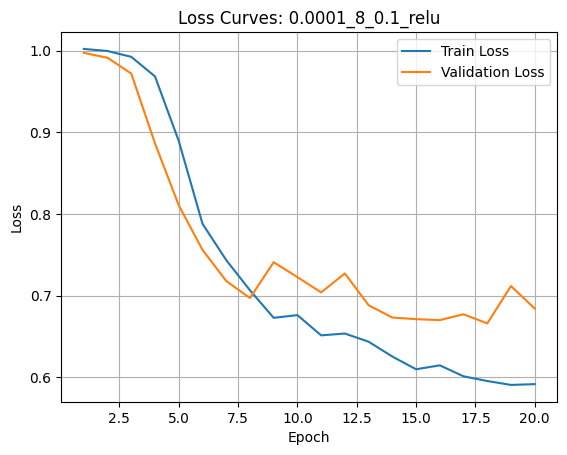

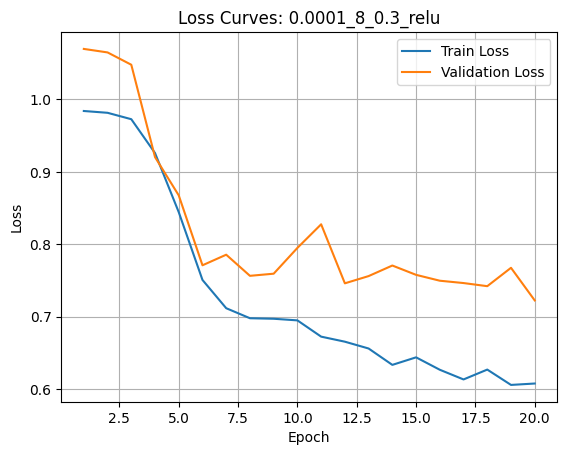

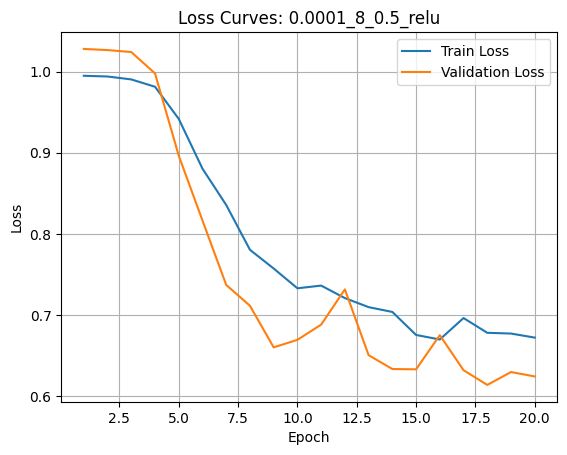

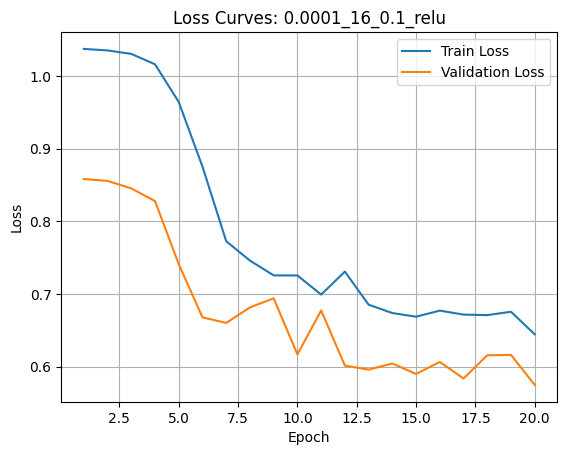

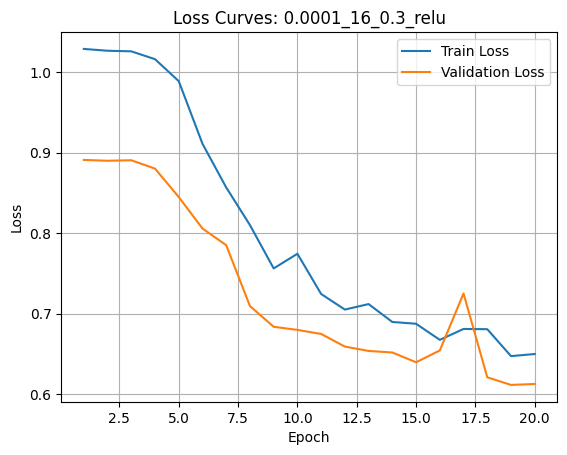

...

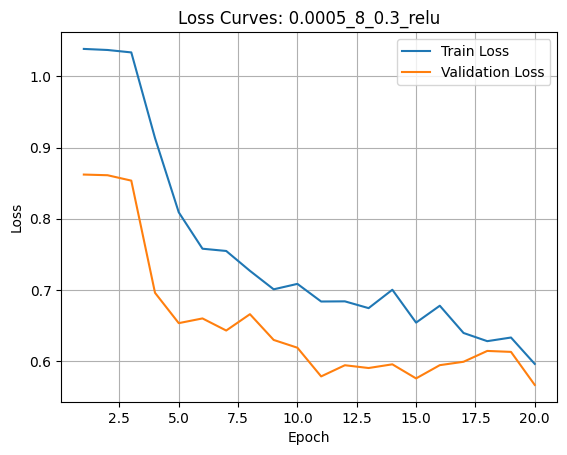

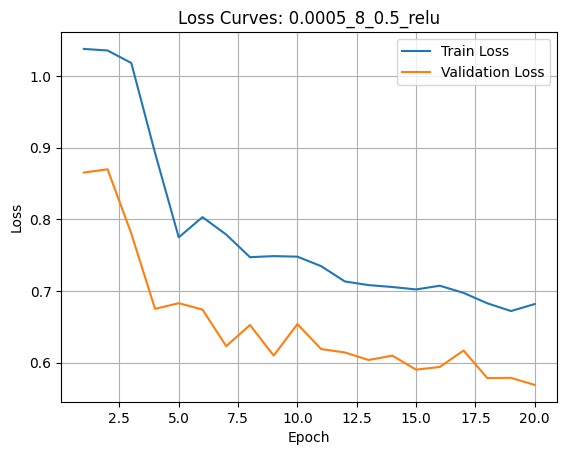

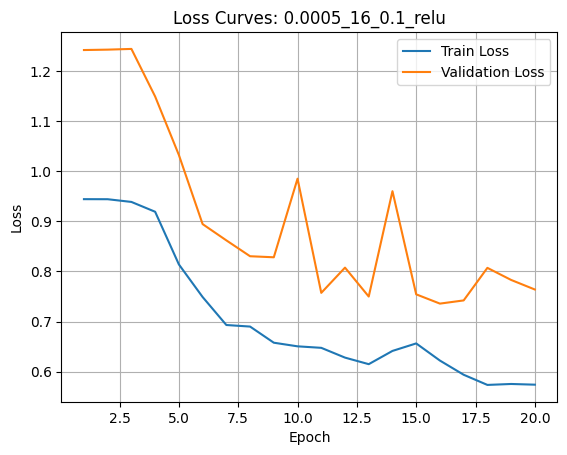

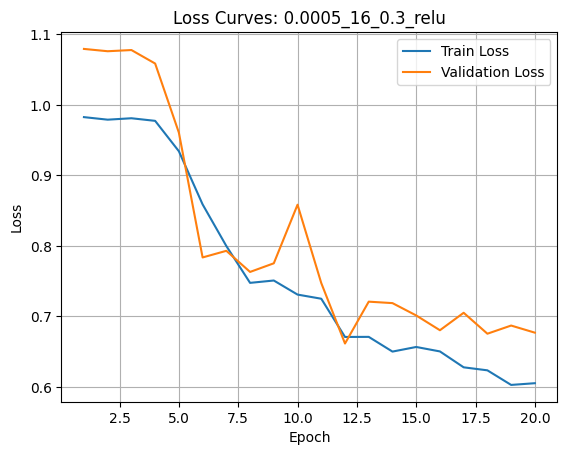

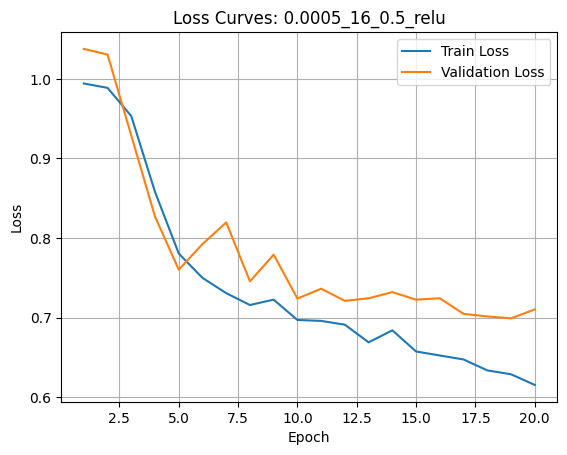

In [19]:
import matplotlib.pyplot as plt

for exp_key, (train_losses, val_losses) in relu_dict.items():
    epochs = range(1, len(train_losses) + 1)

    plt.figure()  # one figure per experiment
    plt.plot(epochs, train_losses, label="Train Loss")
    plt.plot(epochs, val_losses, label="Validation Loss")

    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"Loss Curves: {exp_key}")
    plt.legend()
    plt.grid(True)

    plt.show()


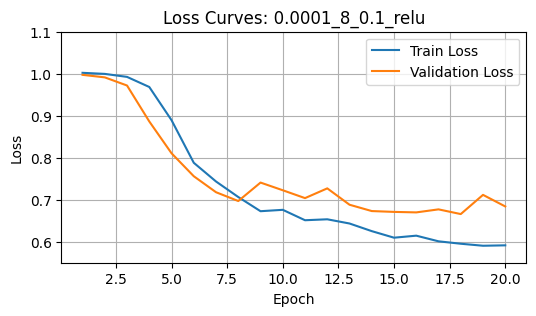

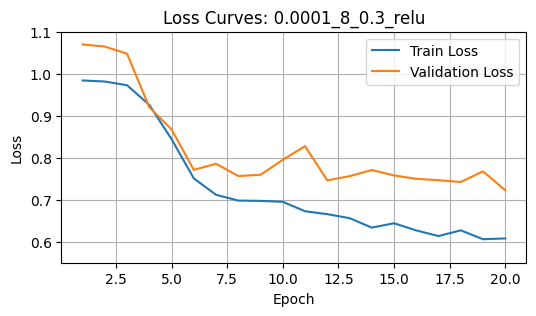

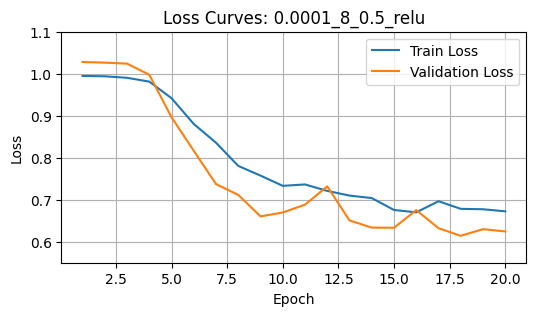

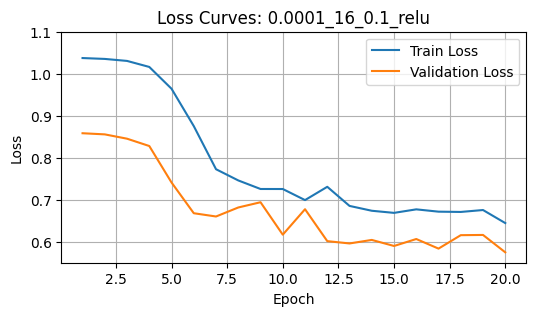

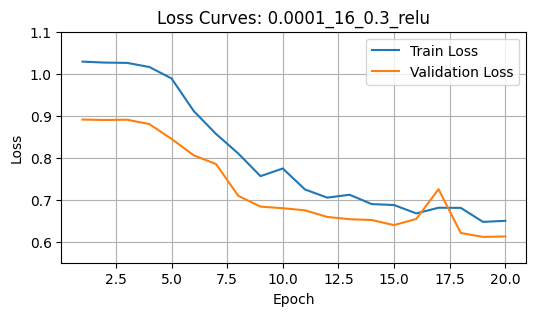

...

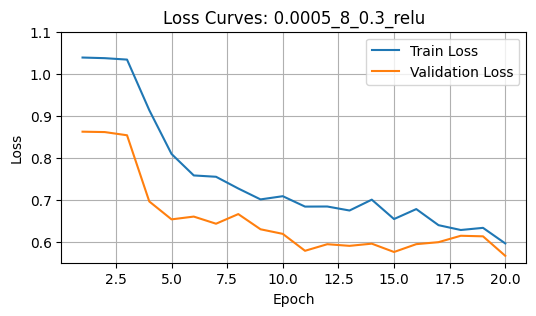

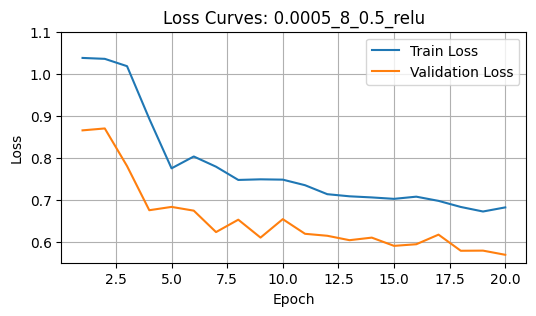

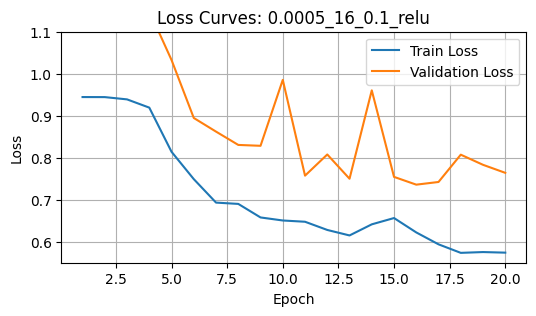

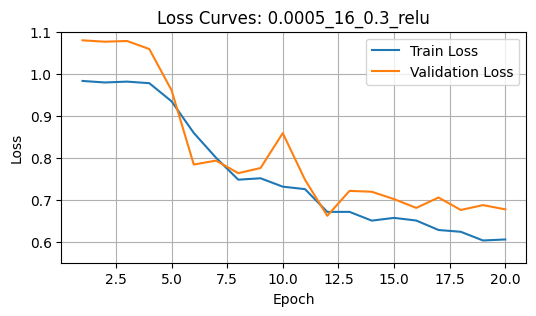

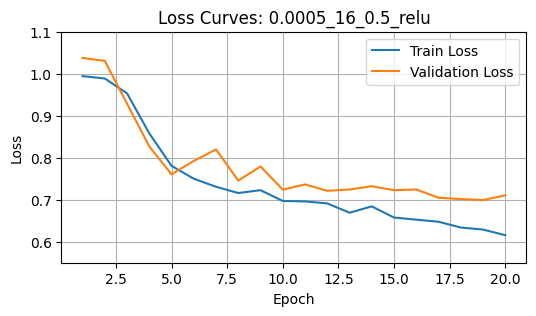

In [23]:
import matplotlib.pyplot as plt

for exp_key, (train_losses, val_losses) in relu_dict.items():
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(6,3))  # one figure per experiment
    plt.plot(epochs, train_losses, label="Train Loss")
    plt.plot(epochs, val_losses, label="Validation Loss")

    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.ylim(0.55, 1.1)
    plt.title(f"Loss Curves: {exp_key}")
    plt.legend()
    plt.grid(True)

    plt.show()


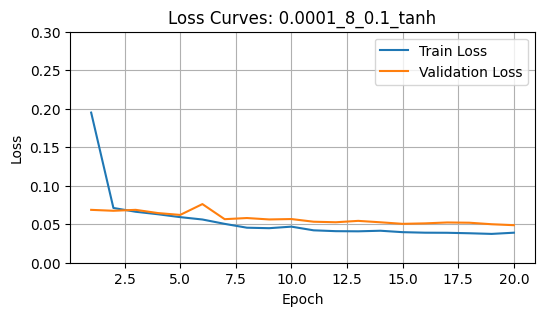

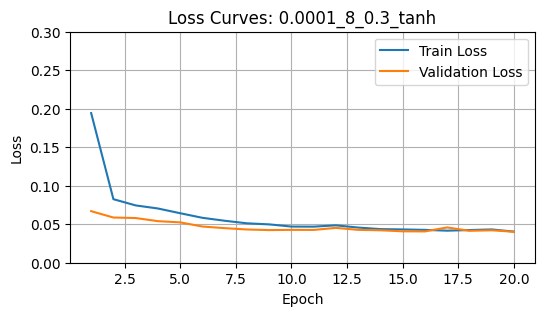

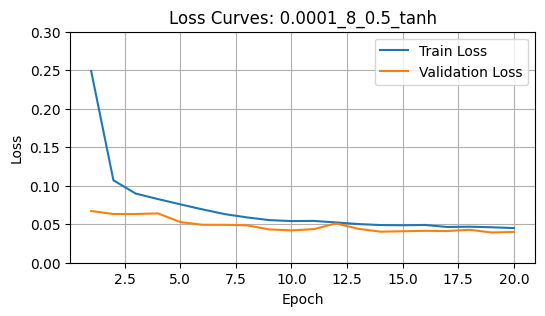

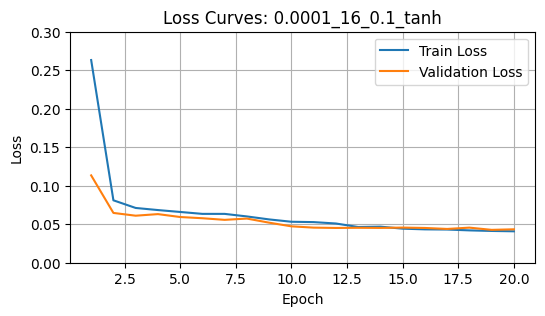

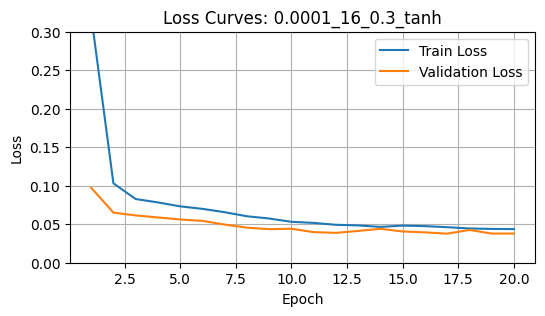

...

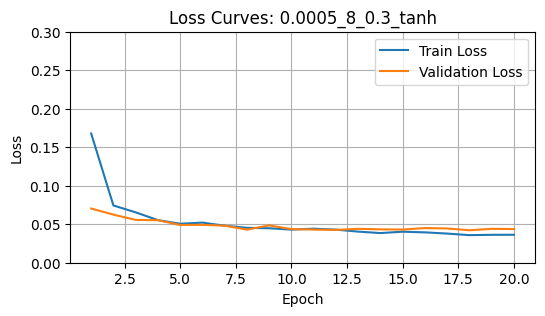

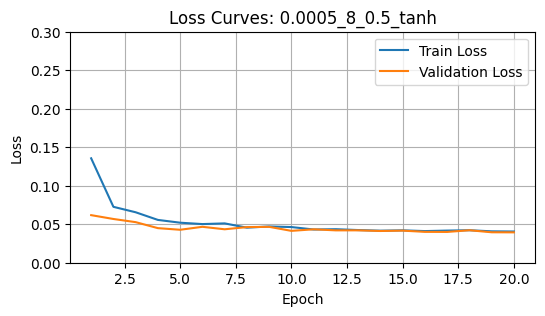

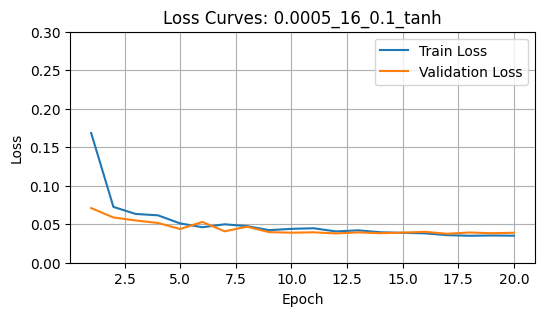

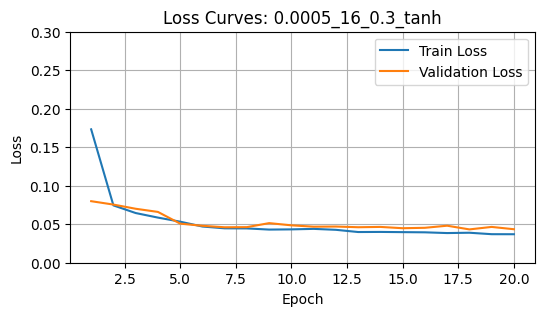

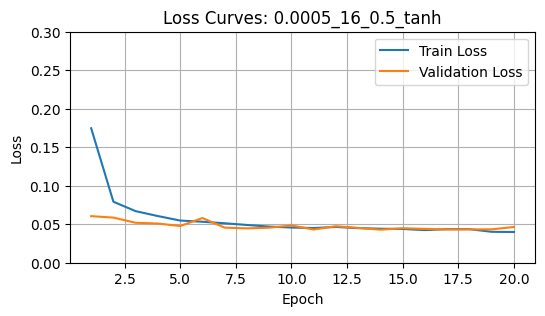

In [28]:
import matplotlib.pyplot as plt

for exp_key, (train_losses, val_losses) in tanh_dict.items():
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(6,3))  # one figure per experiment
    plt.plot(epochs, train_losses, label="Train Loss")
    plt.plot(epochs, val_losses, label="Validation Loss")

    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.ylim(0.0, 0.3)
    plt.title(f"Loss Curves: {exp_key}")
    plt.legend()
    plt.grid(True)

    plt.show()


In [29]:
tanh_dict

{'0.0001_8_0.1_tanh': ([0.19496313098167617,
   0.0711065266458761,
   0.06619033731874965,
   0.06295612708680214,
   0.05920062589621733,
   0.056136810324258275,
   0.05047123007003277,
   0.04548215058942636,
   0.044850477593995276,
   0.04685330479627564,
   0.042072987302191674,
   0.040979671632013624,
   0.04078334175227653,
   0.04153620543342734,
   0.039682329706256354,
   0.03900083092351755,
   0.038881889233986534,
   0.038261825603152076,
   0.03742303560295748,
   0.03898980004328584],
  [0.06866161402050905,
   0.06745342288430281,
   0.06866613740292121,
   0.06449778982269483,
   0.06207534113502878,
   0.07613995096345585,
   0.056550173660901586,
   0.05803319060896325,
   0.056205412035617304,
   0.0567153906963003,
   0.05323658041714683,
   0.05255790183863302,
   0.05435822329183263,
   0.05250718374186614,
   0.05048765500230113,
   0.05110704262308249,
   0.05226685133153998,
   0.051952012059256786,
   0.04998021015501398,
   0.04874118889762661]),
 '0.0001

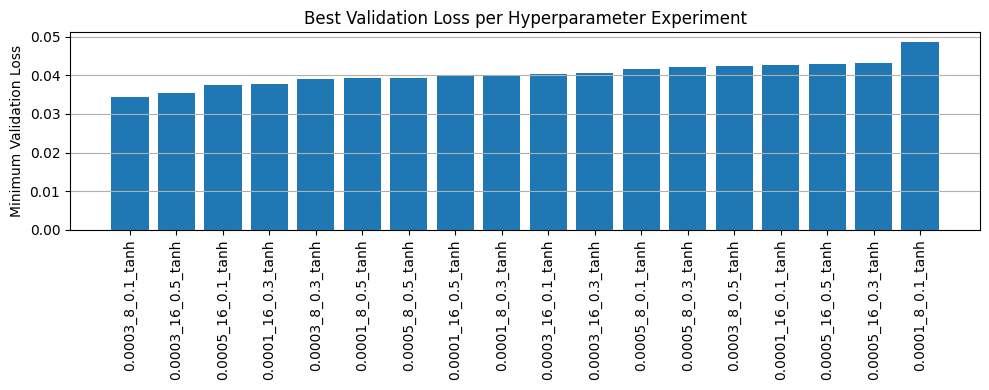

In [31]:
import numpy as np
import matplotlib.pyplot as plt

keys = []
min_vals = []

for k, (_, val) in tanh_dict.items():
    keys.append(k)
    min_vals.append(min(val))

sorted_idx = np.argsort(min_vals)
keys_sorted = [keys[i] for i in sorted_idx]
vals_sorted = [min_vals[i] for i in sorted_idx]

plt.figure(figsize=(10, 4))
plt.bar(keys_sorted, vals_sorted)
plt.xticks(rotation=90)
plt.ylabel("Minimum Validation Loss")
plt.title("Best Validation Loss per Hyperparameter Experiment")
plt.grid(axis="y")
plt.tight_layout()
plt.show()


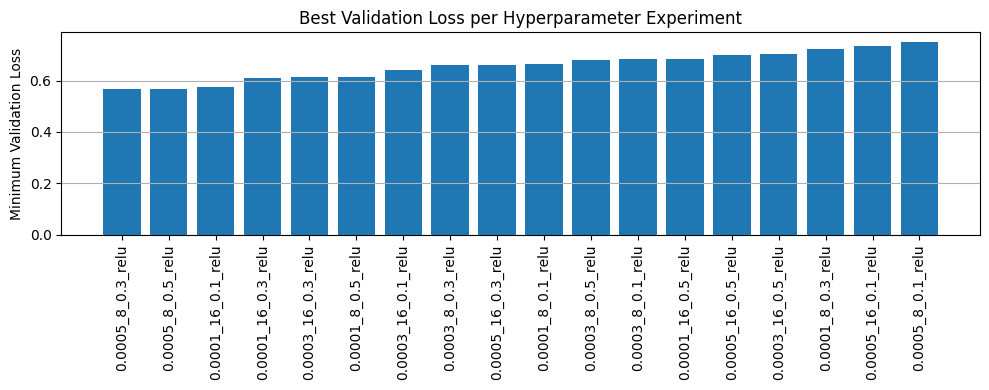

In [32]:
import numpy as np
import matplotlib.pyplot as plt

keys = []
min_vals = []

for k, (_, val) in relu_dict.items():
    keys.append(k)
    min_vals.append(min(val))

sorted_idx = np.argsort(min_vals)
keys_sorted = [keys[i] for i in sorted_idx]
vals_sorted = [min_vals[i] for i in sorted_idx]

plt.figure(figsize=(10, 4))
plt.bar(keys_sorted, vals_sorted)
plt.xticks(rotation=90)
plt.ylabel("Minimum Validation Loss")
plt.title("Best Validation Loss per Hyperparameter Experiment")
plt.grid(axis="y")
plt.tight_layout()
plt.show()


In [33]:
relu_dict

{'0.0001_8_0.1_relu': ([1.0021556625290522,
   0.9996035605195969,
   0.9924511554695311,
   0.9684026572439406,
   0.8893954011182936,
   0.7879392272896237,
   0.7433727438014651,
   0.7064062697546822,
   0.6726455425932294,
   0.6759492892121511,
   0.6511538780870891,
   0.6533978250291612,
   0.643375523506649,
   0.6252032565692115,
   0.6095960722083137,
   0.6144082283689862,
   0.6009710480769476,
   0.5951963149838977,
   0.5904262614628625,
   0.591387164261606],
  [0.9973212245881088,
   0.9913053315455519,
   0.9719079479457825,
   0.8863520678572767,
   0.8106067753213597,
   0.7559206692252572,
   0.7178382582551851,
   0.6968851896721547,
   0.740827564179428,
   0.7225317194705873,
   0.7038267616211898,
   0.7270402842619288,
   0.6880760446308166,
   0.6729962159329512,
   0.6710121518983616,
   0.669830258437029,
   0.6770307135394239,
   0.6658223182197631,
   0.7115614179551132,
   0.6839826163344496]),
 '0.0001_8_0.3_relu': ([0.9839325726978363,
   0.98144081991

In [ ]:
# add back column 21 (blind spot)
num_samples = pred_db.shape[0]

# Initialize full vector with zeros
pred_full = np.zeros((num_samples, 60))
true_full = np.zeros((num_samples, 60))

# Copy existing values before blind spot
pred_full[:, :21] = pred_db[:, :21]
true_full[:, :21] = true_db[:, :21]

# Copy values after blind spot
pred_full[:, 22:] = pred_db[:, 21:]
true_full[:, 22:] = true_db[:, 21:]

In [ ]:
# Visualization of what the CNN sees
import torch
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

def visualize_cnn_features(net, img_path, laterality="OD", vf_index=0, layer='conv1', overlay=False):
    """
    Visualize CNN activations and saliency maps for a single fundus image.
    
    Parameters:
    - net: trained CNN model
    - img_path: path to fundus image
    - laterality: 'OD' or 'OS'; OS images will be mirrored
    - vf_index: index of VF point for saliency
    - layer: 'conv1' or 'conv2' for feature maps
    - overlay: whether to overlay saliency on original image
    """
    net.eval()
    
    # --- Load image ---
    img = Image.open(img_path).convert("RGB")
    if laterality == "OS":
        img = ImageOps.mirror(img)
    transform = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485,0.456,0.406],
                             std=[0.229,0.224,0.225])
    ])
    img_tensor = transform(img).unsqueeze(0)  # [1,3,H,W]
    img_tensor.requires_grad_()
    
    # --- Forward pass to get feature maps ---
    with torch.no_grad():
        if layer == 'conv1':
            features = net.conv1(img_tensor)
        elif layer == 'conv2':
            x = F.relu(net.conv1(img_tensor))
            x = net.pool1(x)
            features = net.conv2(x)
        else:
            raise ValueError("Layer must be 'conv1' or 'conv2'")
    
    print(f"{layer} feature maps shape: {features.shape}")
    
    # Plot first 6 feature maps
    n_maps = min(6, features.shape[1])
    fig, axes = plt.subplots(1, n_maps, figsize=(15,5))
    for i in range(n_maps):
        axes[i].imshow(features[0,i].cpu(), cmap='viridis')
        axes[i].axis('off')
    plt.suptitle(f"{layer} feature maps (first {n_maps})")
    plt.show()
    
    # --- Saliency map for VF point ---
    net.zero_grad()
    output = net(img_tensor)
    output[0, vf_index].backward()
    
    saliency = img_tensor.grad.data.abs().max(dim=1)[0].squeeze()  # max over channels
    
    if overlay:
        # Convert saliency to 0-1
        sal = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
        sal = np.array(sal)
        plt.imshow(img.resize((224,224)))
        plt.imshow(sal, cmap='hot', alpha=0.5)
        plt.title(f"Saliency map overlay for VF point {vf_index}")
        plt.axis('off')
        plt.show()
    else:
        plt.imshow(saliency.cpu(), cmap='hot')
        plt.title(f"Saliency map for VF point {vf_index}")
        plt.axis('off')
        plt.show()


In [ ]:
# Example: visualize Conv1 features and saliency for VF point 0
visualize_cnn_features(net, img_path="path/to/image.jpg", laterality="OD",
                       vf_index=0, layer='conv1', overlay=True)

# To see Conv2 features
visualize_cnn_features(net, img_path="path/to/image.jpg", laterality="OD",
                       vf_index=5, layer='conv2', overlay=False)


### Pilot CNN + 60 targets

In [104]:
# Overall CNN 2 (running)
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
import numpy as np

# 1. Define CNN
class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 256, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(256, 512, kernel_size=3)  # increase out_channels to 512 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(512, 512, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(512*4*4, 1024)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=0.5)  # set random 50% of neurons to 0 in each training iterations

        self.fc2 = nn.Linear(1024, 1024)
        self.drop2 = nn.Dropout(p=0.5)

        # Output layer: map learned features to 60 predictions
        self.out = nn.Linear(1024, 60)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        x = self.out(x)
        
        return x

# 2. Image transformation function (with augmentation across training epochs)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform(img)

# 3. Prepare dataset
scaler_y = StandardScaler()

cols = ['IOP','0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20','21',
        '22','23','24','25','26','28','29','30','31','32','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

targets_scaled = scaler_y.fit_transform(GRAPE_followup_df_images[cols].values)  # scale target values

# prepare dataset: list of (img_tensor, feature_tensor) tuples
dataset = []
for index, row in GRAPE_followup_df_images.iterrows():
    img_tensor = tensor_transform(row["Corresponding CFP"])
    target_tensor = torch.from_numpy(targets_scaled[index]).float()
    dataset.append((img_tensor, target_tensor))

images = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split

batch_size = 8
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)  # shuffle=True -> random image order during each training epoch
valloader = DataLoader(valset, batch_size=batch_size)

# 4. Training setup
net = NeuralNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=1e-4)
# reduce learning rate across epochs if loss stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)  

# 5. Training / validation functions
def train_one_epoch():
    net.train()
    running_loss = 0.0

    for inputs, labels in trainloader:
        labels = labels.float()
        optimizer.zero_grad()  # clear out gradients stored from previous batch iterations

        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)  # weight by batch size (inputs.size(0))

    avg_loss = running_loss / len(trainloader.dataset)
    print(f"Train loss: {avg_loss}")
    return avg_loss

def validate_one_epoch():
    net.eval()
    running_loss = 0.0

    with torch.no_grad():  # validation doesn't need weight updates; inactivate gradient tracking and updating
        for inputs, labels in valloader:
            labels = labels.float()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)

    avg_loss = running_loss / len(valloader.dataset)
    print(f"Validation loss: {avg_loss:.4f}")
    return avg_loss

# 6. Training loop with early stopping (this is from gpt)
num_epochs = 20
best_val_loss = float('inf')
patience = 5
patience_counter = 0

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    train_loss = train_one_epoch()
    val_loss = validate_one_epoch()

    scheduler.step(val_loss)  # adjust LR if plateau

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(net.state_dict(), "best_model.pt")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered")
            break


The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.

Epoch 1/20


KeyboardInterrupt: 

In [ ]:
# predictions on validation set
net.eval()
all_preds = []
all_trues = []

with torch.no_grad():
    for x, y in valloader:
        pred = net(x).cpu().numpy()
        all_preds.append(pred)
        all_trues.append(y.numpy())

all_preds = np.vstack(all_preds)
all_trues = np.vstack(all_trues)

### things to consider doing next with target predictions:  
- plot error loss over epochs
- plot subset of filter outputs for representative image (e.g., 16 filters)
- use actual mean, std of image set instead of stock mean, std

Evaluation:  
- plot correlation between predicted and ground truth for each target
- calculate RMSE for each target
- calculate mean RMSE across all targets


### Other notes/planning/reference code

In [ ]:
# Overall CNN
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split

optimizer = optim.Adam(net.parameters(), lr = 0.0001)

class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()

        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 256, kernel_size = 3)
        self.pool1 = nn.MaxPool2d(2,2)  # Takes max value from kernel window

        self.conv2 = nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size = 3)
        self.pool2 = nn.MaxPool2d(2,2)  # Takes max value from kernel window

        self.conv3 = nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 2)
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))
        #self.pool3 = nn.MaxPool2d(2,2)  # Takes max value from kernel window

        self.flatten = nn.Flatten()

        # standard fully connected layers
        self.fc1 = nn.Linear(1024*4*4, 1024)
        #self.fc1 = nn.Linear(in_features = 4096, out_features = 1024)
        self.drop1 = nn.Dropout(p=0.3)

        # standard fully connected layers
        self.fc2 = nn.Linear(in_features = 1024, out_features = 1024)
        self.drop2 = nn.Dropout(p=0.3)

        # ouput layer
        self.out = nn.Linear(in_features = 1024, out_features = 60)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        x = self.out(x)
        
        return x


def tensor_transform(image):
    transform = transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor(),
                                   transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225]]))  # resize & transform jpg to tensor, use stats from ImageNet dataset
    img = Image.open(image) 
    tensor_image = transform(img)
    return tensor_image

net = NeuralNet()

num_params = 0
for x in net.parameters():
    num_params += len(torch.flatten(x))

criterion = nn.MSELoss() 

def train_one_epoch():
    net.train(True)  # training mode
    running_loss = 0.0

    for batch_index, data in enumerate(trainloader):
        inputs,labels = data[0], data[1]  # data = (image, label)
        labels = labels.float()
        
        optimizer.zero_grad()  # reset the gradients

        outputs = net(inputs)
        loss = criterion(outputs, labels)
        running_loss += loss.item()
        loss.backward()
        optimizer.step()

        if batch_index % 500 == 499:
            avg_loss_across_batches = running_loss / 500
            print(f"Batch {batch_index+1}, loss = {avg_loss_across_batches}")

            running_loss = 0.0

def validate_one_epoch():
    net.train(False)  # validation mode
    running_loss = 0.0

    for batch_index, data in enumerate(valloader):
        inputs,labels = data[0], data[1]  # data = (image, label)
        labels = labels.float()
    
        with torch.no_grad():
            outputs = net(inputs)  # (batch_size, 60)
            loss = criterion(outputs, labels)  # MSELoss or L1Loss
            running_loss += loss.item()
        
        avg_loss_across_batches = running_loss / len(valloader)
        print(f"Validation loss = {avg_loss_across_batches}")

scaler = StandardScaler()
dataset = []
cols = ['IOP', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
'10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21',
'22', '23', '24', '25', '26', '28', '29', '30', '31', '32', '33',
'34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45',
'46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57',
'58', '59']  # remove index 27, (-1)

scaler.fit_transform(GRAPE_followup_df_images[cols].values)

for index, row in GRAPE_followup_df_images.iterrows():
    tensor_image = tensor_transform(row["Corresponding CFP"])
    feature_vector = row[cols].values.reshape(1, -1)
    feature_vector_scaled = scaler.transform(feature_vector)
    tensor_feature_vector_scaled = torch.from_numpy(feature_vector_scaled).float().squeeze(0)
    dataset.append((tensor_image, tensor_feature_vector_scaled))

# dataset is a list of (img_tensor, feature_tensor)
images  = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size

trainset, valset = random_split(full_dataset, [train_size, val_size])

batch_size = 8

trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
valloader   = DataLoader(valset, batch_size=batch_size)

# training loop

num_epochs = 10

for epoch_index in range(num_epochs):

    train_one_epoch()

    validate_one_epoch()

    


In [ ]:
# Overall CNN 2 (running)
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
import numpy as np

# 1. Define CNN
class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()

        # Convolutional layers: extract local spatial patterns
        # convolution layer 1: lines, edges, simpler textures
        self.conv1 = nn.Conv2d(3, 256, kernel_size=3)  # in_channels, out_channels, kernel size (3x3)
        self.pool1 = nn.MaxPool2d(2,2)  # max pooling layer; reduce spatial size of feature maps by 1/2: (kernel_size, stride)

        # convolution layer 2: more complex patterns
        self.conv2 = nn.Conv2d(256, 512, kernel_size=3)  # increase out_channels to 512 to accommodate more complex features
        self.pool2 = nn.MaxPool2d(2,2)

        self.conv3 = nn.Conv2d(512, 512, kernel_size=2)  # capture finer-grained detail in feature maps
        self.pool3 = nn.AdaptiveAvgPool2d((4,4))  # average pooling layer (take average instead of max value); apparently better for regression tasks

        self.flatten = nn.Flatten()  # convert 2D tensor to 1D tensor

        # Fully connected (dense) layers: learn relationships among features
        # Dense layer 1: 
        self.fc1 = nn.Linear(512*4*4, 1024)  # out_features, in_features: 1024 neurons are going to learn weighted combination of 512x4x4 features
        self.drop1 = nn.Dropout(p=0.5)  # set random 50% of neurons to 0 in each training iterations

        self.fc2 = nn.Linear(1024, 1024)
        self.drop2 = nn.Dropout(p=0.5)

        # Output layer: map learned features to 60 predictions
        self.out = nn.Linear(1024, 60)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.drop1(x)

        x = F.relu(self.fc2(x))
        x = self.drop2(x)

        x = self.out(x)
        
        return x

# 2. Image transformation function (with augmentation across training epochs)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

def tensor_transform(image_path):
    img = Image.open(image_path).convert('RGB')
    return transform(img)

# 3. Prepare dataset
scaler_y = StandardScaler()

cols = ['IOP','0','1','2','3','4','5','6','7','8','9',
        '10','11','12','13','14','15','16','17','18','19','20','21',
        '22','23','24','25','26','28','29','30','31','32','33',
        '34','35','36','37','38','39','40','41','42','43','44','45',
        '46','47','48','49','50','51','52','53','54','55','56','57',
        '58','59']

targets_scaled = scaler_y.fit_transform(GRAPE_followup_df_images[cols].values)  # scale target values

# prepare dataset: list of (img_tensor, feature_tensor) tuples
dataset = []
for index, row in GRAPE_followup_df_images.iterrows():
    img_tensor = tensor_transform(row["Corresponding CFP"])
    target_tensor = torch.from_numpy(targets_scaled[index]).float()
    dataset.append((img_tensor, target_tensor))

images = torch.stack([item[0] for item in dataset])
targets = torch.stack([item[1] for item in dataset])

full_dataset = TensorDataset(images, targets)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
trainset, valset = random_split(full_dataset, [train_size, val_size]) # [train_size, val_size] = how many samples go into each split

batch_size = 8
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)  # shuffle=True -> random image order during each training epoch
valloader = DataLoader(valset, batch_size=batch_size)

# 4. Training setup
net = NeuralNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=1e-4)
# reduce learning rate across epochs if loss stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)  

# 5. Training / validation functions
def train_one_epoch():
    net.train()
    running_loss = 0.0

    for inputs, labels in trainloader:
        labels = labels.float()
        optimizer.zero_grad()  # clear out gradients stored from previous batch iterations

        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)  # weight by batch size (inputs.size(0))

    avg_loss = running_loss / len(trainloader.dataset)
    print(f"Train loss: {avg_loss}")
    return avg_loss

def validate_one_epoch():
    net.eval()
    running_loss = 0.0

    with torch.no_grad():  # validation doesn't need weight updates; inactivate gradient tracking and updating
        for inputs, labels in valloader:
            labels = labels.float()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)

    avg_loss = running_loss / len(valloader.dataset)
    print(f"Validation loss: {avg_loss:.4f}")
    return avg_loss

# 6. Training loop with early stopping (this is from gpt)
num_epochs = 20
best_val_loss = float('inf')
patience = 5
patience_counter = 0

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    train_loss = train_one_epoch()
    val_loss = validate_one_epoch()

    scheduler.step(val_loss)  # adjust LR if plateau

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(net.state_dict(), "best_model.pt")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered")
            break



Epoch 1/20
Train loss: 0.9706
Validation loss: 1.0423

Epoch 2/20
Train loss: 0.9689
Validation loss: 1.0390

Epoch 3/20
Train loss: 0.9581
Validation loss: 1.0173

Epoch 4/20
Train loss: 0.9250
Validation loss: 0.9240

Epoch 5/20
Train loss: 0.8646
Validation loss: 0.7798

Epoch 6/20
Train loss: 0.8021
Validation loss: 0.7422

Epoch 7/20
Train loss: 0.7715
Validation loss: 0.7397

Epoch 8/20
Train loss: 0.7451
Validation loss: 0.6674

Epoch 9/20
Train loss: 0.7284
Validation loss: 0.6957

Epoch 10/20
Train loss: 0.7405
Validation loss: 0.8029

Epoch 11/20
Train loss: 0.7328
Validation loss: 0.6570

Epoch 12/20
Train loss: 0.6871
Validation loss: 0.7109

Epoch 13/20
